# Project Integration

For our project we will implement logistic regression and train it to classify locations of high poverty and low poverty using satellite imagery of Uganda. This will be a complete machine learning experiment, using a training, validation, and testing set, so we will implement cross validation as well.

##Set Up

In [ ]:
from google.colab import drive
drive.flush_and_unmount()
drive.mount('/content/drive')

Drive not mounted, so nothing to flush and unmount.
Mounted at /content/drive


In [ ]:
# change to make it work for you when running

import sys
#your path to the project folder
# dep_path = '/content/drive/MyDrive/AI4ALL2021CV/Computer Vision 2021/Project/'
dep_path_riya = '/content/drive/My Drive/Project/'
# dep_path_henry = '/content/drive/MyDrive/Project/'
# dep_path_tanisha = 
# dep_path_mahnum = 
# sys.path.append(dep_path_riya)
# ROOT_DIR = dep_path_riya

sys.path.append(dep_path_riya)
ROOT_DIR = dep_path_riya

In [ ]:
import numpy as np
from itertools import *
import h5py
import os
from sklearn.metrics import f1_score, roc_auc_score, accuracy_score
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from PIL import Image
from scipy.stats import mode
from sklearn.metrics import confusion_matrix

# Training Essentials

##Basic Feature Extraction: Histograms


In [ ]:
def image_to_histogram(x, bins, use_hsv):
    """
    Inputs:
    x - a single image.
    bins - the number of bins your histograms should have for each channel
    use_hsv - determines if images are stored in RGB or HSV format.
    
    Returns:
    h - a single histogram. It's shape should be (3 x bins,)
    """
    if use_hsv: # convert an RGB to an HSV function
        x = rgb_to_hsv(x)
    h = np.zeros((3*bins,))
    ## YOUR CODE HERE
    x0 = x[:,:,0]
    x1 = x[:,:,1]
    x2 = x[:,:,2]

    h[:bins] = np.histogram(x0, bins, range=(0,1))[0]
    h[bins:bins*2] = np.histogram(x1, bins, range=(0,1))[0]
    h[bins*2:bins*3] = np.histogram(x2, bins, range=(0,1))[0]

    ## END YOUR CODE
    assert h is not None, "You must store a histogram in h!"
    return h


(768, 1024, 3)


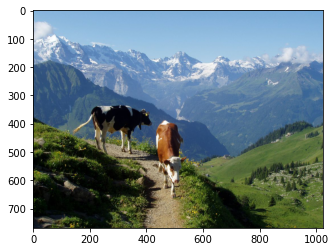

In [ ]:
testpic = Image.open('/content/drive/My Drive/Project/data/sample_images/img1.jpg')
# testpic = Image.open('/content/drive/MyDrive/AI4ALL2021CV/Computer Vision 2021/Project/data/sample_images/img1.jpg')
plt.imshow(testpic)
pic_arr = np.asarray(testpic)/255.
print(pic_arr.shape)

In [ ]:
hist_data = image_to_histogram(pic_arr, 20, False)
print(hist_data)
print(np.sum(hist_data))
print(pic_arr.size)
print(np.unique(pic_arr))

[ 79629.  29821.  19902.  52600.  50552.  63365.  82440.  65796.  60753.
  47748.  71424.  62320.  42679.  20111.  12194.   7120.   5731.   5658.
   3719.   2870.  55311.  44208.  20350.  14633.  17751.  28429.  66370.
  42392.  95897.  75366.  55859.  47815.  24155.  41917.  78299.  55051.
   7871.   6442.   5004.   3312. 101888.  41654.  37180.  33542.  41888.
  29699.  18615.  12109.  16041.  60146.  34871.  41094.  37439.  37260.
  39252.  23190.  20482. 145179.   9959.   4944.]
2359296.0
2359296
[0.         0.00392157 0.00784314 0.01176471 0.01568627 0.01960784
 0.02352941 0.02745098 0.03137255 0.03529412 0.03921569 0.04313725
 0.04705882 0.05098039 0.05490196 0.05882353 0.0627451  0.06666667
 0.07058824 0.0745098  0.07843137 0.08235294 0.08627451 0.09019608
 0.09411765 0.09803922 0.10196078 0.10588235 0.10980392 0.11372549
 0.11764706 0.12156863 0.1254902  0.12941176 0.13333333 0.1372549
 0.14117647 0.14509804 0.14901961 0.15294118 0.15686275 0.16078431
 0.16470588 0.16862745 0.1

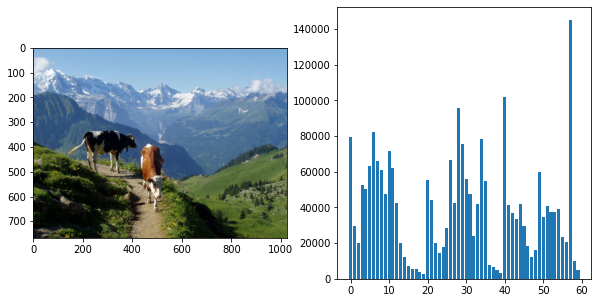

In [ ]:
f, axs = plt.subplots(1,2, figsize=(10,5))
axs[0].imshow(pic_arr)
axs[1].bar(np.arange(len(hist_data)), hist_data)
plt.show()

##Basic Model: Logistic Regression

Step 1: Define stochastic/mini batch gradient descent for logistic regression.

In [ ]:
def create_batches(data, labels, batch_size):
    data_batch = np.array_split(data, len(data)/batch_size)
    labels_batch = np.array_split(labels, len(labels)/batch_size)
    return data_batch, labels_batch


def sigmoid(x):
    """
    Given a single value x, return the output of the sigmoid activation function.

    HINT: You can use np.exp(x) function above for e^x
    HINT: The formula for sigmoid can be found on Wikipedia:
          https://en.wikipedia.org/wiki/Sigmoid_function
    """
    ## YOUR CODE HERE
    result = (1/(1 + np.exp(-x)))
    ## END YOUR CODE
    return result 


def predict_probability(data, weights):
    """
    Use the data and weights to calculate a probability for each data point.
    For example, if "data" has 100 rows, this function should return an array
    with 100 numbers between 0 and 1.

    HINT: "dot products" can be done with np.dot(...)
    HINT: Use the sigmoid function which can be called with s_curve(...)
    HINT: data is of shape (dataset size, num features), and weights is 
    of shape (num features, 1)
    """
    pred = None
    ## YOUR CODE HERE
    score = np.dot(data, weights)
    pred = sigmoid(score)
    ## END YOUR CODE
    return pred[...,None]


def sgd(data, labels, weights, learning_rate, regularization_rate):
    """
    Loop over all the data and labels, one at a time, and update the weights using the logistic
    regression learning rule.

    HINT: You will need "predict_probability" to complete this function.
    HINT: As before, data is of shape (dataset size, num features), and weights is 
    of shape (num features, 1)
    HINT: during each iteration of the loop, you call predict probability, apply the logistic
    regression rule, and then perform the regularization update.
    """
    ## YOUR CODE HERE
    assert labels.shape[0] == data.shape[0]
    
    for i in range(data.shape[0]):
        weights -= learning_rate*data[i,:]*(predict_probability(data[i,:], weights) - labels[i])
        weights -= 2*learning_rate*regularization_rate*weights
    ## END YOUR CODE
    return weights


def mini_batch_gd(data, labels, weights, learning_rate, regularization_rate, batch_size):
    """
    Loop over all the data and labels and update the weights using the logistic
    regression learning rule, averaged over multiple samples.

    HINT: You should use the "create_batches" function below.
    HINT: This function will be very similar to "sgd", but you will need to use
    np.mean(...) to average up multiple gradients.
    """
    data_batch, labels_batch = create_batches(data, labels, batch_size)
    ## YOUR CODE HERE
    for i in range(len(data_batch)):
        error = predict_probability(data_batch[i], weights) - labels_batch[i]
        error = np.mean(data_batch[i]*error, axis=0) 

        weights -= learning_rate*error
        weights -= 2*learning_rate*regularization_rate*weights

    ## END YOUR CODE
    return weights

Here we provide a couple of helpful helper functions.

In [ ]:
def check_training_progress(weights, epoch, epochs):
    if epoch in np.linspace(10,epochs + 10,10).astype("int32"):
        print("Epoch: {}/{}".format(epoch,epochs))
    exploded = np.isnan(np.sum(weights))
    if exploded:
        s = "Your model exploded! "
        s += "Try a smaller learning or regularization rate"
        print(s)
    return exploded

def visualize_epochs(model, losses):
    plt.plot(losses)
    ax = plt.gca()
    ax.set_title("{}".format(model.name))
    ax.set_xlabel("epochs")
    ax.set_ylabel("loss")
    plt.show()

Here are some helpful evaluation metrics implemented.

In [ ]:
def compute_accuracy(model, data, labels):
    pred = (model.predict(data) > 0.5).astype("int32")
    score = accuracy_score(labels, pred)
    return score

def compute_area_under_curve(model, data, labels):
    pred = (model.predict(data) > 0.5).astype("int32")
    score = roc_auc_score(labels, pred)
    return score

def compute_f1(model, data, labels):
    pred = (model.predict(data) > 0.5).astype("int32")
    score = f1_score(labels, pred)
    return score

def compute_all_scores(model, data, labels, verbose = True):
    acc = compute_accuracy(model, data, labels)
    auc = compute_area_under_curve(model, data, labels)
    f1 = compute_f1(model, data, labels)
    if verbose:
      s = "{} - acc: {:.2f}; auc: {:.2f}; f1: {:.2f}".format(model.name, acc, auc, f1)
      print(s)
    return acc, auc, f1

Step 2: define your logistic regression class.

In [ ]:
class LogisticRegression():
    """
    A class for the logistic regression classifier. It has a "predict" method
    for assigning labels to inputs, and a "train" method for updating its
    weights.
    """
    def __init__(self, num_features, learning_rate, regularization_rate,
            batch_size, epochs):
        self._epochs = epochs
        self._batch_size = batch_size
        self._learning_rate = learning_rate
        self._regularization_rate = regularization_rate
        self._weights = np.random.randn(num_features)
        self.name = "Logistic Regression(lr:{} ; rr:{} ; bs:{})".format(
                learning_rate,
                regularization_rate,
                batch_size
                )

    """
    We want to pass in 'data' as a numpy array of shape 
    (dataset size, num features), and we want to compute the probability
    of class 1, p(y=1 | x) 

    HINT: Use self._weights and predict_probability() in this function, and
          think about what predict_probability() does for you
    """
    def predict(self, data):
        pred = None
        ## YOUR CODE HERE
        weights = self._weights
        pred = predict_probability(data, weights)
        ## END YOUR CODE
        return pred

    """
    This function trains the weights for our logistic regression model. We have
    a few functions at our disposal: sgd(), mini_batch_gd(), and self.compute_loss().
    Refer to your implementation of sgd(), mini_batch_gd() for how to use them: they
    return an updated weight matrix after executing one epoch of their algorithm

    """
    def train(self, data, labels, visualize=True):
        weights = self._weights
        learning_rate = self._learning_rate
        regularization_rate = self._regularization_rate
        batch_size = self._batch_size
        epochs = self._epochs

        losses = []
        for e in range(epochs):
            if check_training_progress(weights, e, epochs): break
            # Here, get your updated weights
            # if the batch size is above one, use mini batch gd
            # else use normal Stochastic Gradient Descent

            ## YOUR CODE HERE
            if batch_size > 1:
                weights = mini_batch_gd(data, labels, weights, learning_rate,
                        regularization_rate, batch_size)
            else:
                weights = sgd(data, labels, weights, learning_rate, regularization_rate)
            ## END YOUR CODE
            loss = self.compute_loss(data, labels)
            losses.append(loss)
        self._weights = weights
        if visualize:
          visualize_epochs(self,losses)
        return losses

    """
    Here, we will compute the value of our loss function with our current weights.
    We get our models predictions on the given data with self.predict

    Your job is to compute the loss function as specified in the slides. You get
    loss for each example, so use np.mean to average over our dataset
    """
    def compute_loss(self, data, labels):
        p = self.predict(data)
        loss = None
        ## YOUR CODE HERE
        # -np.log(p)*labels computes -np.log(p[i]) only for the examples of class 1
        # where labels[i]==1, while -np.log(1-p)*(1-labels) computes
        # -np.log(1-p[i]) only for the examples of class 0 where labels[i]==0

        # loss ends up containing the correct loss for each example loss[i], so
        # then we average them
        p = np.squeeze(self.predict(data))
        labels = np.squeeze(labels)
        # loss = -np.log(p)*labels - np.log(1-p)*(1-labels)
        loss = p-p*labels + np.log(1 + np.exp(-p))
        loss = np.mean(loss)
        ## END YOUR CODE   
        return loss

    def compute_accuracy(self, data, labels):
        pred = (self.predict(data) > 0.5).astype("int32")
        acc = accuracy_score(pred, labels)
        return acc

##Train-Validation Split

Aside from the test set, we also need a validation set. Discuss why validation set is necessary and implement the following code for spliting the dataset.

In [ ]:
def shuffle_data(H, y):
    np.random.seed(0)
    p = np.random.permutation(len(H))
    return H[p], y[p]

def split_dataset(features, labels):
  """Split the dataset.

  You must slice the data and labels into a training and validation set.
  Try using roughly 10% of your training data for the validation!
  """
  ## YOUR CODE HERE
  # data_train, data_validation, labels_train, labels_validation = train_test_split(features, labels, test_size=0.1) # getting validation set, not test set
  num_examples = int(features.shape[0]*0.9)
  
  data_train = features[:num_examples]
  data_validation = features[num_examples:]
  labels_train = labels[:num_examples]
  labels_validation = labels[num_examples:]

  ## END YOUR CODE
  return data_train, labels_train, data_validation, labels_validation

## Unit Testing

In big software projects like this, engineers usually do Unit Tests: We take small units of code and test them on a few inputs and outputs, to make sure they're working. After implementing your model helper functions, try running the tests below to see if you have any bugs you might have overlooked:

In [ ]:
def test_predict_probability():
    true_pred = np.array([[0.009727],
                         [ 0.80695073],
                         [ 0.47222148],
                         [ 0.50962809],
                         [ 0.94832398],
                         [ 0.39283667],
                         [ 0.94318405],
                         [ 0.54676926],
                         [ 0.26353454],
                         [ 0.80562677]])
    np.random.seed(0)
    data = np.random.randn(10,5)
    weights = np.random.randn(5)
    pred = predict_probability(data, weights)
    if np.allclose(true_pred, pred):
        print('Your "predict_probability" function seems to be working!')
    else:
        print('It looks like there\'s a bug in your "predict_probability" function')

def test_sgd():
    true_weights = np.array(
        [ 1.1061014, -0.43975806, 0.41866945, -0.04332176, 1.46282657]
        #[ 1.09523196, -0.43548978,  0.41456338, -0.04298213,  1.44849388]
        )

    np.random.seed(0)
    data = np.random.randn(10,5)
    labels = np.random.randint(0,2,(10,))
    weights = np.random.randn(5)
    learning_rate = 0.01
    regularization_rate = 0.001

    weights = sgd(data, labels, weights, learning_rate, regularization_rate)
    if np.allclose(true_weights, weights):
        print('Your "sgd" function seems to be working!')
    else:
        print('It looks like there\'s a bug in your "sgd" function')

def test_mini_batch_gd():
    true_weights = np.array(
        [ 0.62300158, 1.78585614, 0.16830617, -1.7155841, 0.16426195, -0.86316242] #[ 0.6217815, 1.78235447, 0.16797774, -1.71221836, 0.16394118, -0.8614746 ]
        )

    np.random.seed(0)
    data = np.random.randn(10,6)
    labels = np.random.randint(0,2,(10,)).reshape((10, 1))
    weights = np.random.randn(6)
    learning_rate = 0.01
    regularization_rate = 0.001
    batch_size = 5

    weights = mini_batch_gd(data, labels, weights, learning_rate, regularization_rate, batch_size)
    if np.allclose(true_weights, weights):
        print('Your "mini_batch_gd" function seems to be working!')
    else:
        print('It looks like there\'s a bug in your "mini_batch_gd" function')

test_predict_probability()
test_sgd()
test_mini_batch_gd()


Your "predict_probability" function seems to be working!
Your "sgd" function seems to be working!
Your "mini_batch_gd" function seems to be working!


# Toy Example: Classifying Trucks and Planes

Before testing your code on a hard problem (like poverty mapping), it makes sense to make sure everything works for an easier one first. Run your implementation of **cross validation** below to launch your experiment on the **Trucks and Planes** dataset.

##Data Processing

###Load Data

In [ ]:
with h5py.File(
    os.path.join(ROOT_DIR, "data/assorted_images/trucks_and_planes.h5"),
    "r") as hf:
  X_cifar = hf["data"][...] / 255.
  y_cifar = hf["labels"][...]

np.random.seed(0)
assign = np.random.permutation(len(X_cifar))
cifar_cutoff = int(0.7 * len(X_cifar))
cifar_train_assign = assign[:cifar_cutoff]
cifar_test_assign = assign[cifar_cutoff:]

The code above also create a random train-test split.

###Extract Histogram Features

In [ ]:
def extract_trucksplanes_histograms(bins, use_hsv, test = False):
    if not test:
      X = X_cifar[cifar_train_assign]
    else:
      X = X_cifar[cifar_test_assign]


    H = []
    for i, img in enumerate(X):
        if (i + 1) % 500 == 0:
            print("Extracted {} of {} histograms".format(i+1,len(X)))
        h = image_to_histogram(img, bins=bins, use_hsv=use_hsv)
        H.append( h )

    print("Extracted {} of {} histograms".format(len(X),len(X)))
    print("Done!")

    H = np.row_stack(H)
    H = np.column_stack([H,np.ones(len(H))])
    return H

###Create Processed Dataset

In [ ]:
def load_trucksplanes_labels(test = False):
    if not test:
      return y_cifar[cifar_train_assign][...,None]
    else:
      return y_cifar[cifar_test_assign][...,None]

def create_trucksplanes_dataset():

    """
    Creates a dataset from the trucks and planes dataset, using color
    histograms. 

    Try experimenting with different bins and values for use_hsv!
    """

    print("### Extracting Trucks and Planes Dataset ###")
    BINS = 30
    USE_HSV = False

    # features will be of shape (dataset size, num features)
    features = extract_trucksplanes_histograms(BINS, USE_HSV)

    # labels will be the same size as the dataset
    labels = load_trucksplanes_labels()

    features, labels = shuffle_data(features, labels)

    data_train, labels_train, data_validation, labels_validation = split_dataset(features, labels)

    return data_train, labels_train, data_validation, labels_validation

In [ ]:
data_train, labels_train, data_validation, labels_validation = create_trucksplanes_dataset()
print("Trucks and Planes Dataset")
print("shape of training data: {}".format(np.shape(data_train)))
print("shape of validation data: {}".format(np.shape(data_validation)))

### Extracting Trucks and Planes Dataset ###
Extracted 500 of 4184 histograms
Extracted 1000 of 4184 histograms
Extracted 1500 of 4184 histograms
Extracted 2000 of 4184 histograms
Extracted 2500 of 4184 histograms
Extracted 3000 of 4184 histograms
Extracted 3500 of 4184 histograms
Extracted 4000 of 4184 histograms
Extracted 4184 of 4184 histograms
Done!
Trucks and Planes Dataset
shape of training data: (3765, 91)
shape of validation data: (419, 91)


##Training

In [ ]:
def train_a_model(data_train, labels_train, data_validation, labels_validation,
                  learning_rate, regularization_rate, batch_size, epoch):
  hyperparameters = {
            "learning_rate": learning_rate,
            "regularization_rate": regularization_rate,
            "batch_size": batch_size,
            "epoch": epoch
            }
  
  num_features = data_train.shape[1]
  ## YOUR CODE HERE

  model = LogisticRegression(num_features, learning_rate, regularization_rate, batch_size, epoch)
  model.train(data_train, labels_train)
  accuracy = model.compute_accuracy(data_validation, labels_validation)

  ## END YOUR CODE
  return accuracy, hyperparameters


In [ ]:
def save_trained_model_2(data_train, labels_train, data_validation, labels_validation,
                  learning_rate, regularization_rate, batch_size, epoch):
  hyperparameters = {
            "learning_rate": learning_rate,
            "regularization_rate": regularization_rate,
            "batch_size": batch_size,
            "epoch": epoch
            }
  
  num_features = data_train.shape[1]
  ## YOUR CODE HERE

  model = LogisticRegression(num_features, learning_rate, regularization_rate, batch_size, epoch)
  model.train(data_train, labels_train)
  accuracy = model.compute_accuracy(data_validation, labels_validation)

  poverty_predictions = model.predict(data_validation)
  poverty_predictions = np.round(poverty_predictions)
  poverty_predictions = poverty_predictions.astype(int)
  
  tn, fp, fn, tp = confusion_matrix(labels_validation, poverty_predictions).ravel()
  precision = tp / (tp + fp)
  recall = tp / (tp + fn)

  ## END YOUR CODE
  return accuracy, hyperparameters, precision, recall

In [ ]:
data_train, labels_train, data_validation, labels_validation = create_trucksplanes_dataset()
accuracy, hyperparameters = train_a_model(data_train, labels_train, data_validation, labels_validation,\
                  learning_rate = 1e-3, regularization_rate = 0.01, batch_size = 32, epoch = 100)

NameError: ignored

In [ ]:
print(accuracy)
print(hyperparameters)

##Hyperparameter Search

In [ ]:
def hyperparameter_search(data_train, labels_train, data_validation, labels_validation):
    """
    """
    best_hyperparameters = {
            "learning_rate": 0.0,
            "regularization_rate": 0.0,
            "batch_size": 1,
            "epoch":0
            }
    best_accuracy_so_far = 0.0
    best_precision = 0.0
    best_recall = 0.0
    num_features = data_train.shape[1]

    ## YOUR CODE HERE
    # Fill the following lists with the hyperparameters you intend to try.
    learning_rates = [0.01, 0.05, 0.001, 0.005]
    regularizations = [0.0, 0.01, 0.05, 0.1, 0.5]
    batch_sizes = [32, 64]
    epochs = [100]
    ## END YOUR CODE

    print("### STARTING HYPERPARAMETER SEARCH ###")
    for params in product(learning_rates, regularizations, batch_sizes, epochs):
        ## YOUR CODE HERE
        # Hint: create a LogisticRegression object with the given hyperparameters.
        # Train and store the best score so far and best hyperparameters.
        # Compute the accuracy score using compute_accuracy in the LogisticRegression class!
        learning_rate, regularization_rate, batch_size, epoch = params
        accuracy, hyperparameters, precision, recall = save_trained_model_2(data_train, labels_train, data_validation, labels_validation, learning_rate, regularization_rate, batch_size, epoch)
        print(accuracy)
        print(precision)
        print(recall)

        if (accuracy > best_accuracy_so_far and precision > best_precision and recall > best_recall):
          best_accuracy_so_far = accuracy
          best_precision = precision
          best_recall = recall
          best_hyperparameters = {
            "learning_rate": learning_rate,
            "regularization_rate": regularization_rate,
            "batch_size": batch_size,
            "epoch": epoch
            }

        ## END YOUR CODE
    print("### FINISHED HYPERPARAMETER SEARCH ###")
    return best_hyperparameters, best_accuracy_so_far, best_precision, best_recall

### STARTING HYPERPARAMETER SEARCH ###


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: overflow encountered in exp
  app.launch_new_instance()


Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


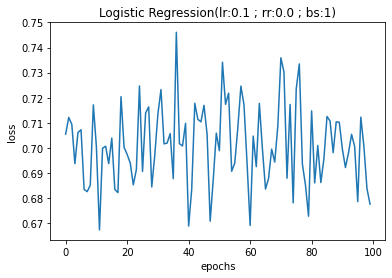

0.5990453460620525
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


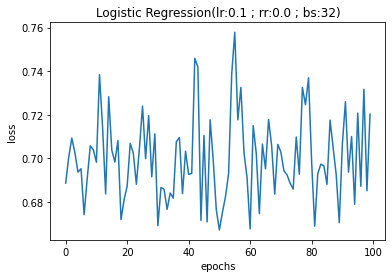

0.6229116945107399
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


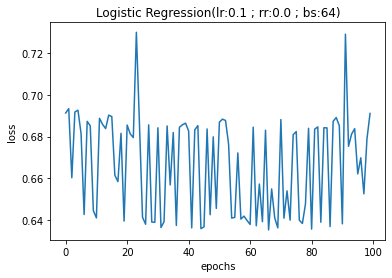

0.6778042959427207
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


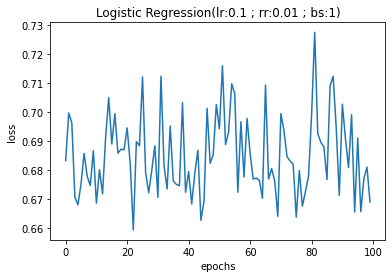

0.6181384248210023
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


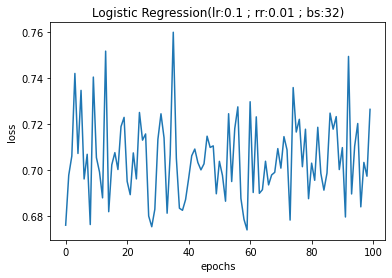

0.630071599045346
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


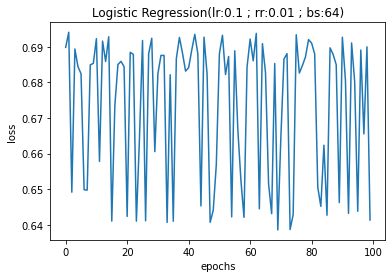

0.6921241050119332
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


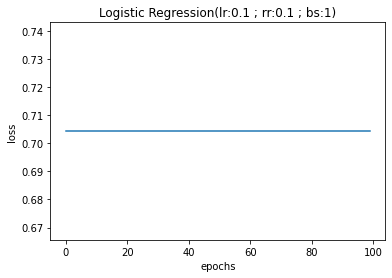

0.5417661097852029
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


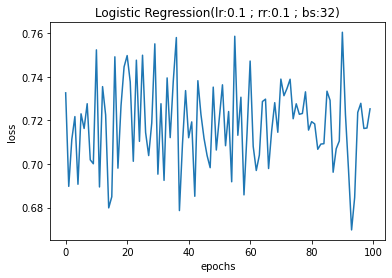

0.6133651551312649
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


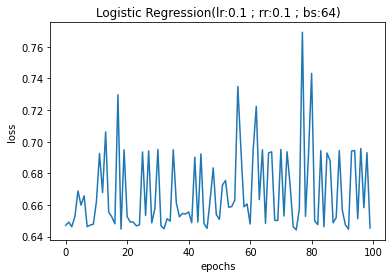

0.6968973747016707
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


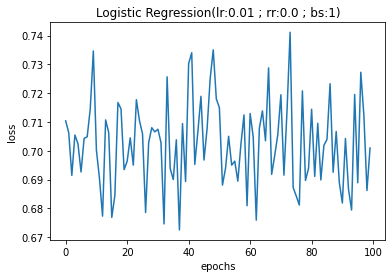

0.5871121718377088
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


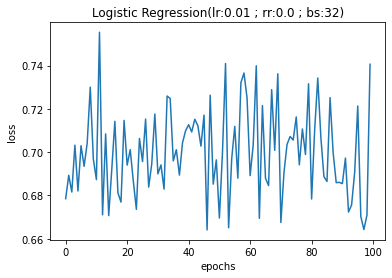

0.6157517899761337
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


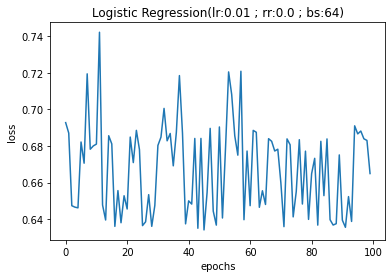

0.5847255369928401
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


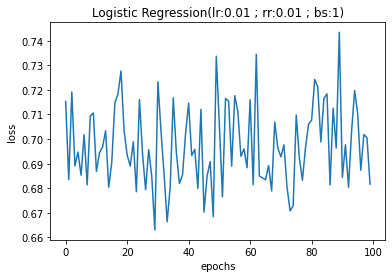

0.5871121718377088
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


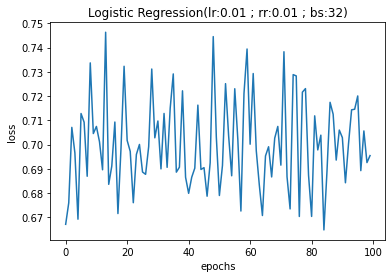

0.684964200477327
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


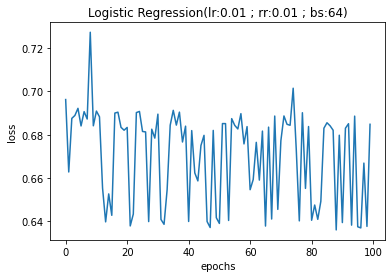

0.5298329355608592
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


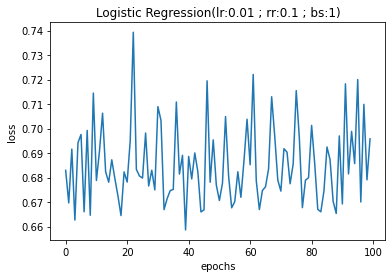

0.6348448687350835
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


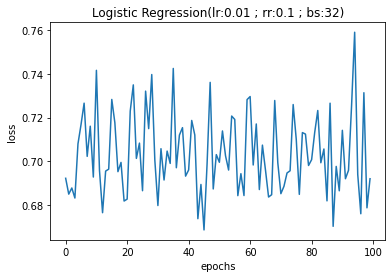

0.6587112171837709
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


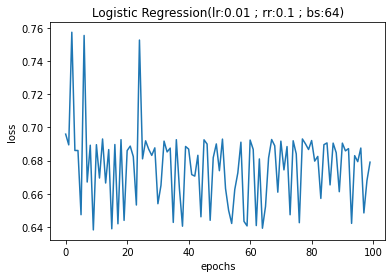

0.5465393794749404
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


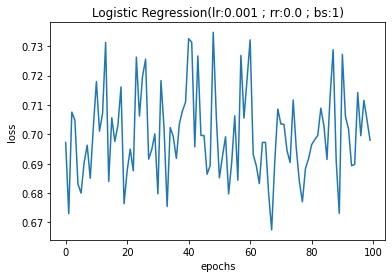

0.6062052505966588
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


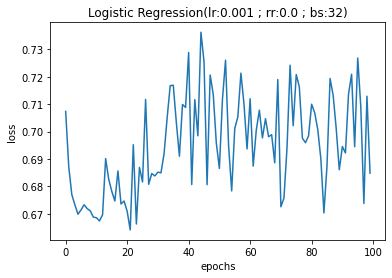

0.6706443914081146
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


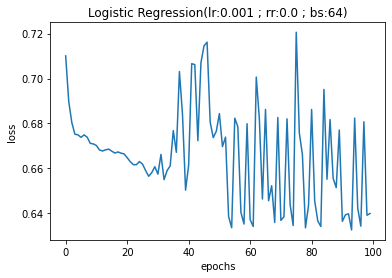

0.6682577565632458
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


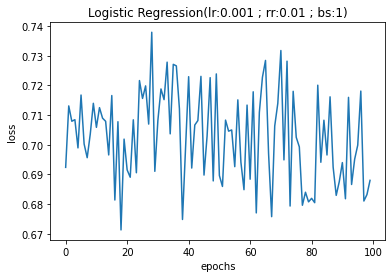

0.6443914081145584
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


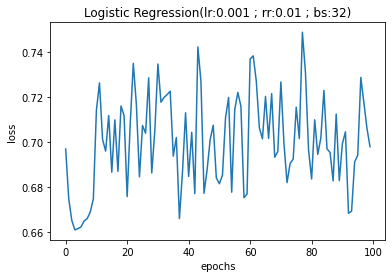

0.6682577565632458
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


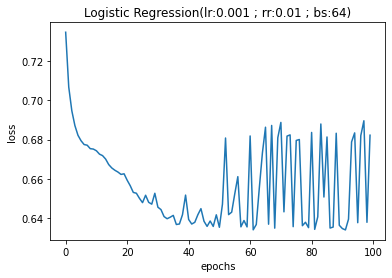

0.5346062052505967
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


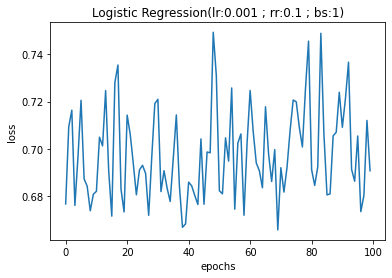

0.60381861575179
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


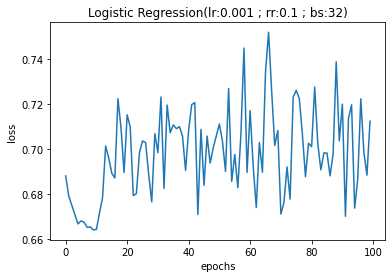

0.6276849642004774
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


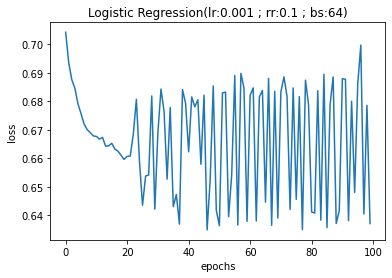

0.6778042959427207
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


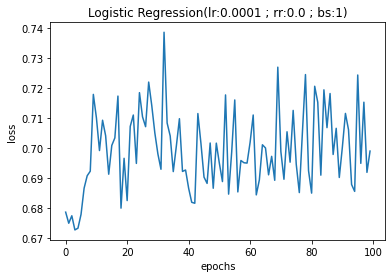

0.594272076372315
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


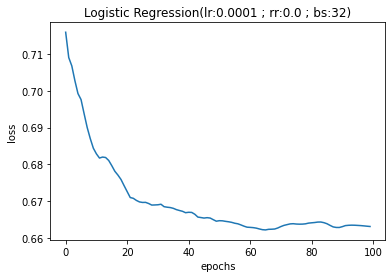

0.684964200477327
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


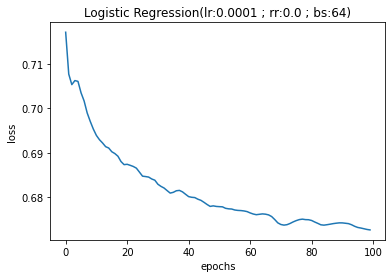

0.6276849642004774
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


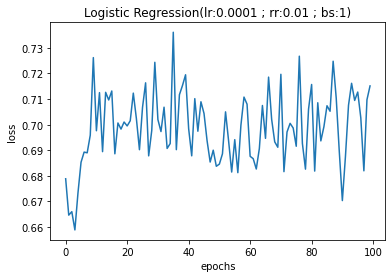

0.5990453460620525
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


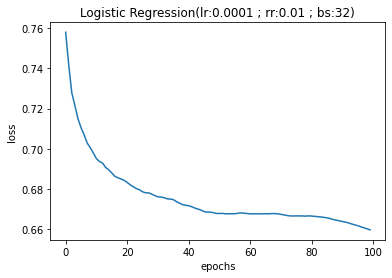

0.6873508353221957
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


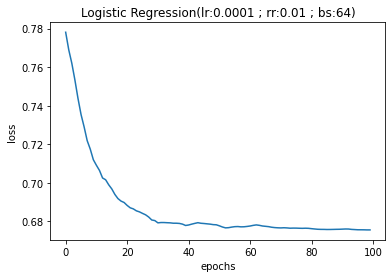

0.6730310262529833
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


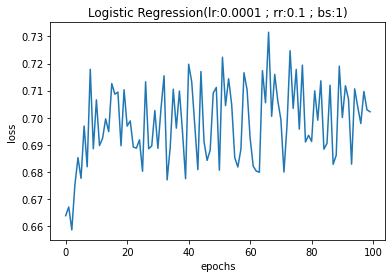

0.5918854415274463
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


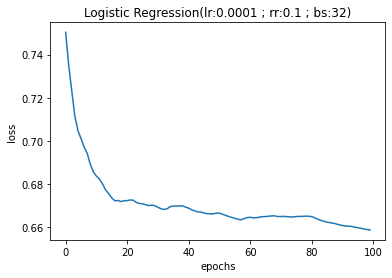

0.649164677804296
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


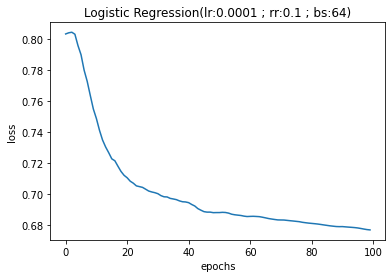

0.6157517899761337
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


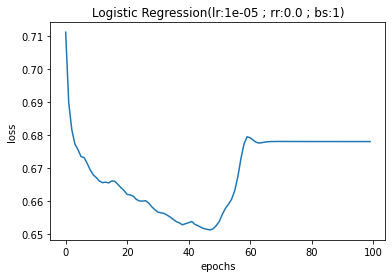

0.6563245823389021
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


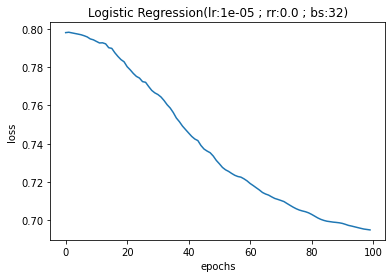

0.6085918854415274
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


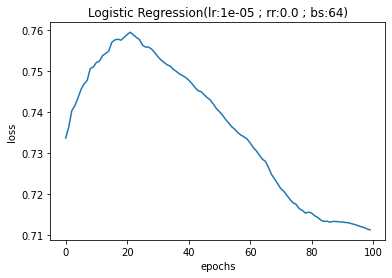

0.5536992840095465
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


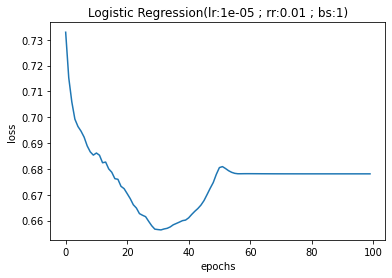

0.6563245823389021
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


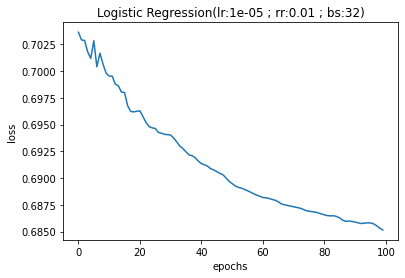

0.6348448687350835
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


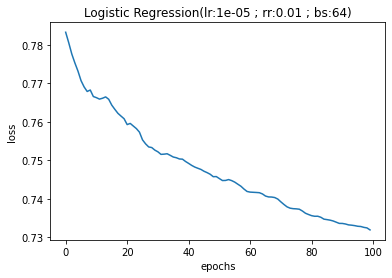

0.5393794749403341
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


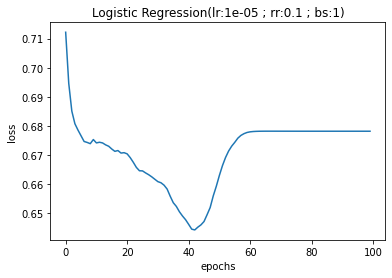

0.6539379474940334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


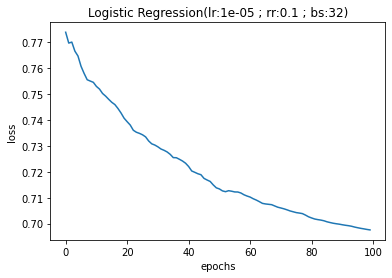

0.6014319809069213
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


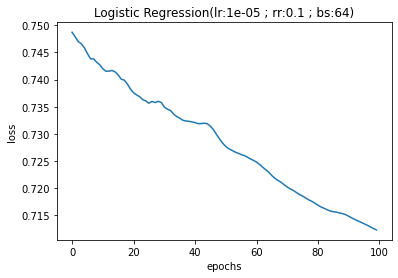

0.5560859188544153
### FINISHED HYPERPARAMETER SEARCH ###


In [ ]:
# best_trucks_and_planes_hyperparameters, best_trucks_and_planes_accuracy = hyperparameter_search(data_train, labels_train, data_validation, labels_validation)

In [ ]:
best_trucks_and_planes_hyperparameters

{'batch_size': 64,
 'epoch': 100,
 'learning_rate': 0.1,
 'regularization_rate': 0.1}

In [ ]:
best_trucks_and_planes_accuracy

0.6968973747016707

##Final Model with the Best Hyperparameter

### Extracting Trucks and Planes Dataset ###
Extracted 500 of 4184 histograms
Extracted 1000 of 4184 histograms
Extracted 1500 of 4184 histograms
Extracted 2000 of 4184 histograms
Extracted 2500 of 4184 histograms
Extracted 3000 of 4184 histograms
Extracted 3500 of 4184 histograms
Extracted 4000 of 4184 histograms
Extracted 4184 of 4184 histograms
Done!
Epoch: 10/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: overflow encountered in exp
  app.launch_new_instance()


Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


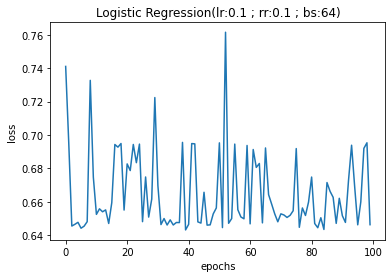

0.6968973747016707


In [ ]:
data_train, labels_train, data_validation, labels_validation = create_trucksplanes_dataset()

num_features = data_train.shape[1]

batch_size = best_trucks_and_planes_hyperparameters["batch_size"]
epoch = best_trucks_and_planes_hyperparameters["epoch"]
learning_rate = best_trucks_and_planes_hyperparameters["learning_rate"]
regularization_rate = best_trucks_and_planes_hyperparameters["regularization_rate"]

accuracy, hyperparameters = train_a_model(data_train, labels_train, data_validation, labels_validation,\
                  learning_rate = learning_rate, regularization_rate = regularization_rate,\
                  batch_size = batch_size, epoch = epoch)
print(accuracy)

#Classifying Poverty

Now it's time to see how our techniques perform for mapping poverty!

As Team Model, your main task is to explore the performance of different hyperparameters and different models.

##Load Data

In [ ]:
#Load Data
with h5py.File(
    os.path.join(ROOT_DIR, "data/assorted_images/satellite_images.h5"),
    "r") as hf:
  X_satel = hf["data"][...] / 255.
  y_satel = hf["labels"][...]

np.random.seed(0)
assign = np.random.permutation(len(X_satel))
satel_cutoff = int(0.8 * len(X_satel))
satel_train_assign = assign[:satel_cutoff]
satel_test_assign = assign[satel_cutoff:]

##Task 1: Load Features



We provide a set of pre-calculated features. This set of features is more sophisticated than histograms. There are four options in the "./data/features" folder:


1.   "./data/features/transfer_features.npy" is calculated by a specific learning algorithm called transfer learning
2.   "./data/features/imagenet_features.npy" is calculated by a convolutional neural network pretrained on the ImageNet dataset
3.   "./data/features/nightlight_features.npy" is the night light features extracted from the satellite images
4.   "./data/features/survey_features.npy" is the features extracted from the survey data

We will use the transer learning feature for the rest of our experiments.



In [ ]:
#Load Pre-calculated Features

# path = "/content/drive/My Drive/Project/data/features/imagenet_features.npy
def extract_uganda_features(path = "/content/drive/My Drive/Project/data/features/transfer_features.npy", test = False):
    H = np.load(os.path.join(ROOT_DIR, path))
    uga_mean = H.mean(axis=0)
    uga_std = H.std(axis=0)
    H -= uga_mean
    H /= (uga_mean + 1e-8)
    H = np.column_stack([H,np.ones(len(H))])
    if not test:
      return H[satel_train_assign]
    else:
      return H[satel_test_assign]

def load_satellite_labels(test = False):
    if not test:
      return y_satel[satel_train_assign][...,None]
    else:
      return y_satel[satel_test_assign][...,None]

In [ ]:
#TODO: figure out how to load/combine different features

def create_uganda_dataset():
    """
    Creates a dataset from Uganda satellite features. You must slice the data
    and labels into a training and validation set.
    """
    print("### Extracting Uganda Dataset ###")

    #YOUR CODE HERE
    data_train, labels_train, data_validation, labels_validation = split_dataset(extract_uganda_features(), load_satellite_labels())
    # features will be of shape (dataset size, num features)
    # labels will be the same size as the dataset.
    #END YOUR CODE

    return data_train, labels_train, data_validation, labels_validation

In [ ]:
data_train, labels_train, data_validation, labels_validation = create_uganda_dataset()
print("Uganda Dataset")
print("shape of training data: {}".format(np.shape(data_train)))
print("shape of validation data: {}".format(np.shape(data_validation)))

### Extracting Uganda Dataset ###
Uganda Dataset
shape of training data: (460, 4097)
shape of validation data: (52, 4097)


In [ ]:
data_train.shape, labels_train.shape, data_validation.shape, labels_validation.shape

((460, 4097), (460, 1), (52, 4097), (52, 1))

##Task 2: Train A Model

Using the transfer learning features, train models with various hyperparameters. Compare the results.

DONT RUN NOT EDITED

### STARTING HYPERPARAMETER SEARCH ###
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


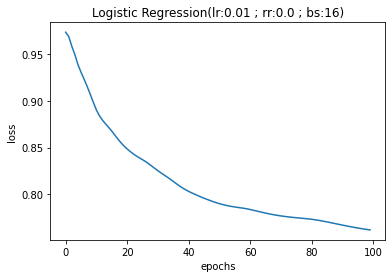

0.7307692307692307
0.0
0.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


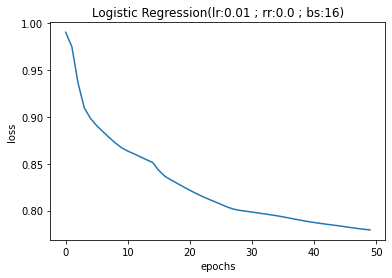

0.6538461538461539
0.0
0.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


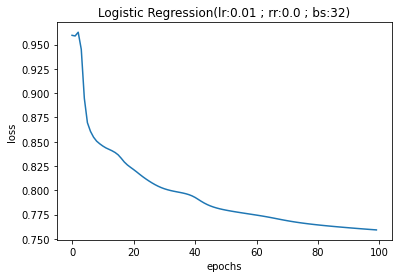

0.7307692307692307
0.0
0.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


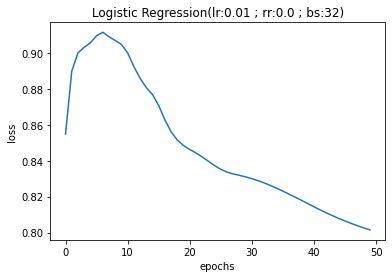

0.7307692307692307
0.0
0.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


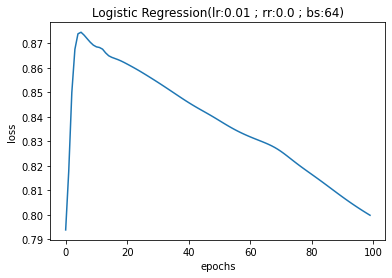

0.7115384615384616
0.0
0.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


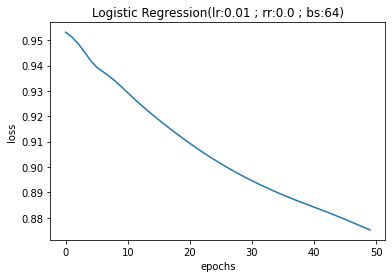

0.34615384615384615
0.2608695652173913
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


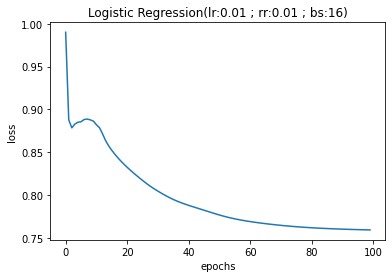

0.75
0.0
0.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


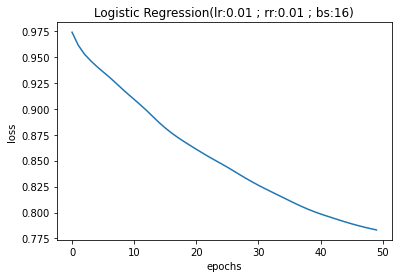

0.7115384615384616
0.0
0.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


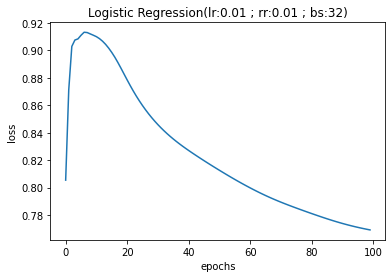

0.6923076923076923
0.0
0.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


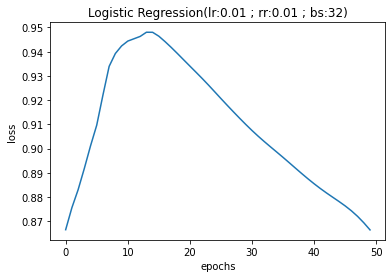

0.4230769230769231
0.2857142857142857
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


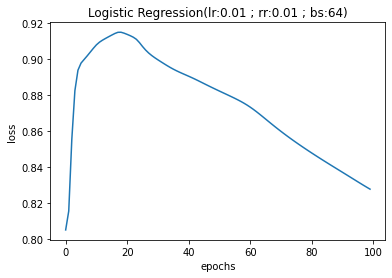

0.4423076923076923
0.16
0.3333333333333333
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


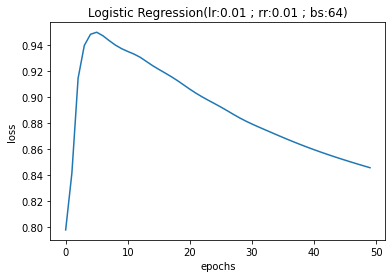

0.5
0.3157894736842105
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


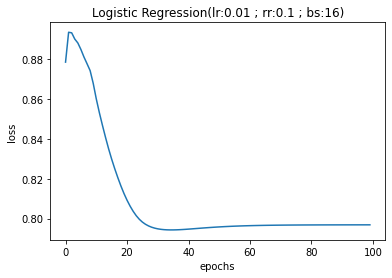

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in long_scalars


0.7692307692307693
nan
0.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


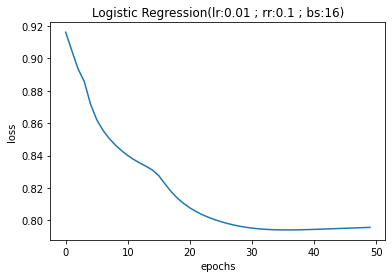

0.7692307692307693
nan
0.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


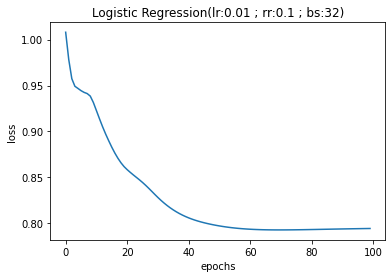

0.7692307692307693
nan
0.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


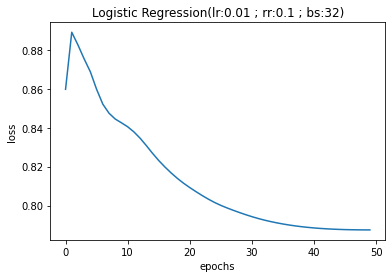

0.7307692307692307
0.0
0.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


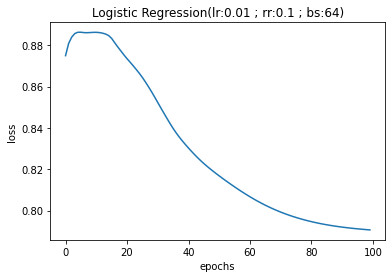

0.6538461538461539
0.0
0.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


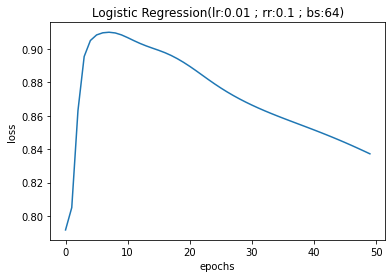

0.5
0.3157894736842105
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


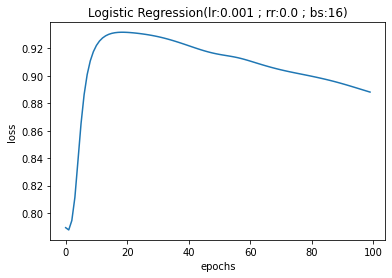

0.4807692307692308
0.3076923076923077
1.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


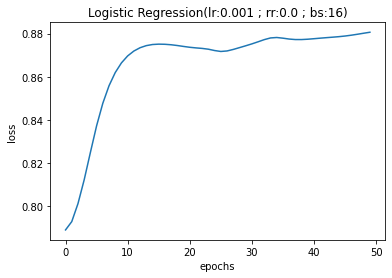

0.46153846153846156
0.3
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


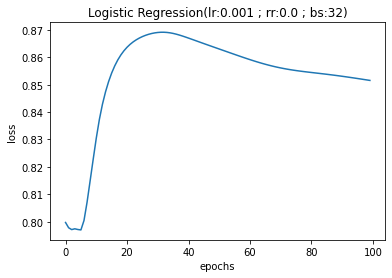

0.38461538461538464
0.2727272727272727
1.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


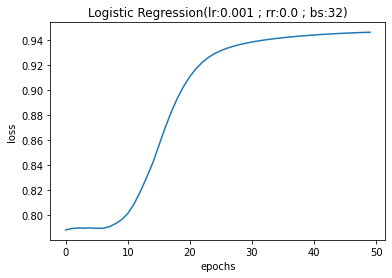

0.38461538461538464
0.2727272727272727
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


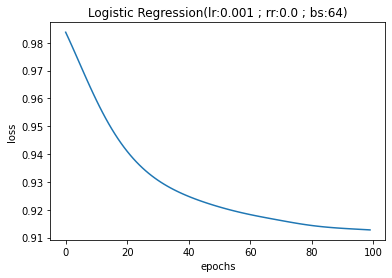

0.3269230769230769
0.2553191489361702
1.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


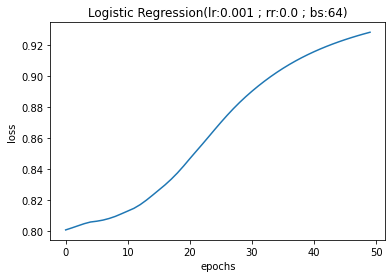

0.34615384615384615
0.2608695652173913
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


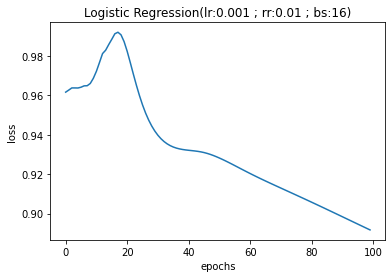

0.3076923076923077
0.25
1.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


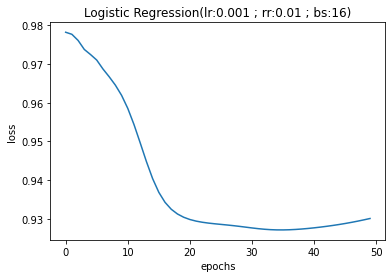

0.4230769230769231
0.2857142857142857
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


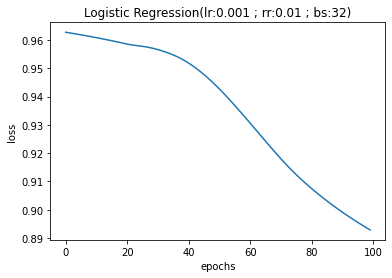

0.36538461538461536
0.26666666666666666
1.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


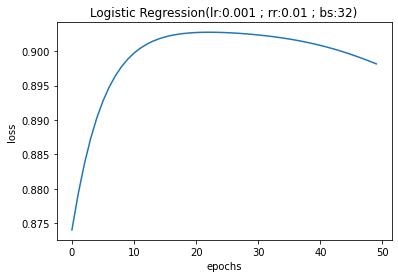

0.34615384615384615
0.2608695652173913
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


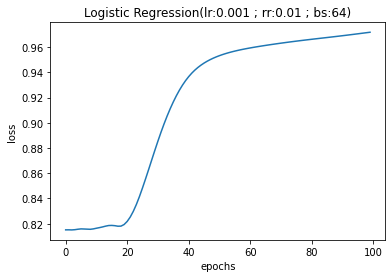

0.40384615384615385
0.27906976744186046
1.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


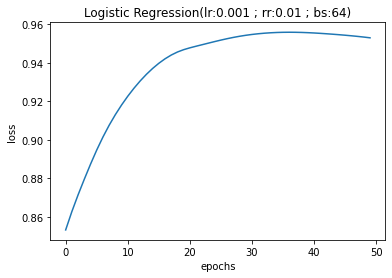

0.4423076923076923
0.2926829268292683
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


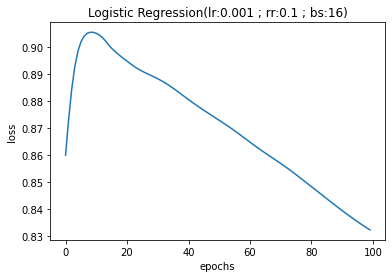

0.4230769230769231
0.2857142857142857
1.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


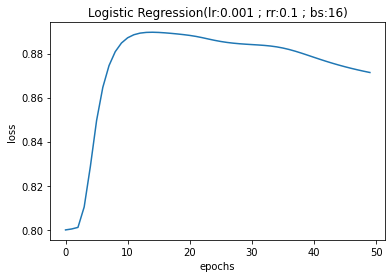

0.40384615384615385
0.27906976744186046
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


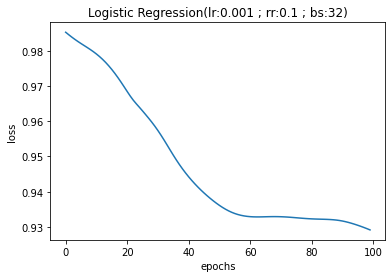

0.38461538461538464
0.2727272727272727
1.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


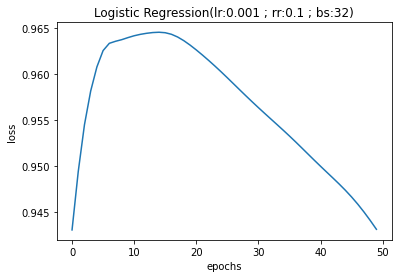

0.40384615384615385
0.27906976744186046
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


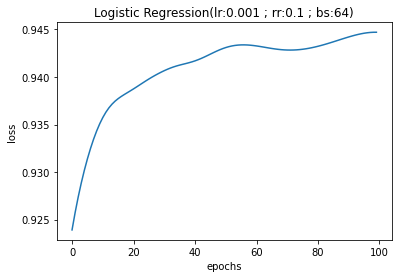

0.38461538461538464
0.2727272727272727
1.0
Epoch: 10/50
Epoch: 15/50
Epoch: 21/50
Epoch: 26/50
Epoch: 32/50
Epoch: 37/50
Epoch: 43/50
Epoch: 48/50


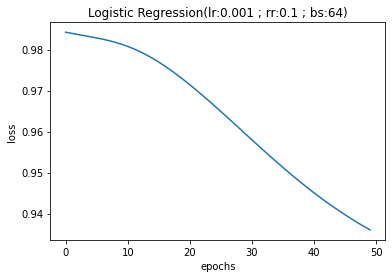

0.4230769230769231
0.2857142857142857
1.0
### FINISHED HYPERPARAMETER SEARCH ###


ValueError: ignored

In [ ]:
best_poverty_hyperparameters, best_poverty_accuracy = hyperparameter_search(data_train, labels_train, data_validation, labels_validation)

In [ ]:
print(best_poverty_hyperparameters)

In [ ]:
print(best_poverty_accuracy)

##Task 3: Evaluate the Model with Different Metrics

1. In our toy example, we noticed that different random seed can affect the performance of our model. How can we address this problem.

  *Hint: Check out cross-validation.*

2. So far we have only evaluated our models in the validation set, now we should deploy it to the test set. Train your best model with the entire training set (i.e. union of the train split and the validation split in the training set) and test it on the test set.

3. We have provided various other metrics to evaluate the models in the **Training Essentials** section. Explore different metrics and discuss the meaning of each score.

  *Hint: Feel free to go back and change your code for Logistic Regression Model*

In [ ]:
data_train.shape, labels_train.shape, data_validation.shape, labels_validation.shape

((460, 4097), (460, 1), (52, 4097), (52, 1))

In [ ]:
labels_all = np.concatenate((labels_train, labels_validation))

ones = np.sum(labels_validation == 1)
zeroes = np.sum(labels_validation == 0)

print (ones, zeroes)

12 40


In [ ]:
def cross_validation_implementation_for_poverty_dataset_with_features_extracted_from_convolutional_neural_network_learned_from_image_net_provided_by_artificial_intelligence_for_all(data_train, labels_train, data_validation, labels_validation):


    data_all = np.concatenate((data_train, data_validation)) # THIS DAS NOT INCLUDE TEST DATA, BEWARE
    labels_all = np.concatenate((labels_train, labels_validation)) # THIS DAS NOT INCLUDE TEST DATA, BEWARE

    avg_accuracy_2  = 0
    best_accuracy_2  = 0
    best_precision_2 = 0.0
    best_recall_2 = 0.0
    best_hyperparameters_2 = {
            "learning_rate": 0.0,
            "regularization_rate": 0.0,
            "batch_size": 1,
            "epoch":0
            } 

    for i in range(10):
        fold_size = int(len(data_all)/10)

        new_data_validation = data_all[fold_size*i:fold_size*(i+1)]
        new_data_train = np.copy(data_all) # so we create a copy and not a reference of data_train so we can remove without messing it up
        new_data_train = np.delete(new_data_train, np.s_[fold_size*i:fold_size*(i+1)], 0)

        new_labels_validation = labels_all[fold_size*i:fold_size*(i+1)]
        new_labels_train = np.copy(labels_all) # so we create a copy and not a reference of data_train so we can remove without messing it up
        new_labels_train = np.delete(new_labels_train, np.s_[fold_size*i:fold_size*(i+1)], 0)

        
        hyperparameters, accuracy, precision, recall = hyperparameter_search(new_data_train, new_labels_train, new_data_validation, new_labels_validation)
        avg_accuracy_2 += accuracy

        if (accuracy > best_accuracy_2 and precision > best_precision_2 and recall > best_recall_2):
            best_accuracy_2 = accuracy
            best_precision_2 = precision
            best_recall_2 = recall
            best_hyperparameters_2 = hyperparameters

    avg_accuracy_2 /= 10 # divide by 10 bc getting average of all best_poverty_accuracies
    print(avg_accuracy_2)
    print(best_hyperparameters_2)

    return best_hyperparameters_2, avg_accuracy_2

#        if (best_poverty_accuracy > best_accuracy_2): # we must consider how good our model is by averaging, not just taking max
#             best_accuracy_2 = best_poverty_accuracy

### STARTING HYPERPARAMETER SEARCH ###
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


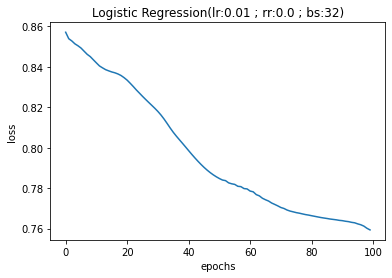

0.5686274509803921
0.3333333333333333
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


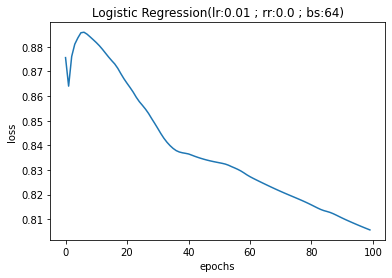

0.5686274509803921
0.30434782608695654
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


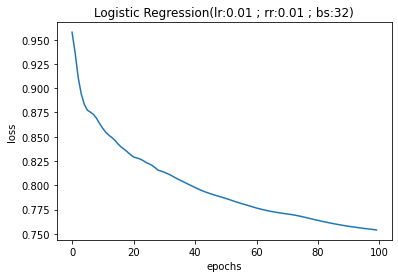

0.5294117647058824
0.2962962962962963
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


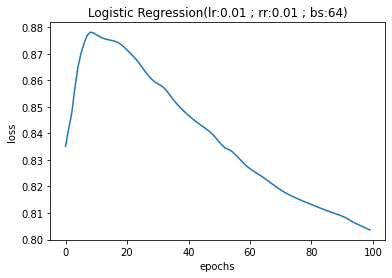

0.5686274509803921
0.2857142857142857
0.46153846153846156
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


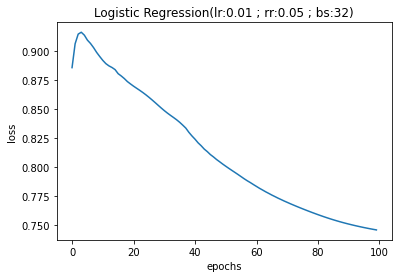

0.6078431372549019
0.34782608695652173
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


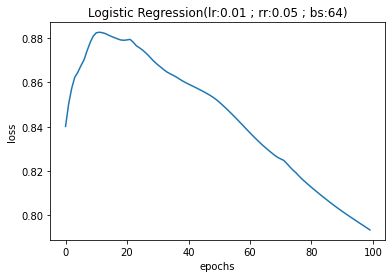

0.5686274509803921
0.32
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


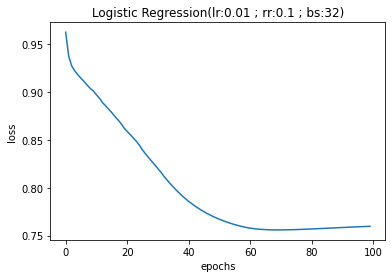

0.6274509803921569
0.36363636363636365
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


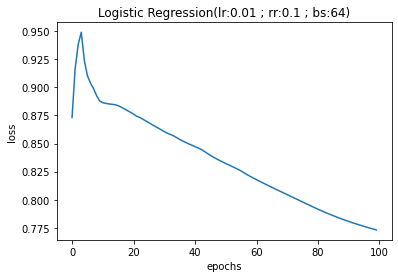

0.5882352941176471
0.3
0.46153846153846156
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


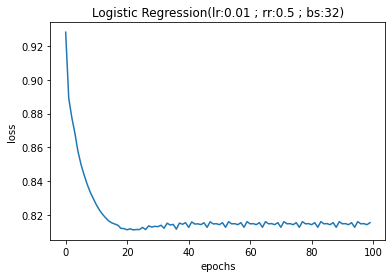

0.5294117647058824
0.3225806451612903
0.7692307692307693
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


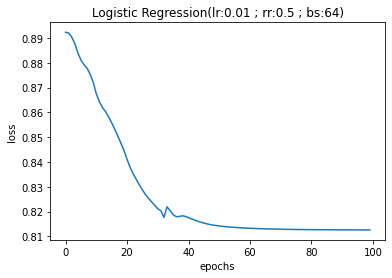

0.5686274509803921
0.3548387096774194
0.8461538461538461
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


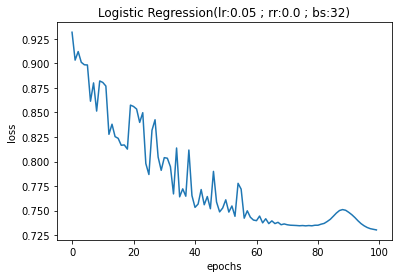

0.5490196078431373
0.2916666666666667
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


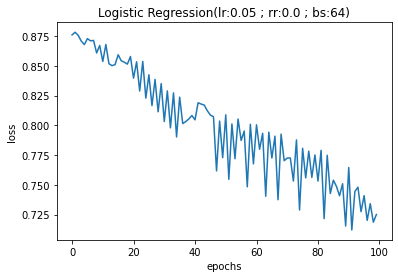

0.6078431372549019
0.34782608695652173
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


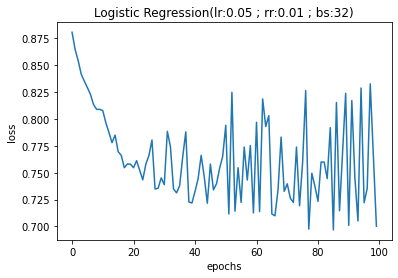

0.6274509803921569
0.3333333333333333
0.46153846153846156
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


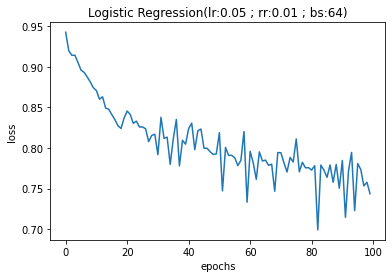

0.5294117647058824
0.28
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


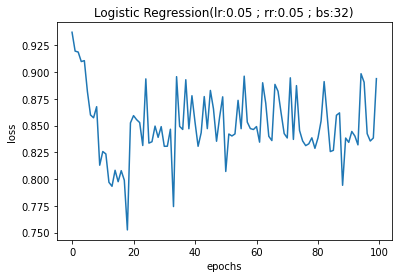

0.49019607843137253
0.3142857142857143
0.8461538461538461
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


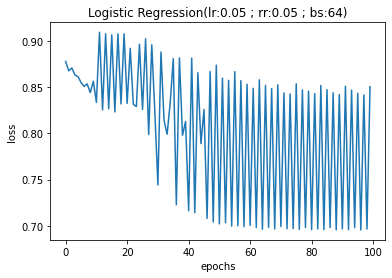

0.49019607843137253
0.32432432432432434
0.9230769230769231
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


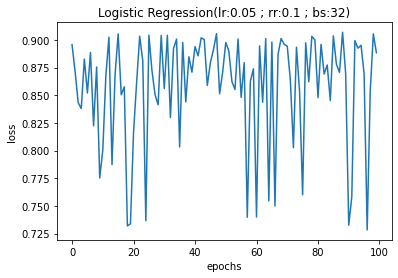

0.49019607843137253
0.3142857142857143
0.8461538461538461
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


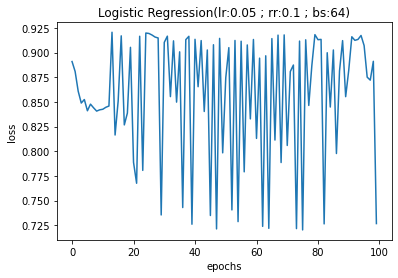

0.7254901960784313
0.4666666666666667
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


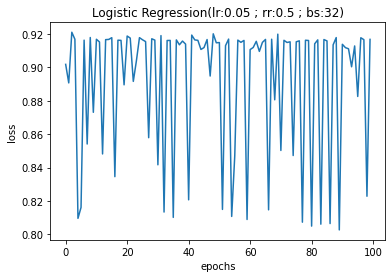

0.45098039215686275
0.3076923076923077
0.9230769230769231
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


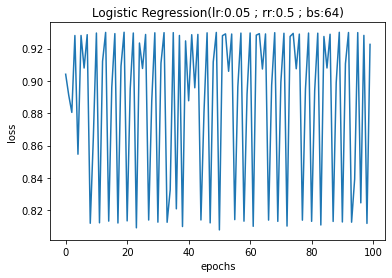

0.47058823529411764
0.3157894736842105
0.9230769230769231
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


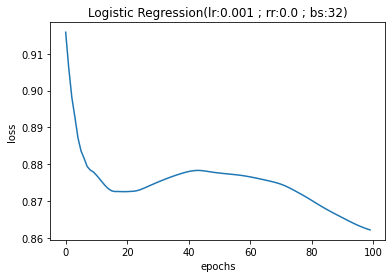

0.6470588235294118
0.38095238095238093
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


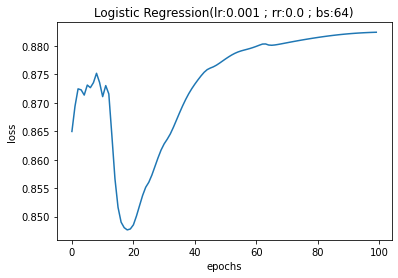

0.5686274509803921
0.30434782608695654
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


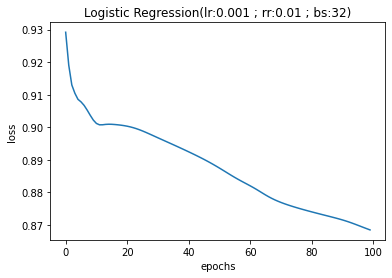

0.5098039215686274
0.25
0.46153846153846156
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


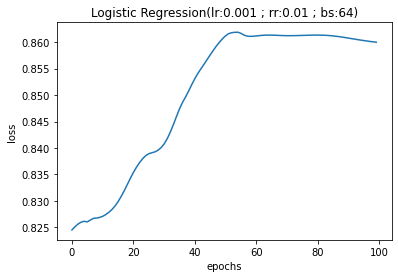

0.5294117647058824
0.28
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


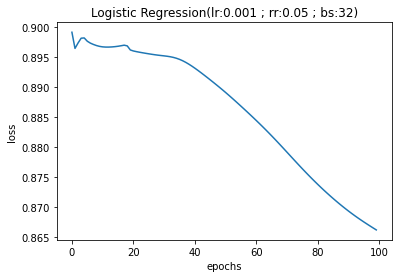

0.5294117647058824
0.2608695652173913
0.46153846153846156
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


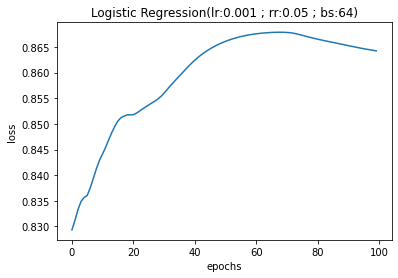

0.5294117647058824
0.3103448275862069
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


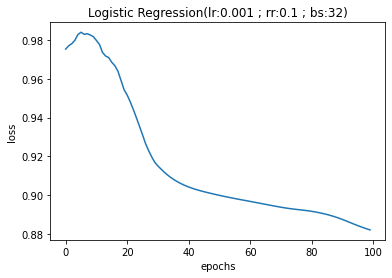

0.45098039215686275
0.2222222222222222
0.46153846153846156
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


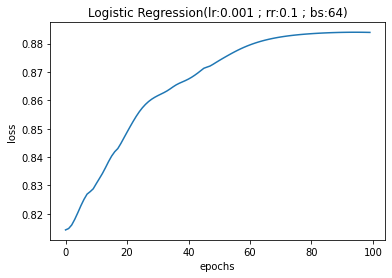

0.6274509803921569
0.3125
0.38461538461538464
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


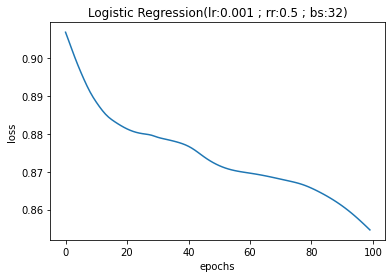

0.5490196078431373
0.2916666666666667
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


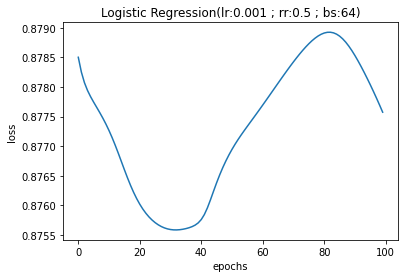

0.5294117647058824
0.2962962962962963
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


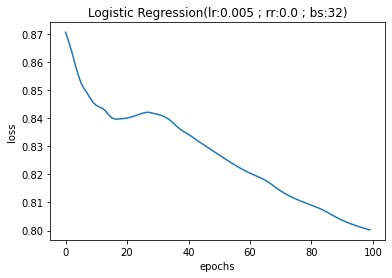

0.5294117647058824
0.28
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


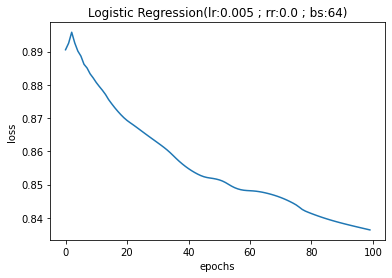

0.5686274509803921
0.30434782608695654
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


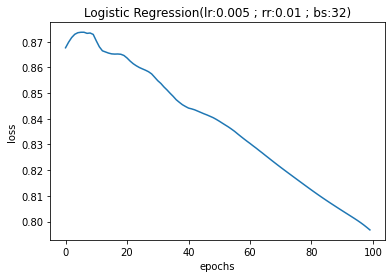

0.6470588235294118
0.3684210526315789
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


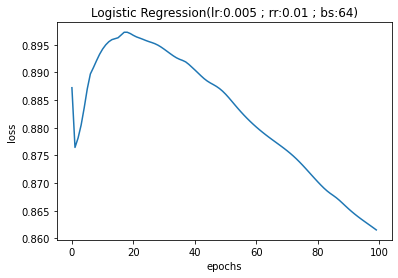

0.5686274509803921
0.3333333333333333
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


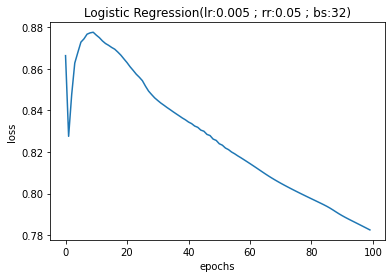

0.6274509803921569
0.36363636363636365
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


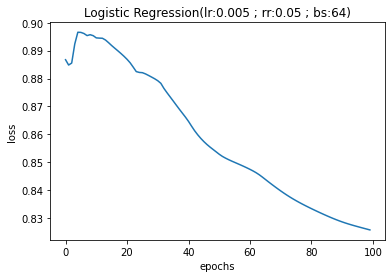

0.6470588235294118
0.391304347826087
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


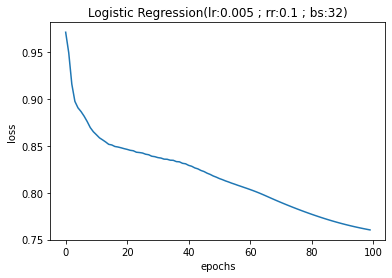

0.6078431372549019
0.29411764705882354
0.38461538461538464
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


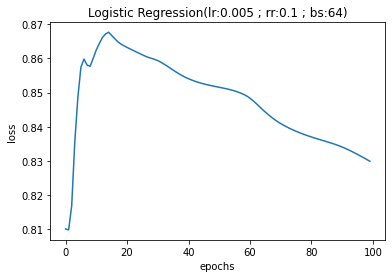

0.5882352941176471
0.3181818181818182
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


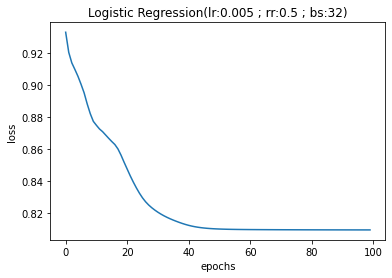

0.5686274509803921
0.3448275862068966
0.7692307692307693
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


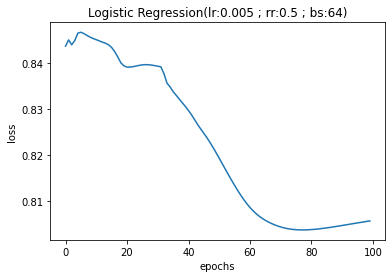

0.5098039215686274
0.2857142857142857
0.6153846153846154
### FINISHED HYPERPARAMETER SEARCH ###
### STARTING HYPERPARAMETER SEARCH ###
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


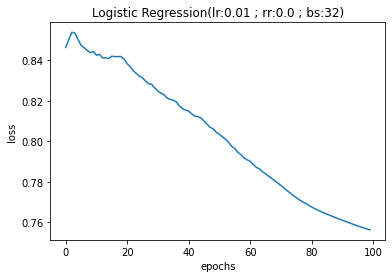

0.5882352941176471
0.2727272727272727
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


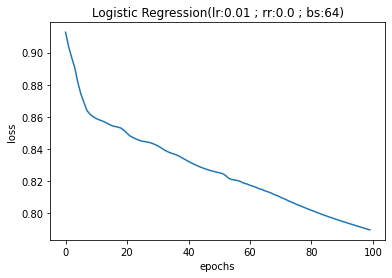

0.5686274509803921
0.2608695652173913
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


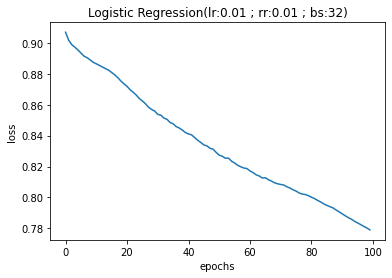

0.6470588235294118
0.36
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


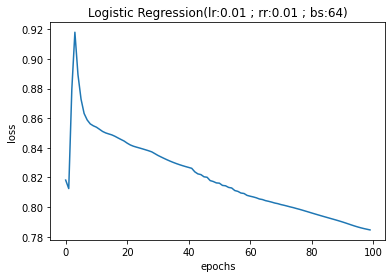

0.6274509803921569
0.34615384615384615
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


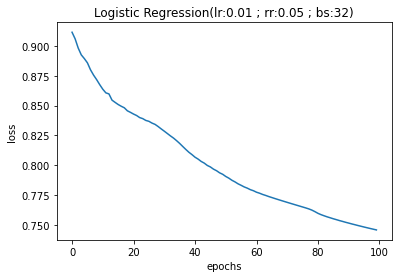

0.6078431372549019
0.32
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


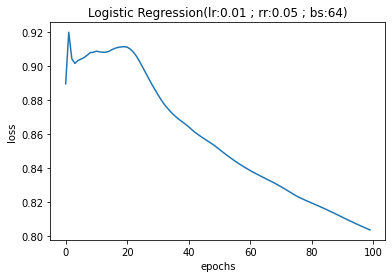

0.5098039215686274
0.25
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


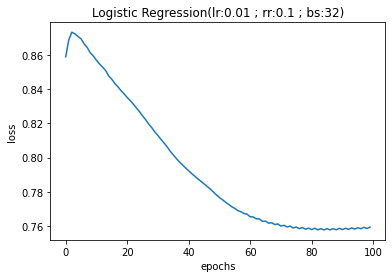

0.5686274509803921
0.2962962962962963
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


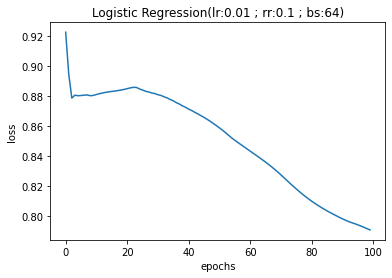

0.6862745098039216
0.35294117647058826
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


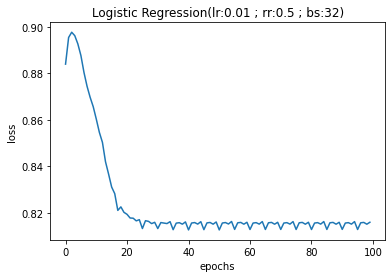

0.5686274509803921
0.3103448275862069
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


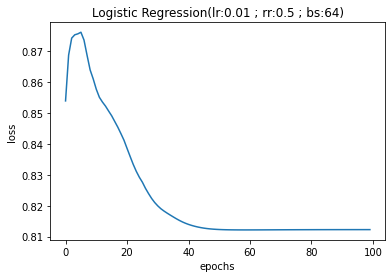

0.5490196078431373
0.3125
0.9090909090909091
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


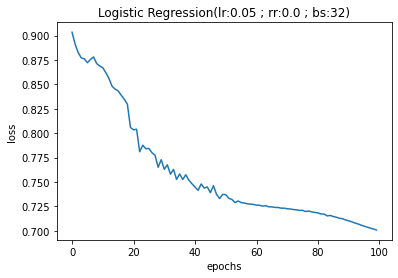

0.6274509803921569
0.3
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


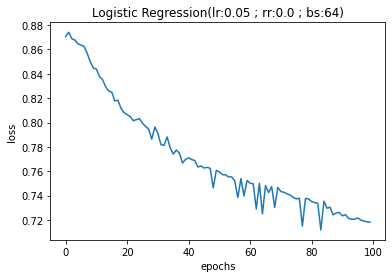

0.6078431372549019
0.30434782608695654
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


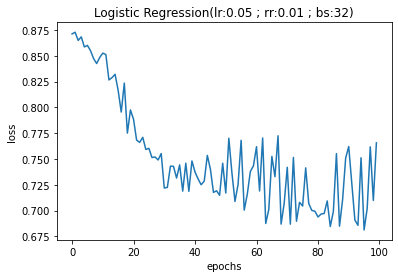

0.49019607843137253
0.2727272727272727
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


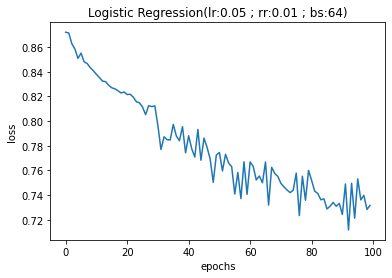

0.6078431372549019
0.30434782608695654
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


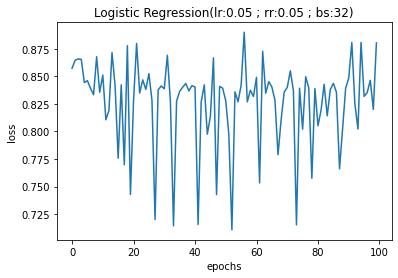

0.5490196078431373
0.3235294117647059
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


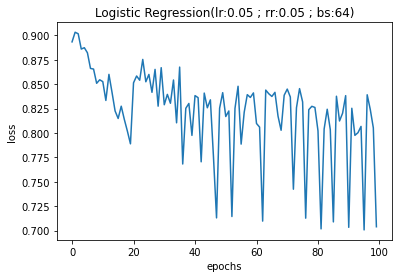

0.6862745098039216
0.3684210526315789
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


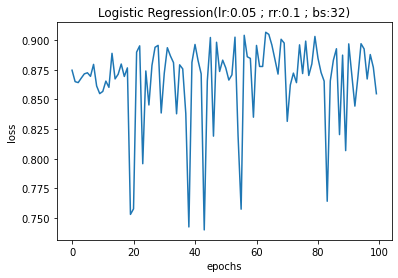

0.5294117647058824
0.30303030303030304
0.9090909090909091
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


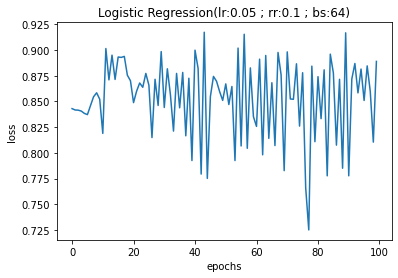

0.5098039215686274
0.3055555555555556
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


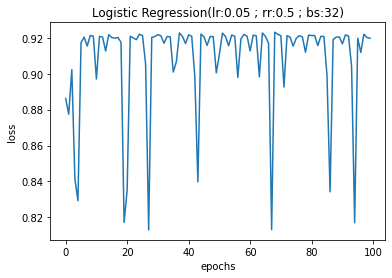

0.5490196078431373
0.3
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


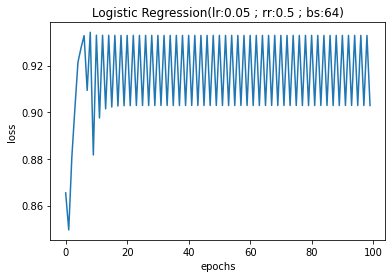

0.5490196078431373
0.3235294117647059
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


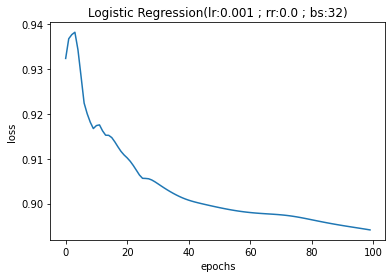

0.49019607843137253
0.2413793103448276
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


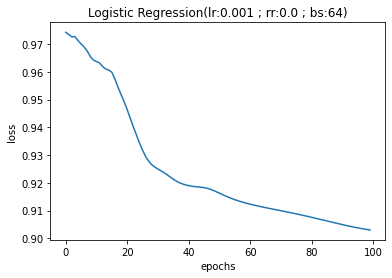

0.6274509803921569
0.3181818181818182
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


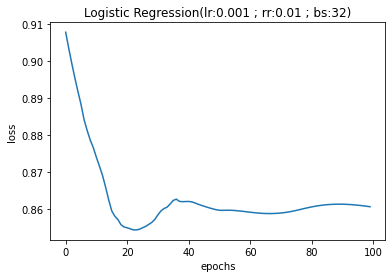

0.5098039215686274
0.20833333333333334
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


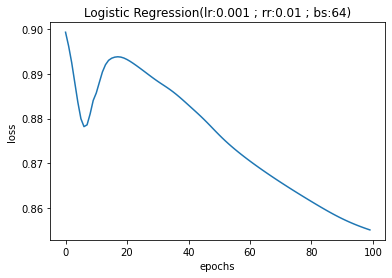

0.5294117647058824
0.25925925925925924
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


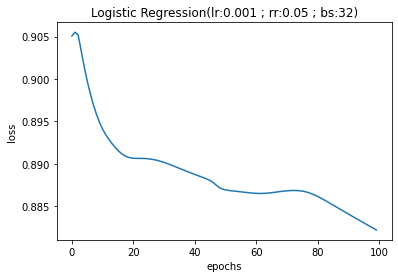

0.49019607843137253
0.2
0.45454545454545453
Epoch: 10/100


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: overflow encountered in exp
  app.launch_new_instance()


Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


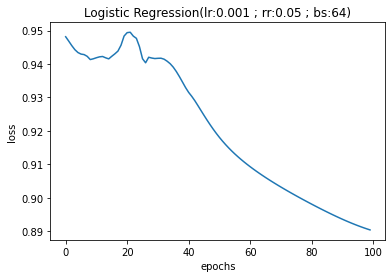

0.6078431372549019
0.23529411764705882
0.36363636363636365
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


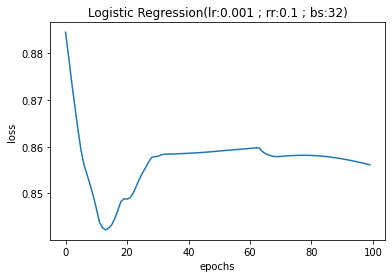

0.5686274509803921
0.23809523809523808
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


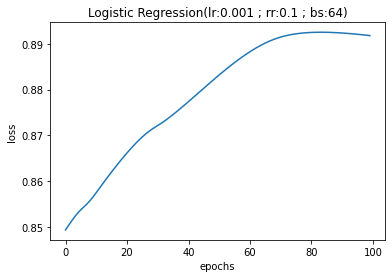

0.5490196078431373
0.25
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


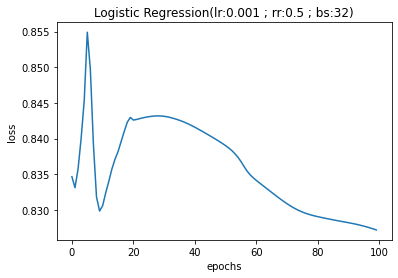

0.6078431372549019
0.30434782608695654
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


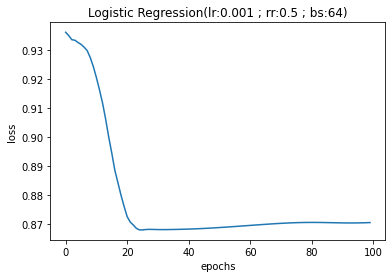

0.49019607843137253
0.2
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


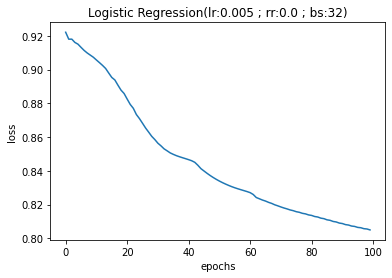

0.5490196078431373
0.22727272727272727
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


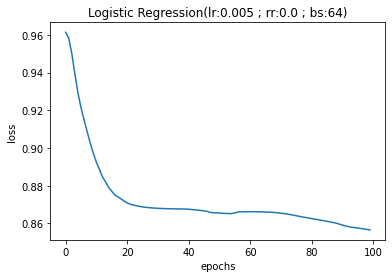

0.6078431372549019
0.30434782608695654
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


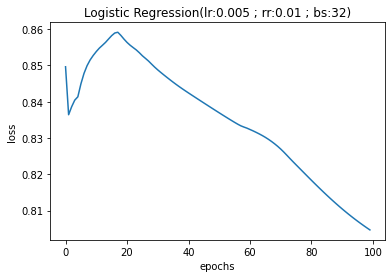

0.6862745098039216
0.391304347826087
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


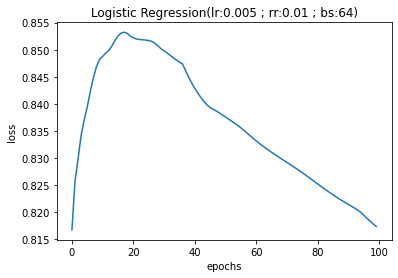

0.6470588235294118
0.36
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


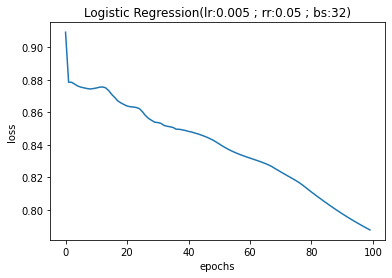

0.6470588235294118
0.34782608695652173
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


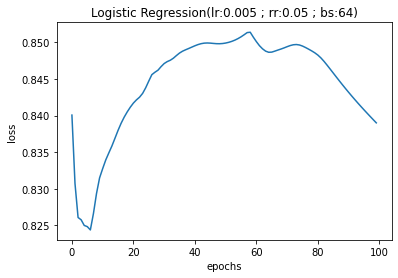

0.49019607843137253
0.25806451612903225
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


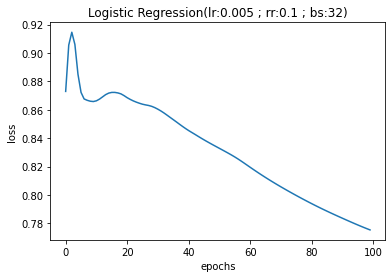

0.5686274509803921
0.2962962962962963
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


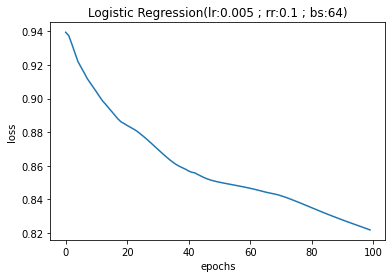

0.5686274509803921
0.28
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


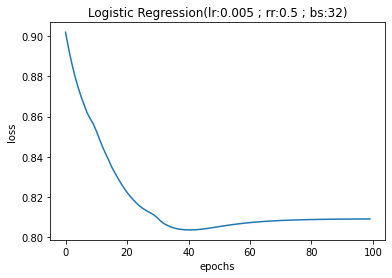

0.6078431372549019
0.3333333333333333
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


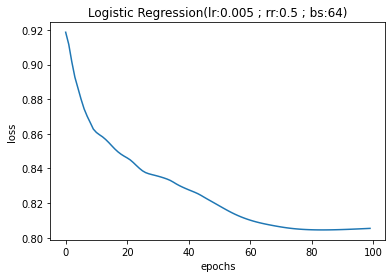

0.6078431372549019
0.3333333333333333
0.8181818181818182
### FINISHED HYPERPARAMETER SEARCH ###
### STARTING HYPERPARAMETER SEARCH ###
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


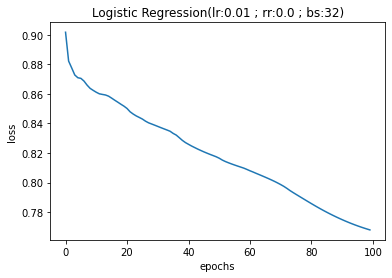

0.7254901960784313
0.35714285714285715
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


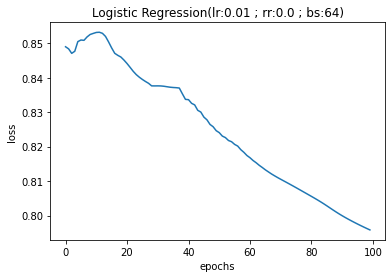

0.5686274509803921
0.25
0.6
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


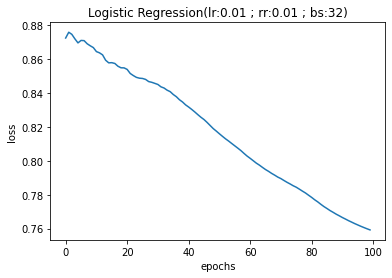

0.6470588235294118
0.3181818181818182
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


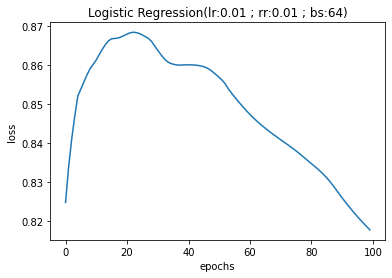

0.5490196078431373
0.21739130434782608
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


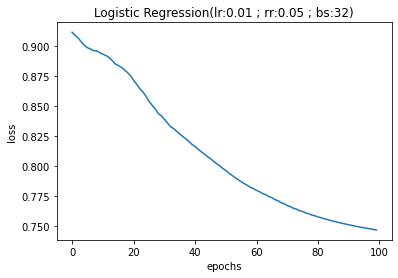

0.6470588235294118
0.3
0.6
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


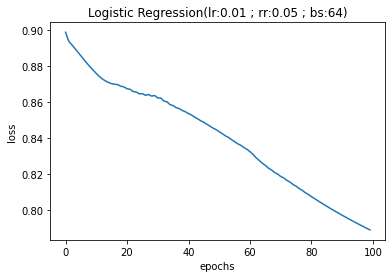

0.6274509803921569
0.30434782608695654
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


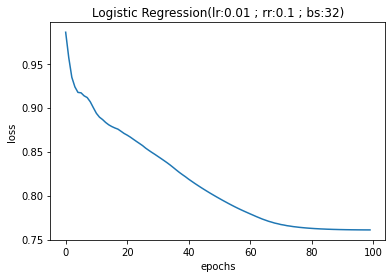

0.6666666666666666
0.3333333333333333
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


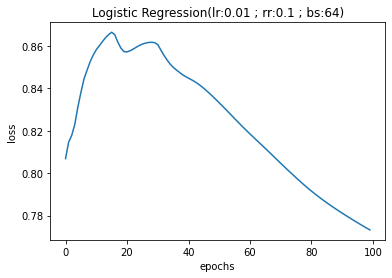

0.6274509803921569
0.2631578947368421
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


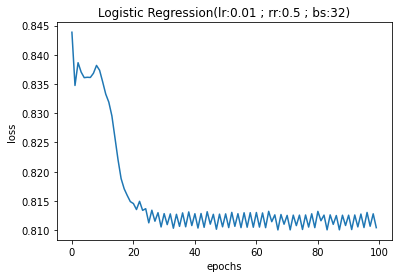

0.6078431372549019
0.3076923076923077
0.8
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


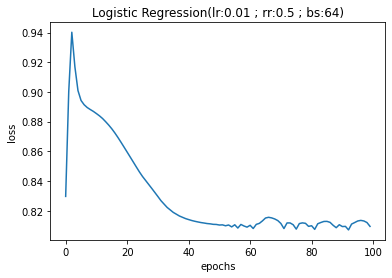

0.6078431372549019
0.32142857142857145
0.9
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


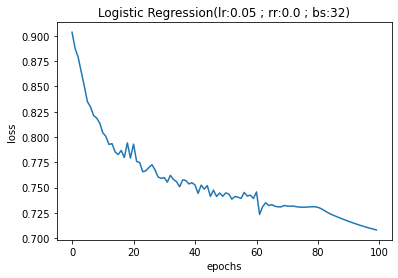

0.6274509803921569
0.32
0.8
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


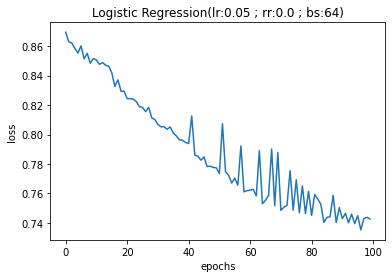

0.5686274509803921
0.125
0.2
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


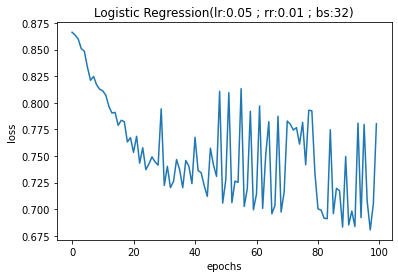

0.5882352941176471
0.28
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


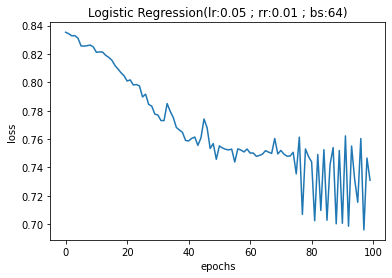

0.6862745098039216
0.36363636363636365
0.8
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


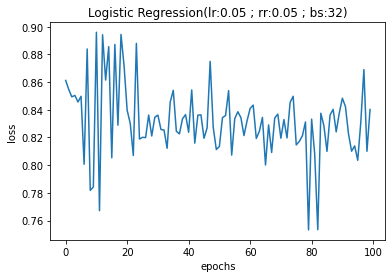

0.5294117647058824
0.28125
0.9
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


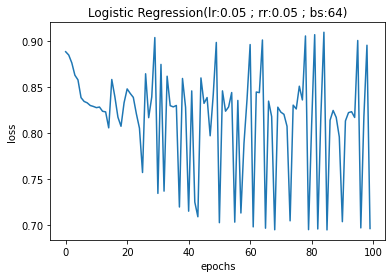

0.803921568627451
0.5
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


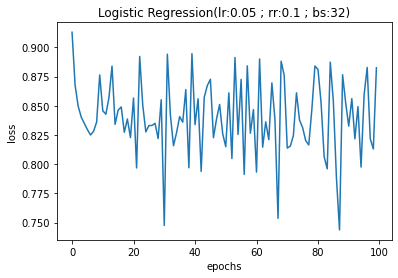

0.5686274509803921
0.3
0.9
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


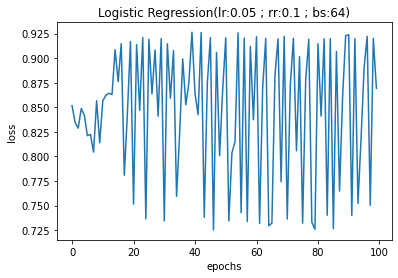

0.5294117647058824
0.29411764705882354
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


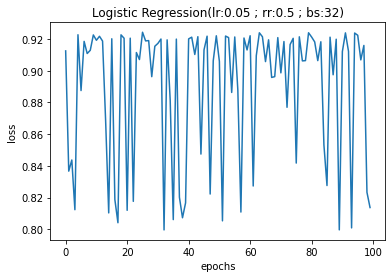

0.5686274509803921
0.125
0.2
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


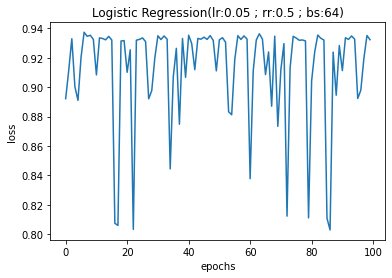

0.5686274509803921
0.3
0.9
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


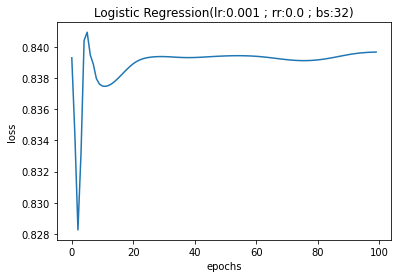

0.5490196078431373
0.25925925925925924
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


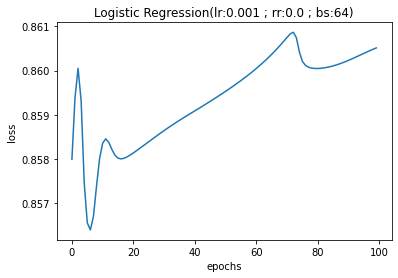

0.5490196078431373
0.25925925925925924
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


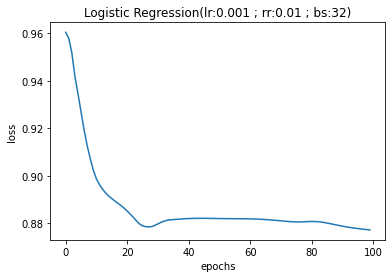

0.5490196078431373
0.27586206896551724
0.8
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


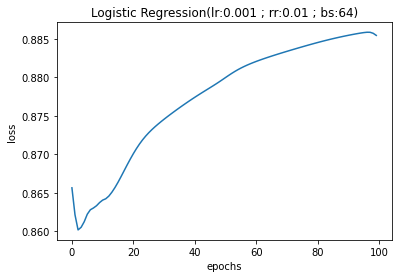

0.6078431372549019
0.2916666666666667
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


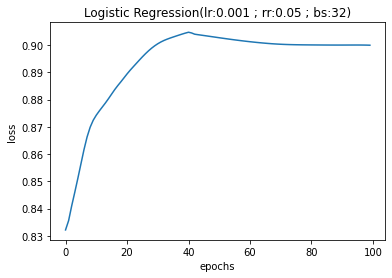

0.5882352941176471
0.28
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


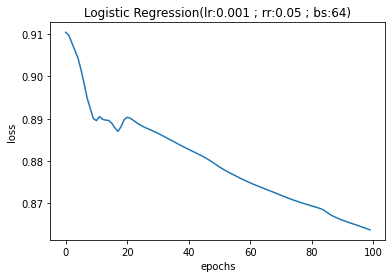

0.47058823529411764
0.22580645161290322
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


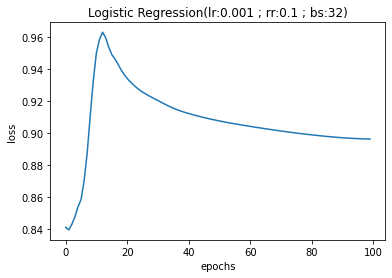

0.47058823529411764
0.20689655172413793
0.6
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


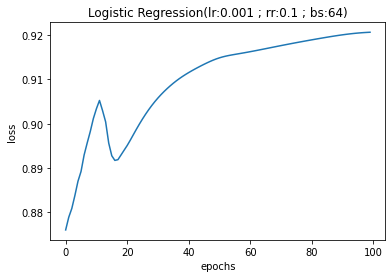

0.47058823529411764
0.18518518518518517
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


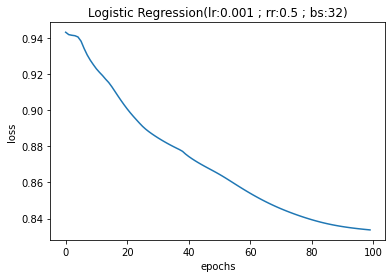

0.5882352941176471
0.23809523809523808
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


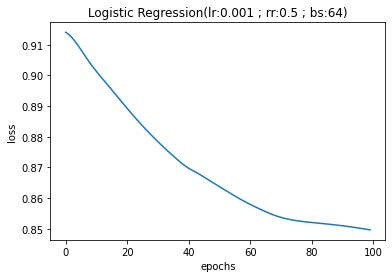

0.5882352941176471
0.28
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


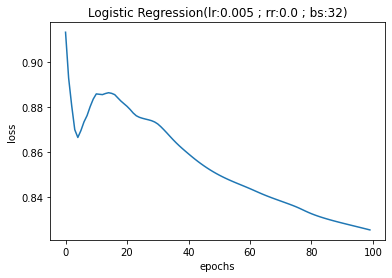

0.5098039215686274
0.14285714285714285
0.3
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


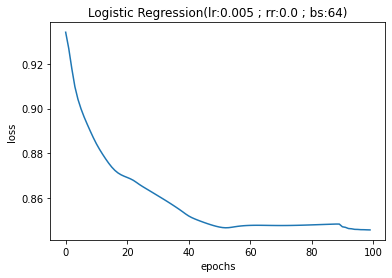

0.5490196078431373
0.21739130434782608
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


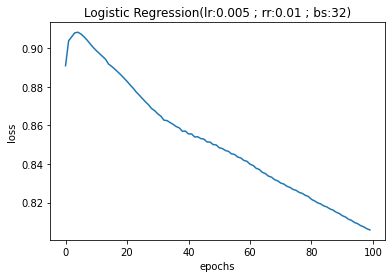

0.5882352941176471
0.23809523809523808
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


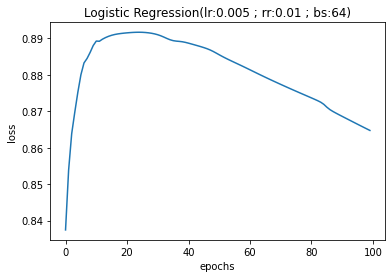

0.5098039215686274
0.25806451612903225
0.8
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


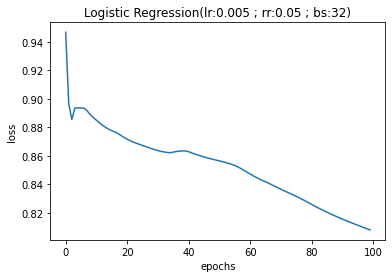

0.6274509803921569
0.30434782608695654
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


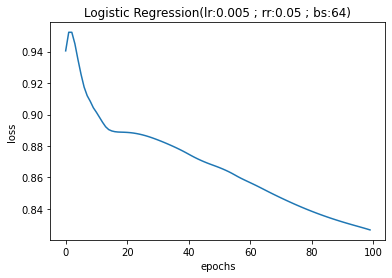

0.5686274509803921
0.22727272727272727
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


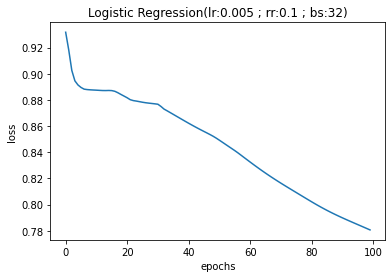

0.5686274509803921
0.25
0.6
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


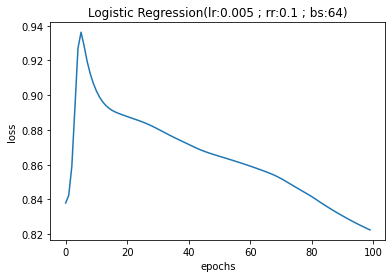

0.5490196078431373
0.24
0.6
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


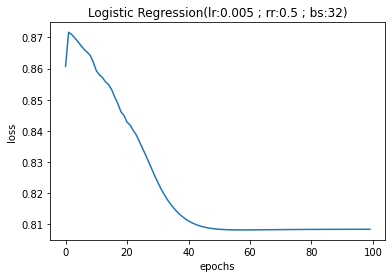

0.6078431372549019
0.32142857142857145
0.9
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


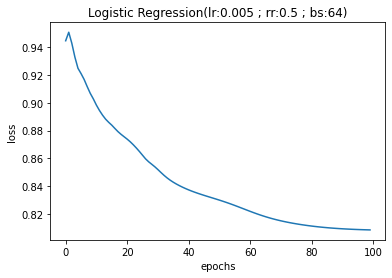

0.6470588235294118
0.3333333333333333
0.8
### FINISHED HYPERPARAMETER SEARCH ###
### STARTING HYPERPARAMETER SEARCH ###
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


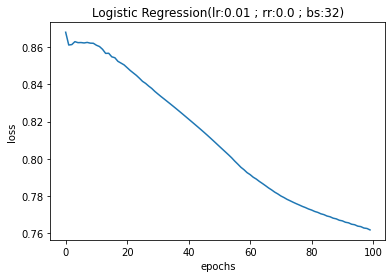

0.49019607843137253
0.041666666666666664
0.25
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


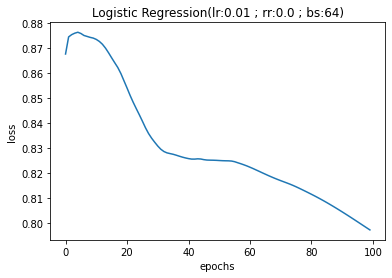

0.5686274509803921
0.09090909090909091
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


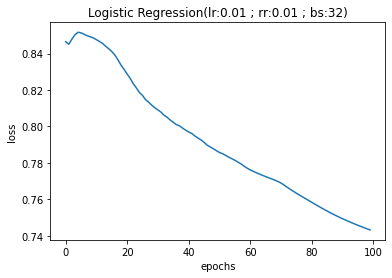

0.5882352941176471
0.09523809523809523
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


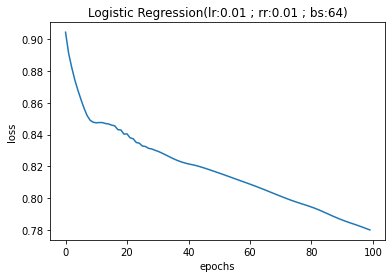

0.5686274509803921
0.09090909090909091
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


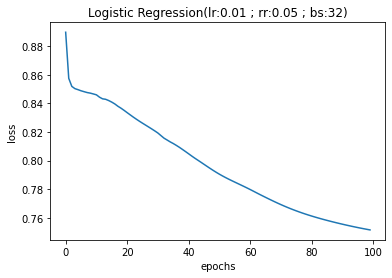

0.5686274509803921
0.09090909090909091
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


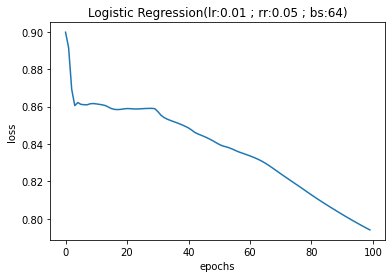

0.5882352941176471
0.09523809523809523
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


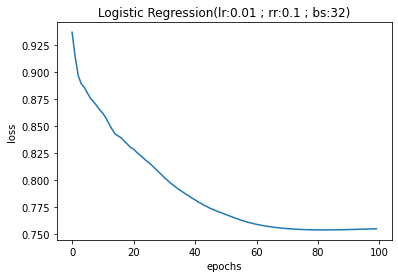

0.6470588235294118
0.1111111111111111
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


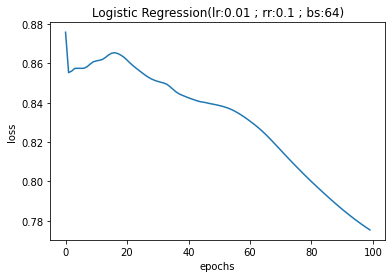

0.5882352941176471
0.09523809523809523
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


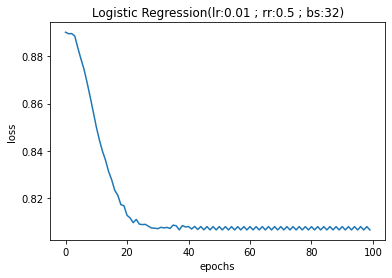

0.5686274509803921
0.15384615384615385
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


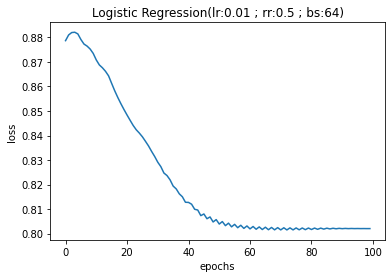

0.6078431372549019
0.13636363636363635
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


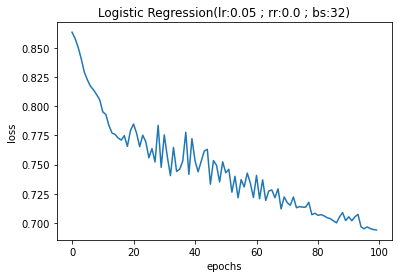

0.6666666666666666
0.11764705882352941
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


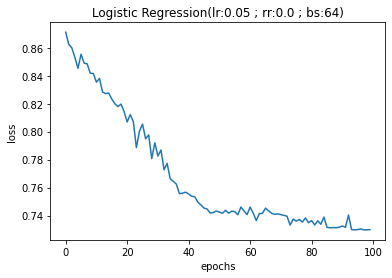

0.6078431372549019
0.13636363636363635
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


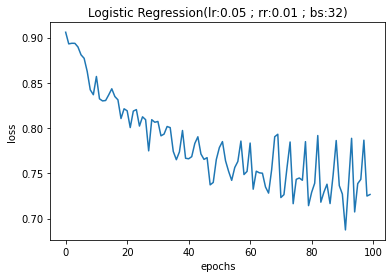

0.5294117647058824
0.11538461538461539
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


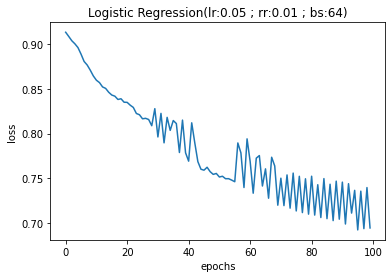

0.7058823529411765
0.17647058823529413
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


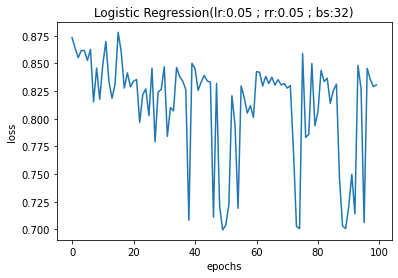

0.47058823529411764
0.12903225806451613
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


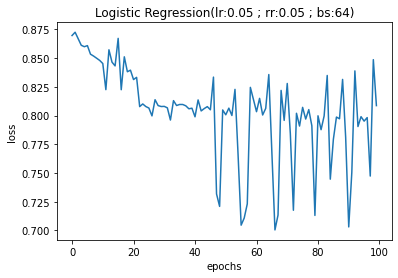

0.5098039215686274
0.13793103448275862
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


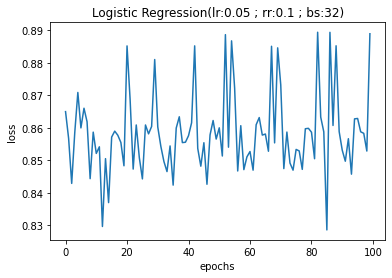

0.39215686274509803
0.11428571428571428
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


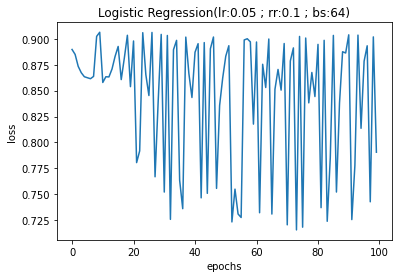

0.6666666666666666
0.0
0.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


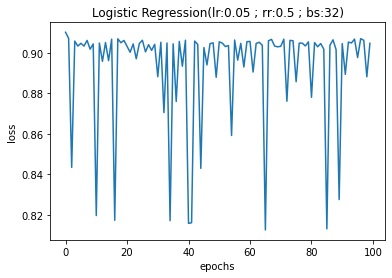

0.37254901960784315
0.1111111111111111
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


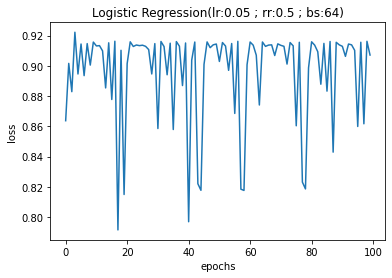

0.35294117647058826
0.10810810810810811
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


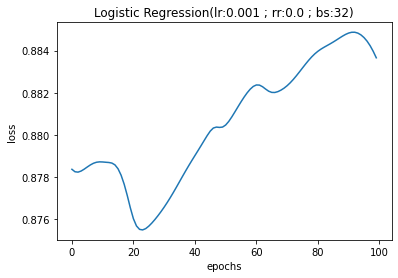

0.43137254901960786
0.037037037037037035
0.25
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


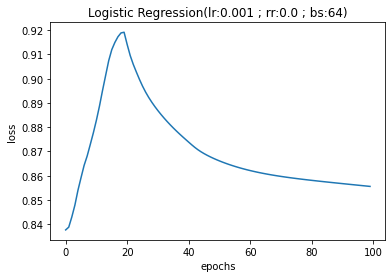

0.45098039215686275
0.07142857142857142
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


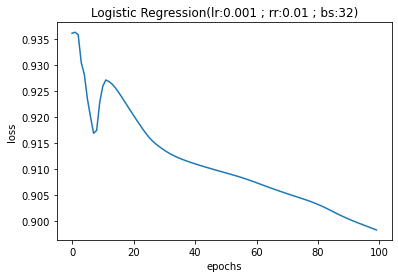

0.39215686274509803
0.11428571428571428
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


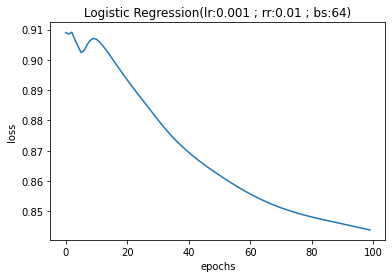

0.5882352941176471
0.13043478260869565
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


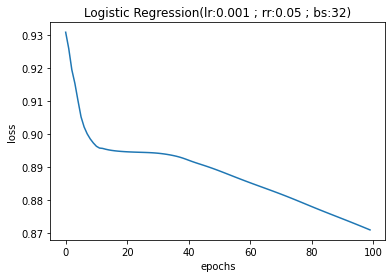

0.43137254901960786
0.12121212121212122
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


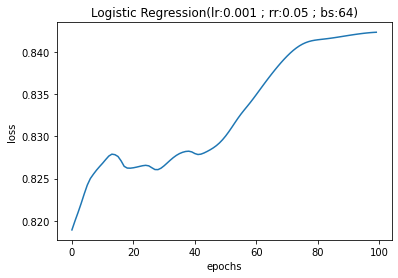

0.5294117647058824
0.08333333333333333
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


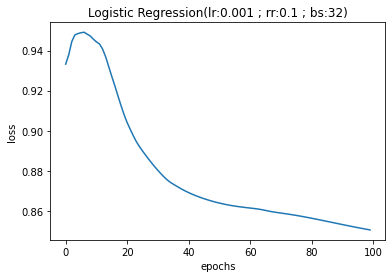

0.5294117647058824
0.08333333333333333
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


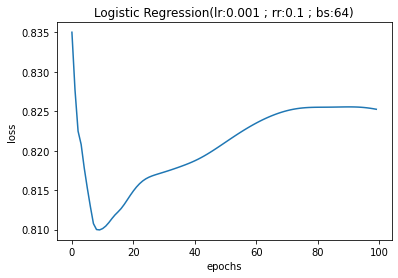

0.5490196078431373
0.12
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


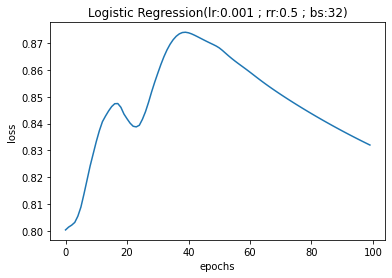

0.49019607843137253
0.07692307692307693
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


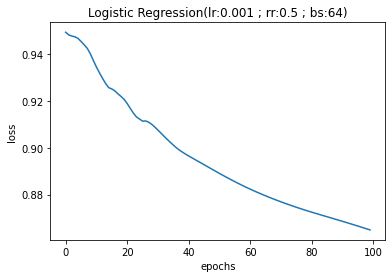

0.45098039215686275
0.07142857142857142
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


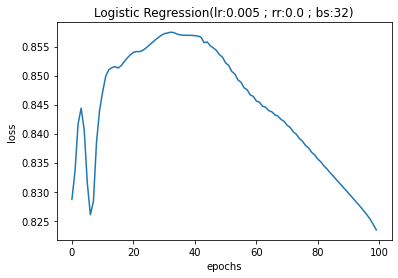

0.5686274509803921
0.125
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


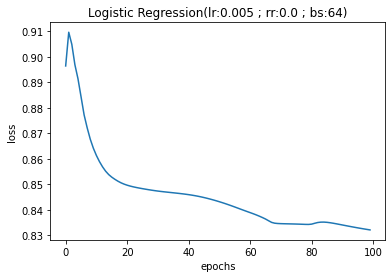

0.5098039215686274
0.043478260869565216
0.25
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


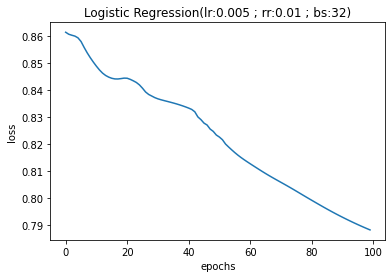

0.6078431372549019
0.1
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


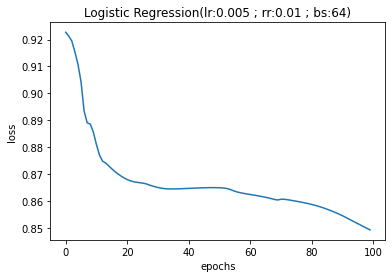

0.5882352941176471
0.13043478260869565
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


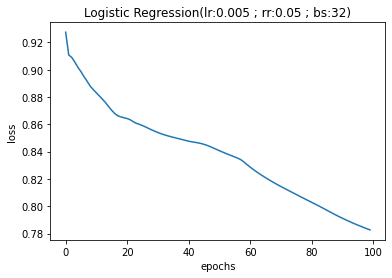

0.5098039215686274
0.043478260869565216
0.25
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


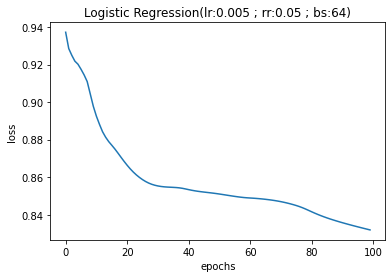

0.5882352941176471
0.09523809523809523
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


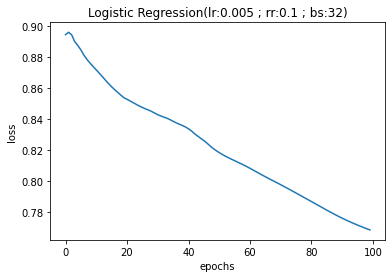

0.5686274509803921
0.05
0.25
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


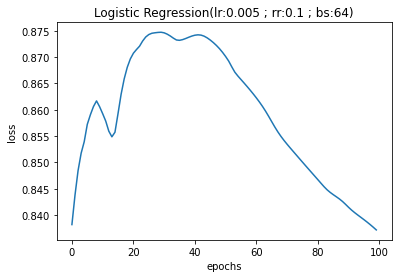

0.5294117647058824
0.11538461538461539
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


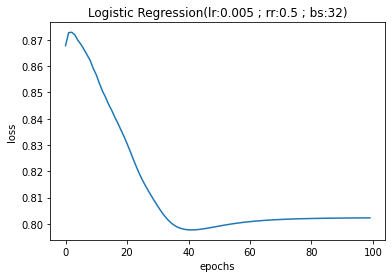

0.5686274509803921
0.125
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


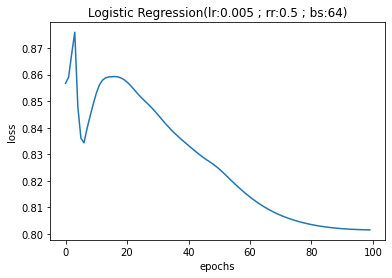

0.6666666666666666
0.15789473684210525
0.75
### FINISHED HYPERPARAMETER SEARCH ###
### STARTING HYPERPARAMETER SEARCH ###
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


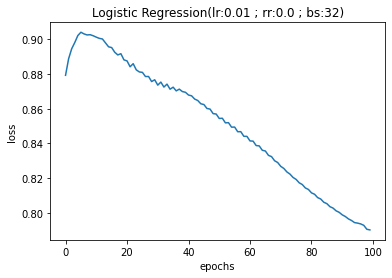

0.5686274509803921
0.3333333333333333
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


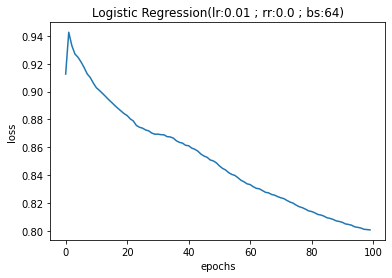

0.5490196078431373
0.3333333333333333
0.7692307692307693
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


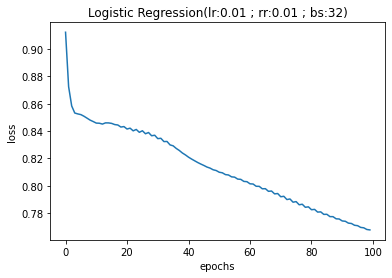

0.5686274509803921
0.30434782608695654
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


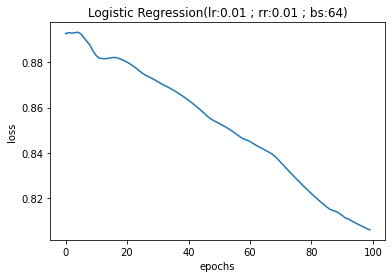

0.5490196078431373
0.3076923076923077
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


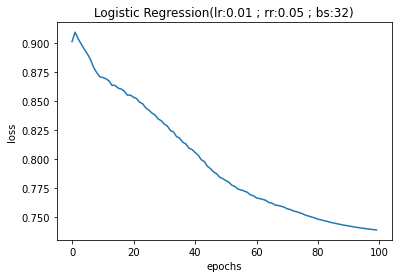

0.5098039215686274
0.2692307692307692
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


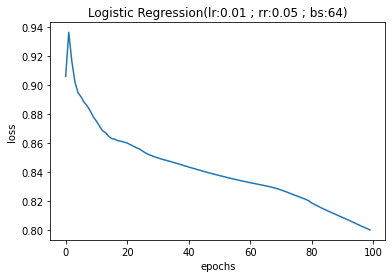

0.5490196078431373
0.3076923076923077
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


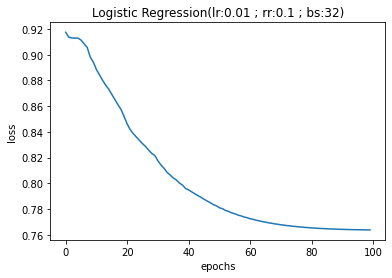

0.5686274509803921
0.32
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


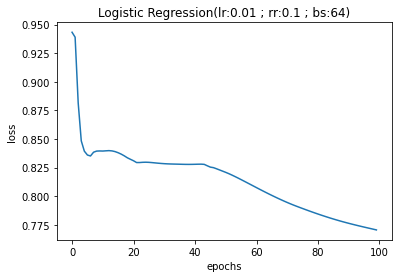

0.6470588235294118
0.4074074074074074
0.8461538461538461
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


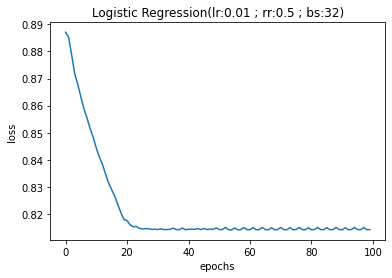

0.5882352941176471
0.35714285714285715
0.7692307692307693
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


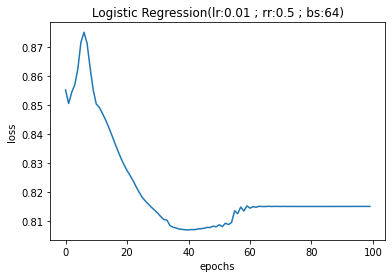

0.5294117647058824
0.3225806451612903
0.7692307692307693
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


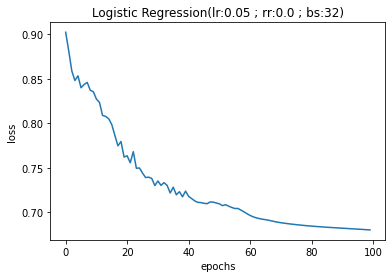

0.5098039215686274
0.25
0.46153846153846156
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


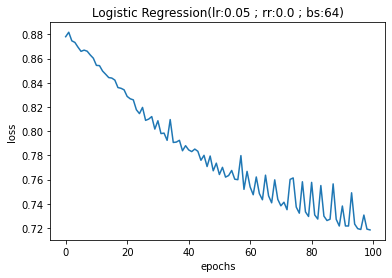

0.6274509803921569
0.375
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


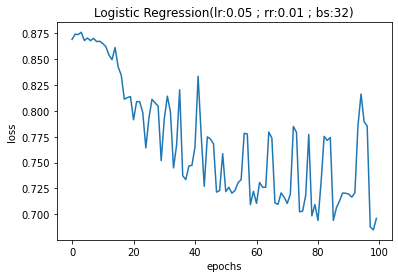

0.7058823529411765
0.45454545454545453
0.7692307692307693
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


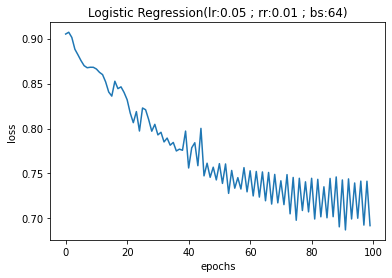

0.6862745098039216
0.4117647058823529
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


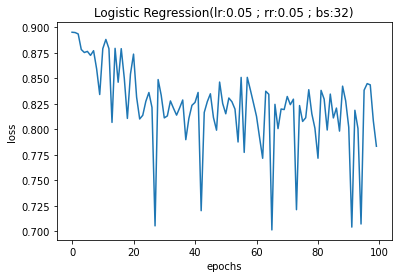

0.6078431372549019
0.3793103448275862
0.8461538461538461
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


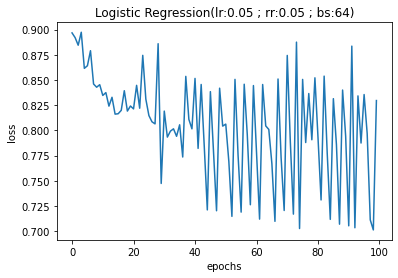

0.47058823529411764
0.29411764705882354
0.7692307692307693
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


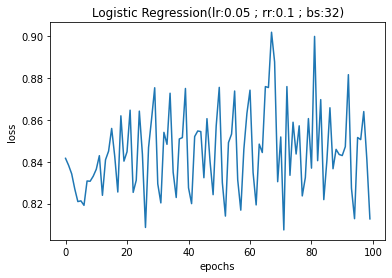

0.5686274509803921
0.3448275862068966
0.7692307692307693
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


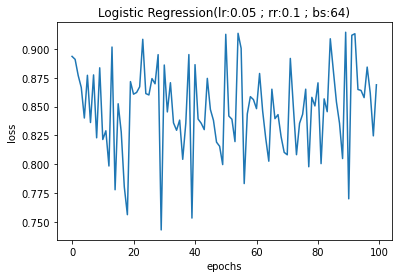

0.4117647058823529
0.2702702702702703
0.7692307692307693
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


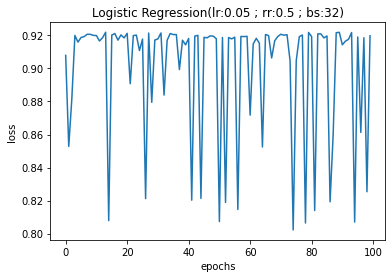

0.47058823529411764
0.3055555555555556
0.8461538461538461
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


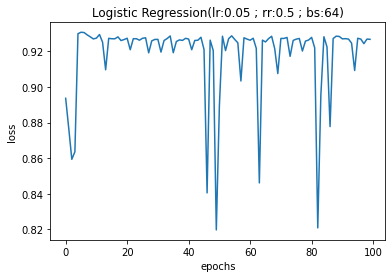

0.45098039215686275
0.3076923076923077
0.9230769230769231
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


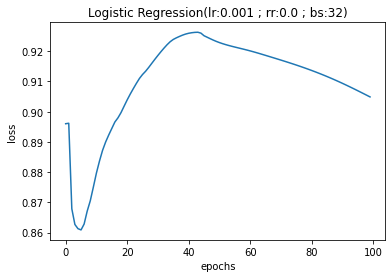

0.4117647058823529
0.20689655172413793
0.46153846153846156
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


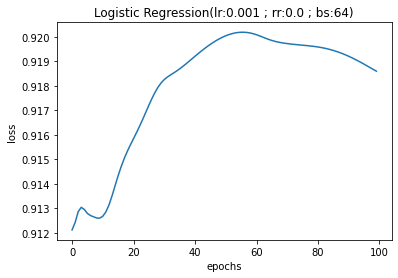

0.4117647058823529
0.24242424242424243
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


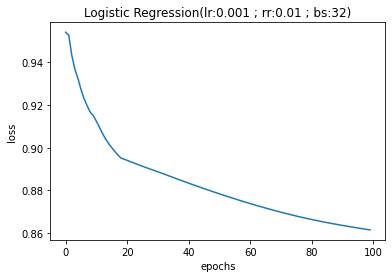

0.5686274509803921
0.3448275862068966
0.7692307692307693
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


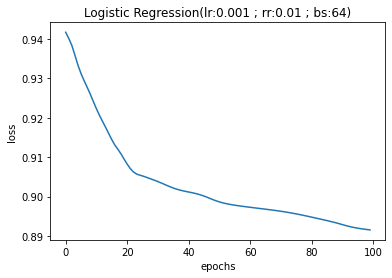

0.47058823529411764
0.28125
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


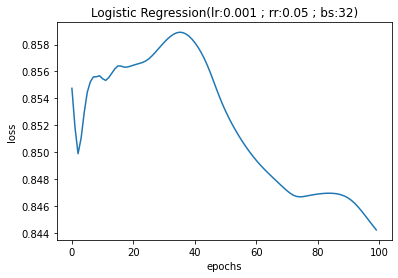

0.47058823529411764
0.28125
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


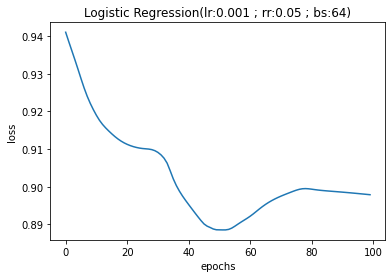

0.5490196078431373
0.2916666666666667
0.5384615384615384
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


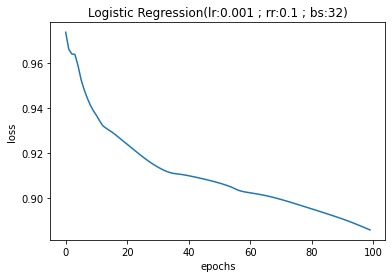

0.5686274509803921
0.32
0.6153846153846154
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


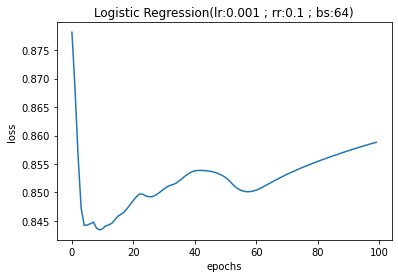

0.5686274509803921
0.3333333333333333
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


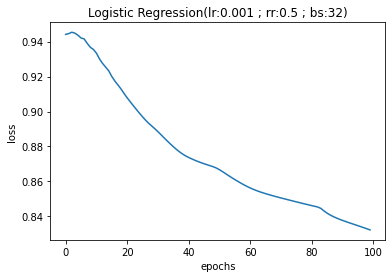

0.6470588235294118
0.4074074074074074
0.8461538461538461
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


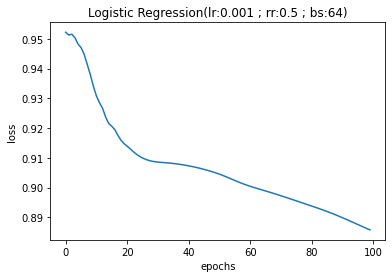

0.37254901960784315
0.12
0.23076923076923078
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


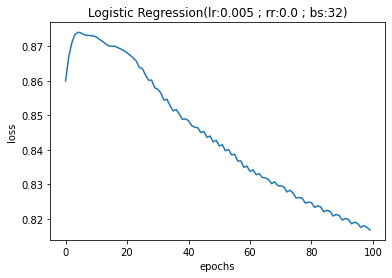

0.6078431372549019
0.37037037037037035
0.7692307692307693
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


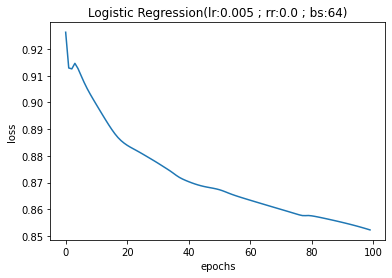

0.5490196078431373
0.32142857142857145
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


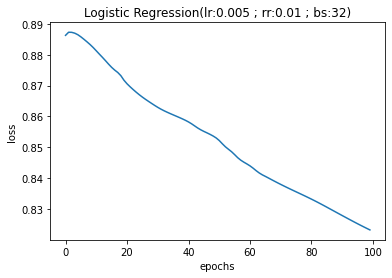

0.49019607843137253
0.21739130434782608
0.38461538461538464
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


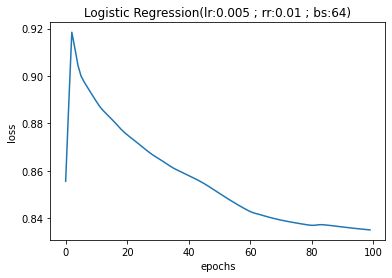

0.5686274509803921
0.3333333333333333
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


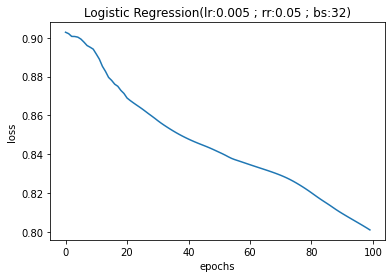

0.5882352941176471
0.3
0.46153846153846156
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


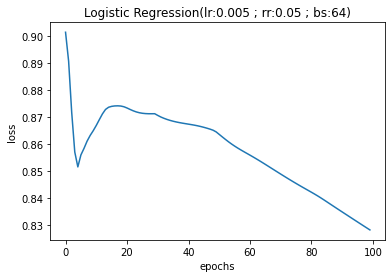

0.5686274509803921
0.2631578947368421
0.38461538461538464
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


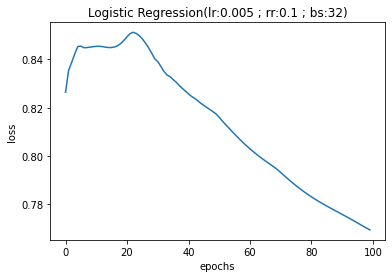

0.6274509803921569
0.375
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


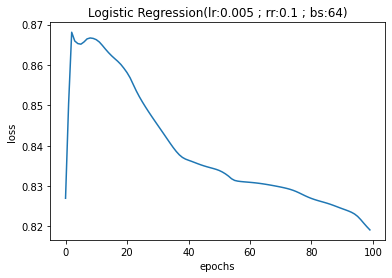

0.49019607843137253
0.2903225806451613
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


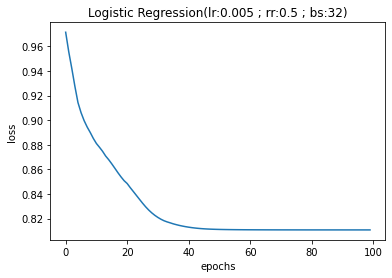

0.5490196078431373
0.32142857142857145
0.6923076923076923
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


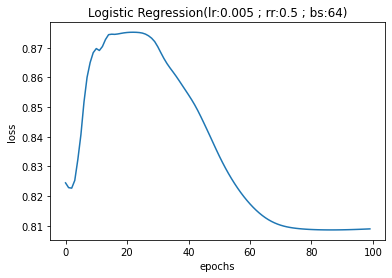

0.5294117647058824
0.2962962962962963
0.6153846153846154
### FINISHED HYPERPARAMETER SEARCH ###
### STARTING HYPERPARAMETER SEARCH ###
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


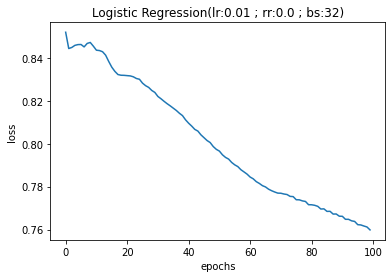

0.5294117647058824
0.1111111111111111
0.2
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


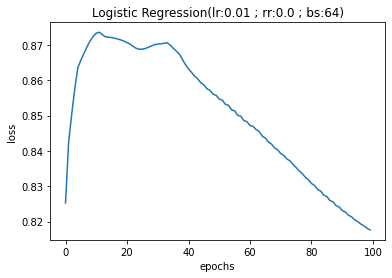

0.5490196078431373
0.19047619047619047
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


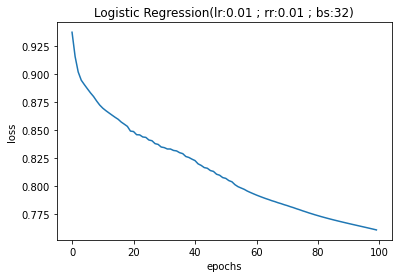

0.5294117647058824
0.1111111111111111
0.2
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


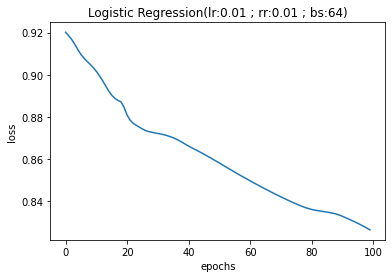

0.5490196078431373
0.21739130434782608
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


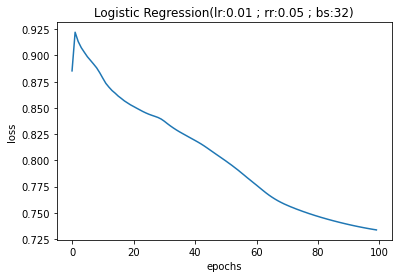

0.5098039215686274
0.14285714285714285
0.3
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


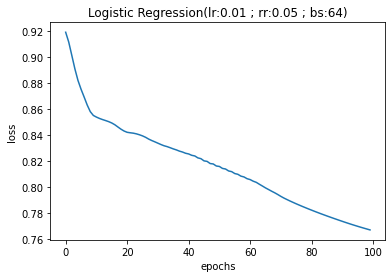

0.5686274509803921
0.16666666666666666
0.3
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


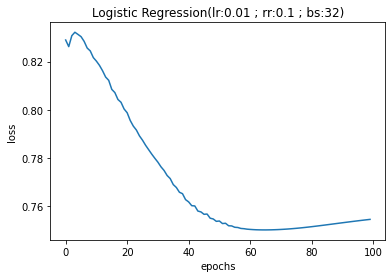

0.5490196078431373
0.19047619047619047
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


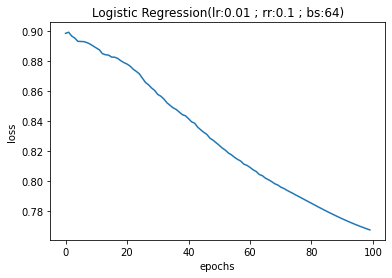

0.5882352941176471
0.21052631578947367
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


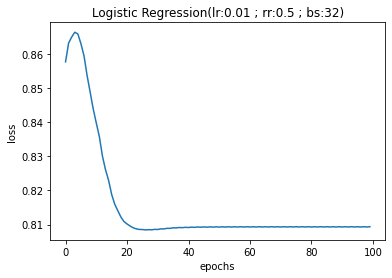

0.4117647058823529
0.14285714285714285
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


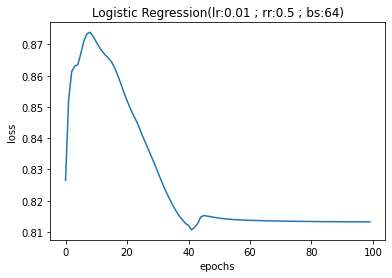

0.4117647058823529
0.11538461538461539
0.3
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


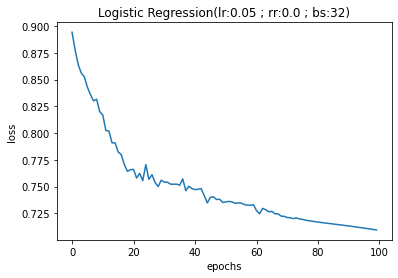

0.5490196078431373
0.19047619047619047
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


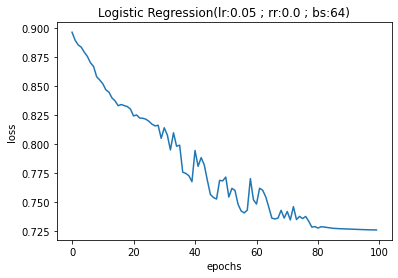

0.6862745098039216
0.2857142857142857
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


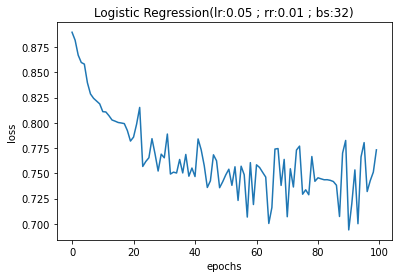

0.47058823529411764
0.16
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


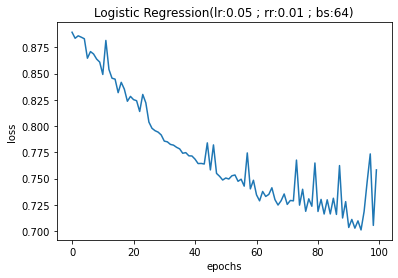

0.5098039215686274
0.17391304347826086
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


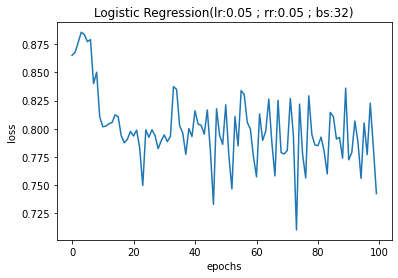

0.45098039215686275
0.09090909090909091
0.2
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


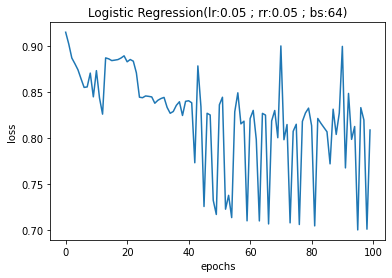

0.35294117647058826
0.10344827586206896
0.3
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


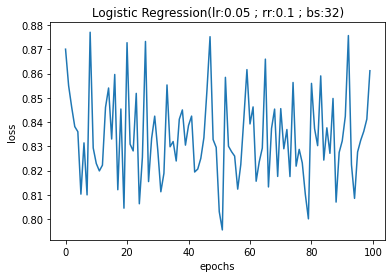

0.39215686274509803
0.13793103448275862
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


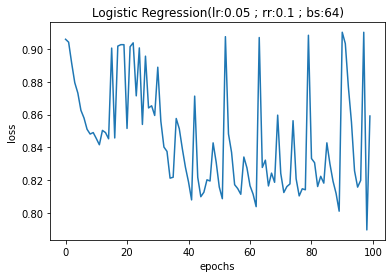

0.43137254901960786
0.21212121212121213
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


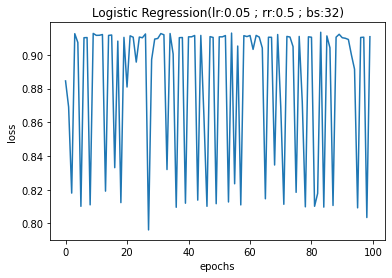

0.4117647058823529
0.1875
0.6
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


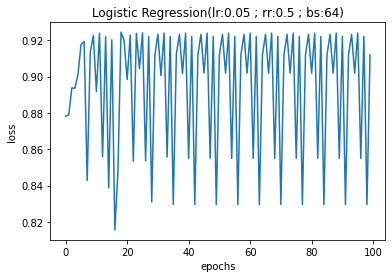

0.39215686274509803
0.18181818181818182
0.6
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


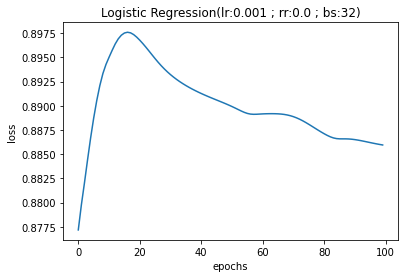

0.39215686274509803
0.16129032258064516
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


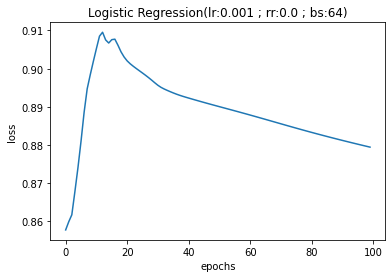

0.5882352941176471
0.2962962962962963
0.8
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


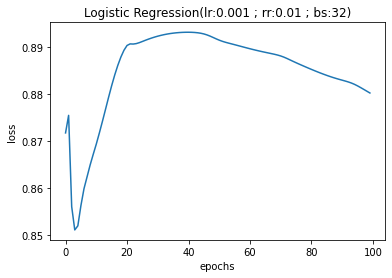

0.45098039215686275
0.15384615384615385
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


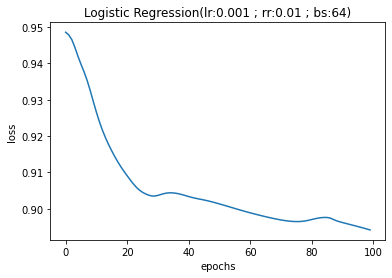

0.47058823529411764
0.20689655172413793
0.6
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


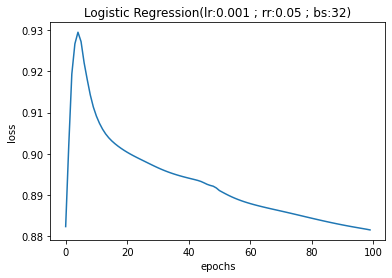

0.5882352941176471
0.2962962962962963
0.8
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


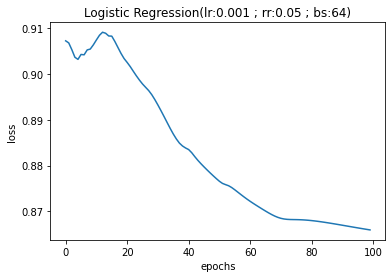

0.43137254901960786
0.14814814814814814
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


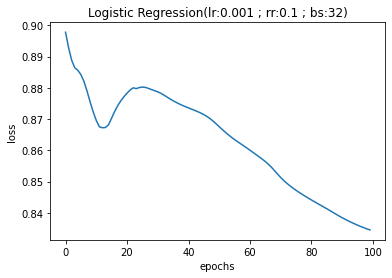

0.5490196078431373
0.24
0.6
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


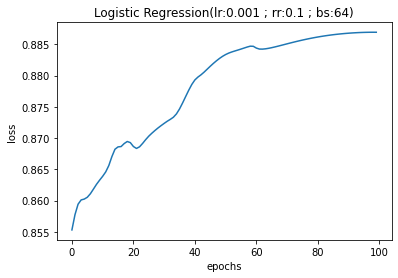

0.47058823529411764
0.20689655172413793
0.6
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


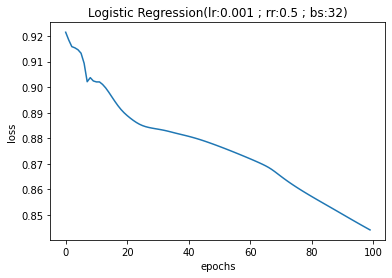

0.5294117647058824
0.18181818181818182
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


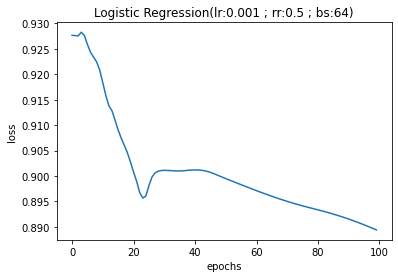

0.5882352941176471
0.21052631578947367
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


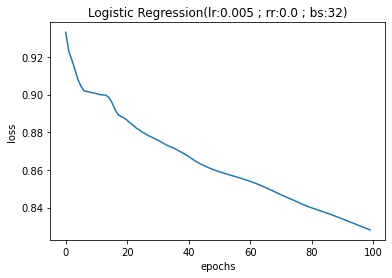

0.6470588235294118
0.3333333333333333
0.8
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


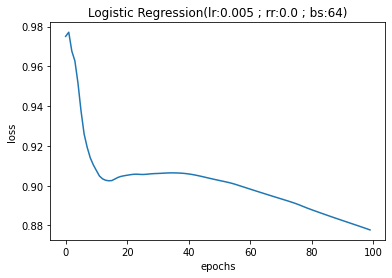

0.49019607843137253
0.16666666666666666
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


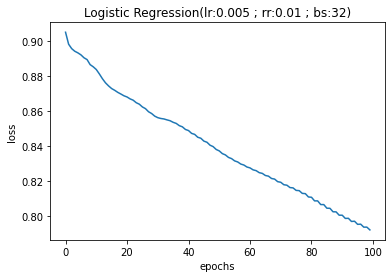

0.5490196078431373
0.19047619047619047
0.4
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


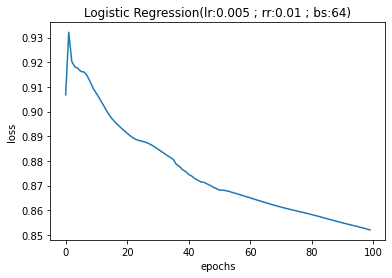

0.4117647058823529
0.11538461538461539
0.3
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


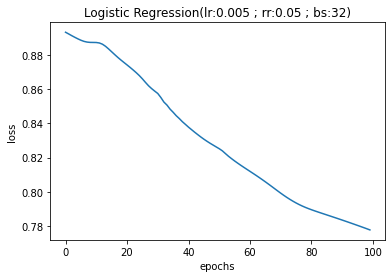

0.6470588235294118
0.21428571428571427
0.3
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


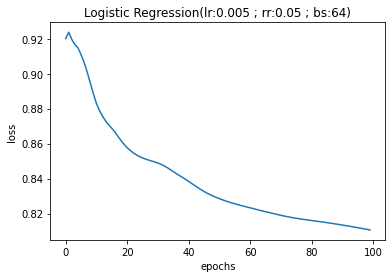

0.5686274509803921
0.22727272727272727
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


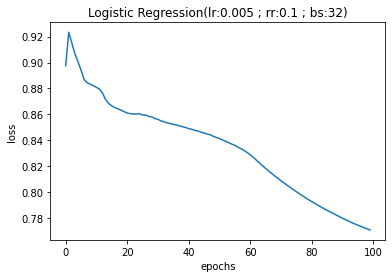

0.6470588235294118
0.16666666666666666
0.2
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


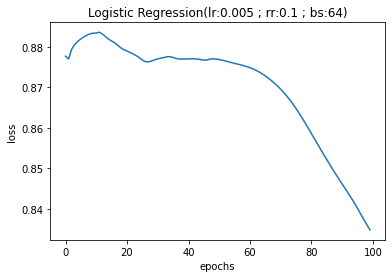

0.5490196078431373
0.25925925925925924
0.7
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


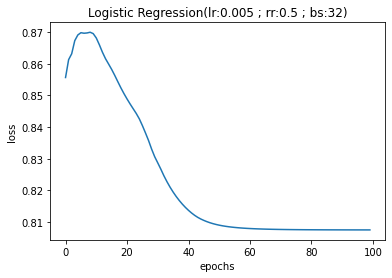

0.45098039215686275
0.125
0.3
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


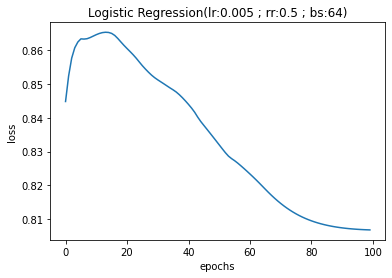

0.49019607843137253
0.16666666666666666
0.4
### FINISHED HYPERPARAMETER SEARCH ###
### STARTING HYPERPARAMETER SEARCH ###
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


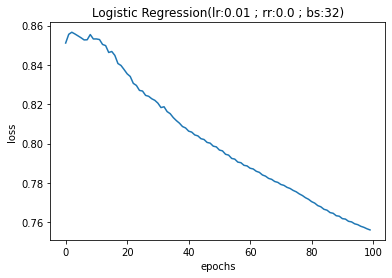

0.5294117647058824
0.15789473684210525
0.2727272727272727
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


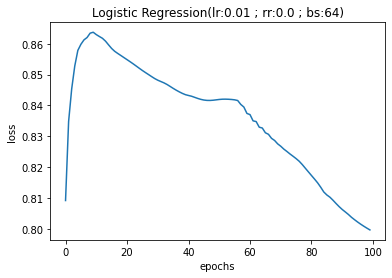

0.5490196078431373
0.22727272727272727
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


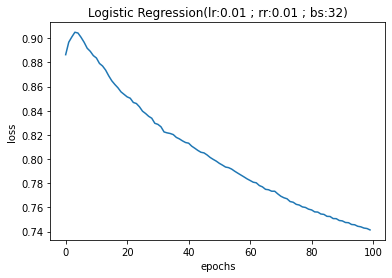

0.7058823529411765
0.375
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


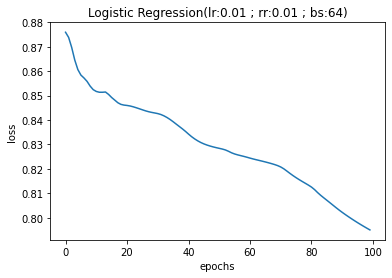

0.5882352941176471
0.2222222222222222
0.36363636363636365
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


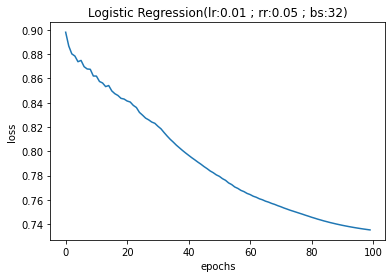

0.5686274509803921
0.2608695652173913
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


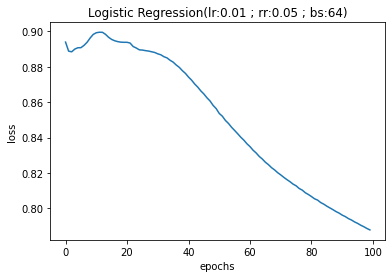

0.6470588235294118
0.3333333333333333
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


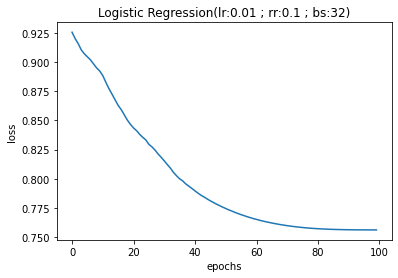

0.5490196078431373
0.2
0.36363636363636365
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


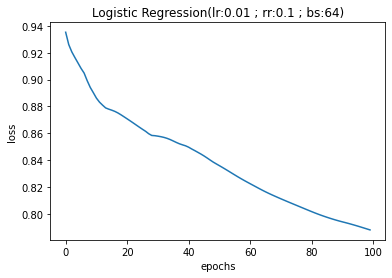

0.45098039215686275
0.18518518518518517
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


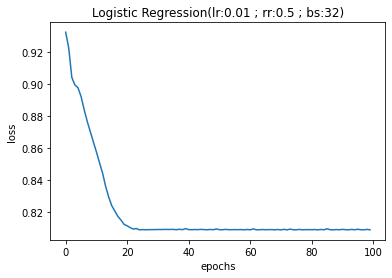

0.5098039215686274
0.20833333333333334
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


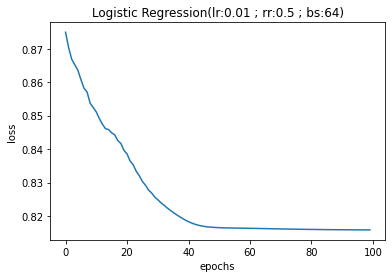

0.6078431372549019
0.3448275862068966
0.9090909090909091
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


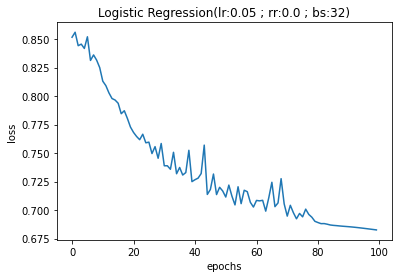

0.49019607843137253
0.17391304347826086
0.36363636363636365
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


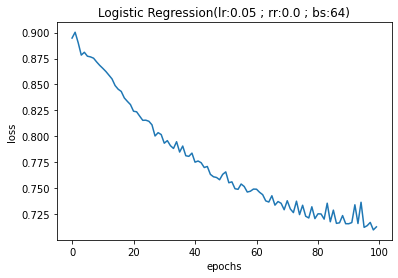

0.6274509803921569
0.3181818181818182
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


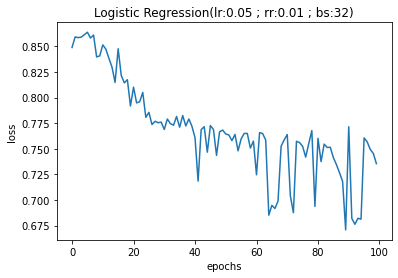

0.6078431372549019
0.2857142857142857
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


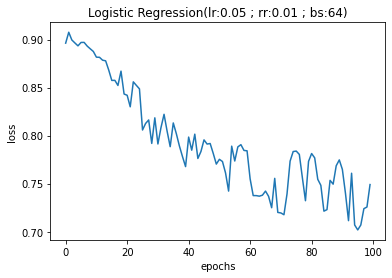

0.5882352941176471
0.2916666666666667
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


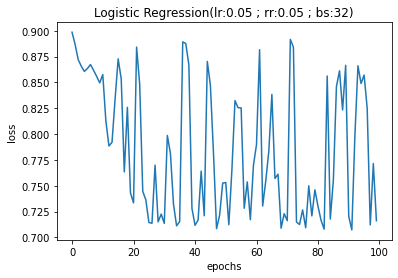

0.6274509803921569
0.2777777777777778
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


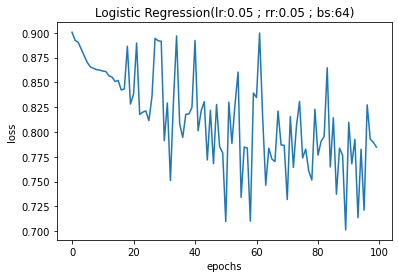

0.5686274509803921
0.3225806451612903
0.9090909090909091
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


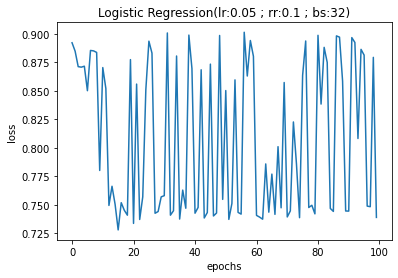

0.5882352941176471
0.2727272727272727
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


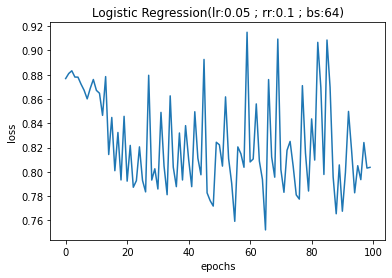

0.5098039215686274
0.29411764705882354
0.9090909090909091
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


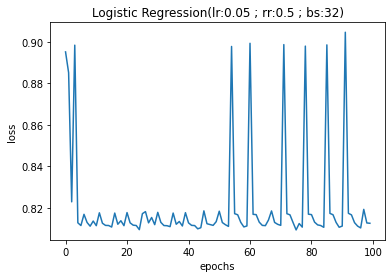

0.6862745098039216
0.2727272727272727
0.2727272727272727
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


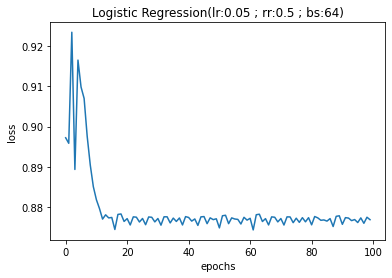

0.49019607843137253
0.2727272727272727
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


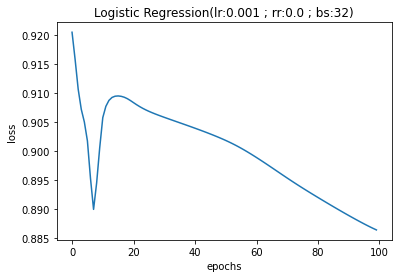

0.5098039215686274
0.26666666666666666
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


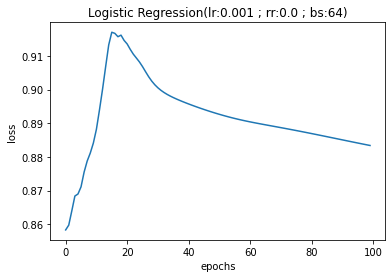

0.39215686274509803
0.16666666666666666
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


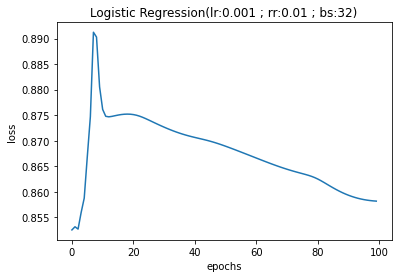

0.39215686274509803
0.11538461538461539
0.2727272727272727
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


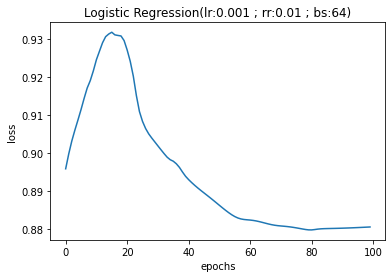

0.5490196078431373
0.2692307692307692
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


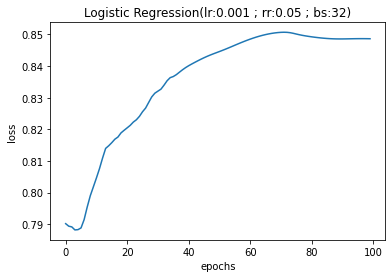

0.39215686274509803
0.16666666666666666
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


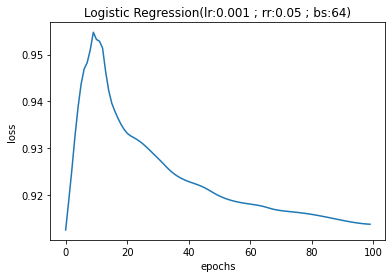

0.5490196078431373
0.2692307692307692
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


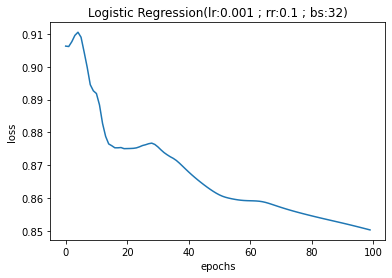

0.39215686274509803
0.11538461538461539
0.2727272727272727
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


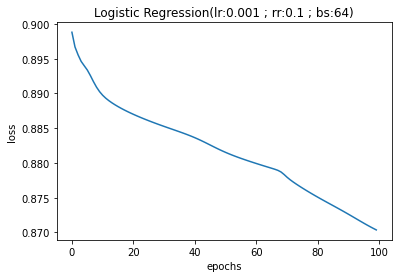

0.5098039215686274
0.23076923076923078
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


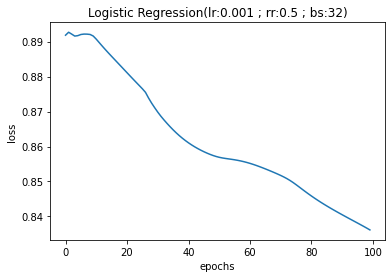

0.43137254901960786
0.2
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


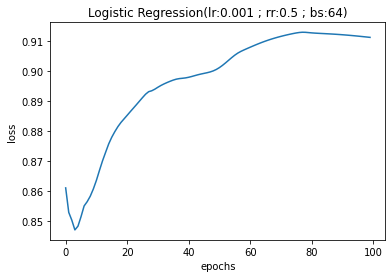

0.47058823529411764
0.21428571428571427
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


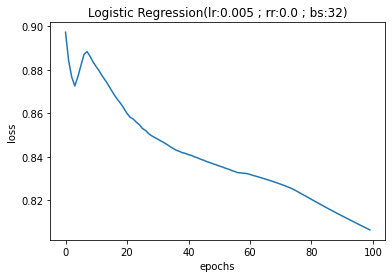

0.6470588235294118
0.36
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


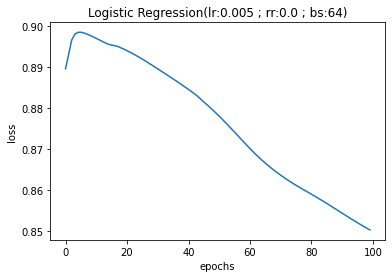

0.5882352941176471
0.2916666666666667
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


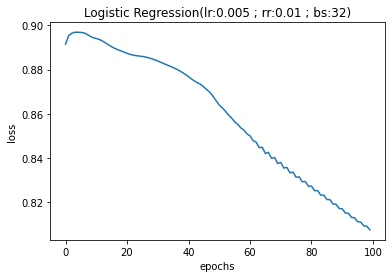

0.49019607843137253
0.2
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


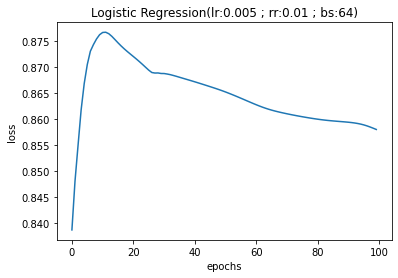

0.5686274509803921
0.2962962962962963
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


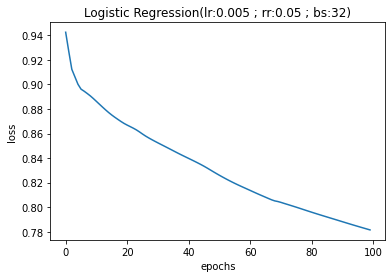

0.47058823529411764
0.21428571428571427
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


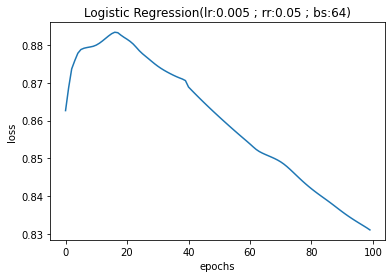

0.5098039215686274
0.23076923076923078
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


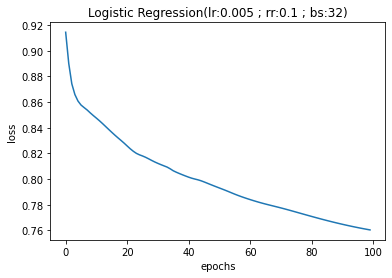

0.6274509803921569
0.25
0.36363636363636365
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


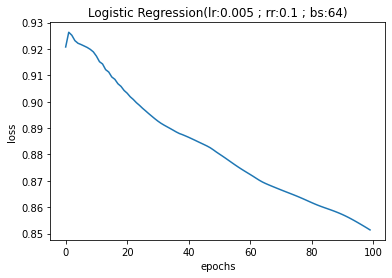

0.49019607843137253
0.2222222222222222
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


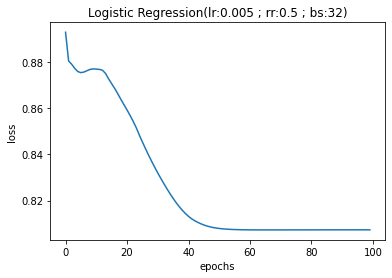

0.5686274509803921
0.2608695652173913
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


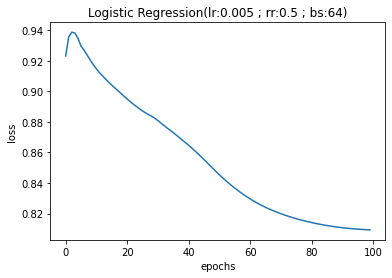

0.5686274509803921
0.2962962962962963
0.7272727272727273
### FINISHED HYPERPARAMETER SEARCH ###
### STARTING HYPERPARAMETER SEARCH ###
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


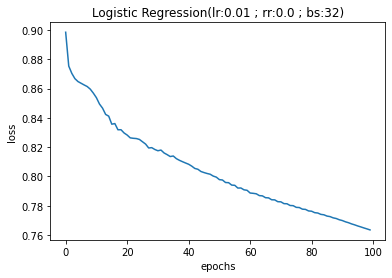

0.7254901960784313
0.38461538461538464
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


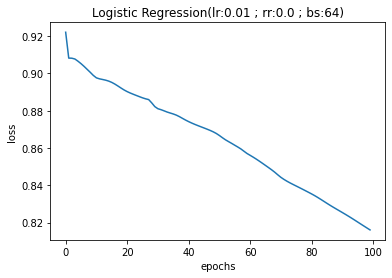

0.5882352941176471
0.2916666666666667
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


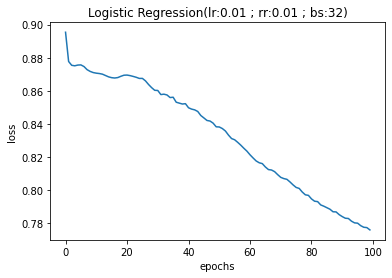

0.5686274509803921
0.21052631578947367
0.36363636363636365
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


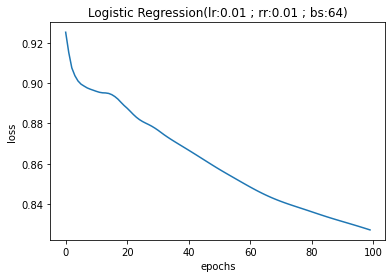

0.5294117647058824
0.21739130434782608
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


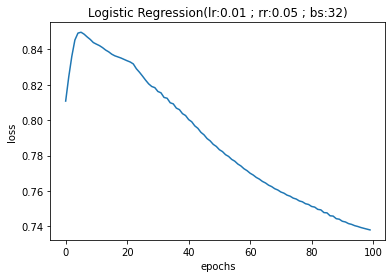

0.7254901960784313
0.4117647058823529
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


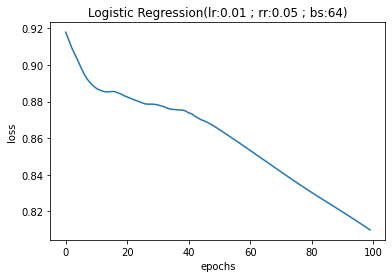

0.6078431372549019
0.32
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


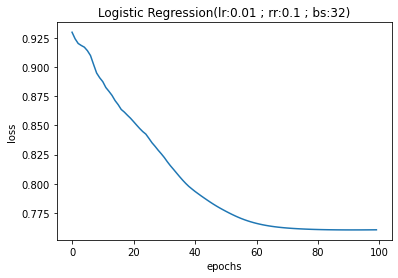

0.7450980392156863
0.45
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


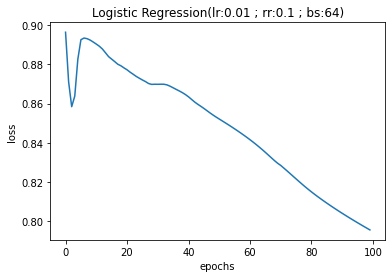

0.6274509803921569
0.3333333333333333
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


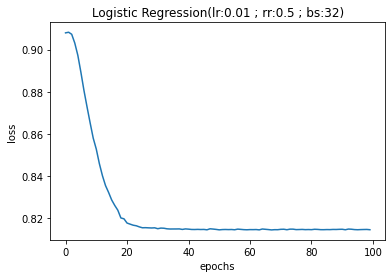

0.5686274509803921
0.3225806451612903
0.9090909090909091
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


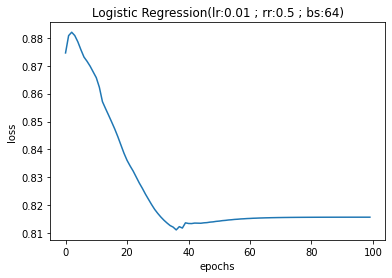

0.5882352941176471
0.32142857142857145
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


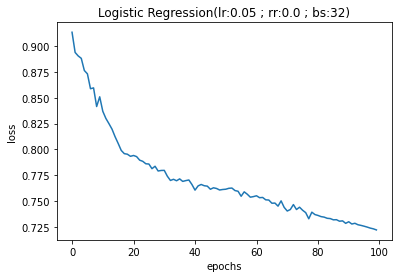

0.6470588235294118
0.26666666666666666
0.36363636363636365
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


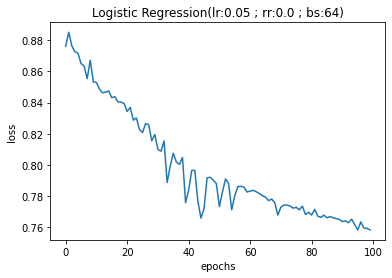

0.5686274509803921
0.2608695652173913
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


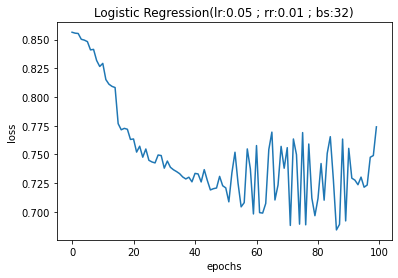

0.6274509803921569
0.34615384615384615
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


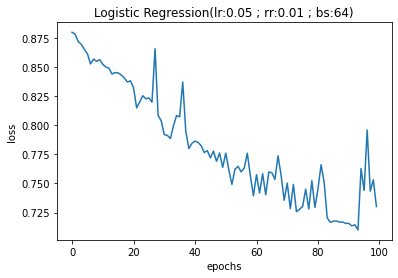

0.7254901960784313
0.36363636363636365
0.36363636363636365
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


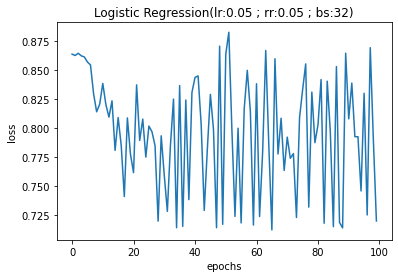

0.7843137254901961
0.5
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


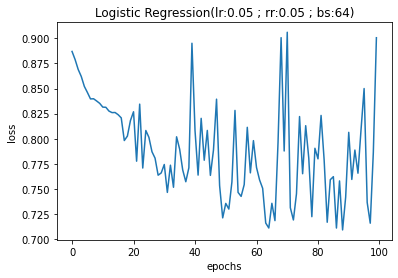

0.43137254901960786
0.2631578947368421
0.9090909090909091
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


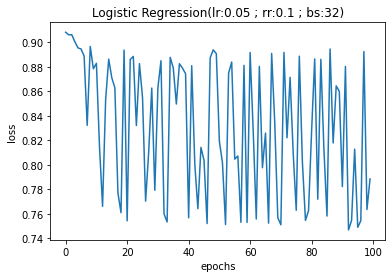

0.6078431372549019
0.3333333333333333
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


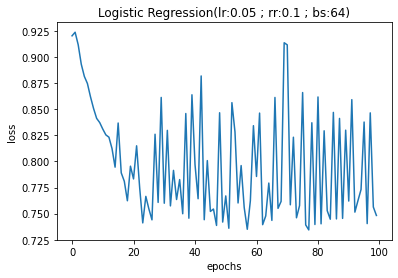

0.7254901960784313
0.2857142857142857
0.18181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


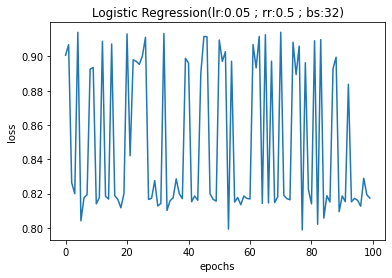

0.7058823529411765
0.25
0.18181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


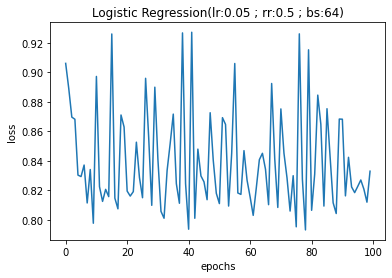

0.6666666666666666
0.125
0.09090909090909091
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


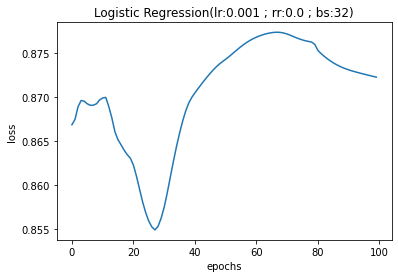

0.5294117647058824
0.2903225806451613
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


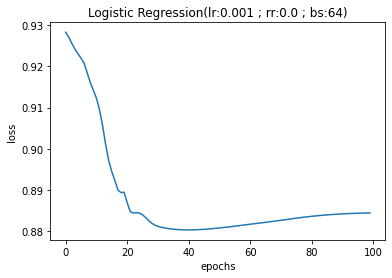

0.5882352941176471
0.3076923076923077
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


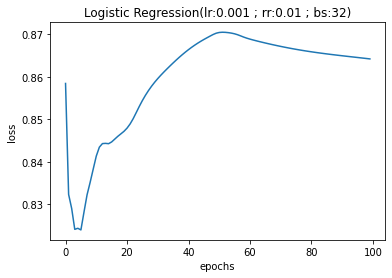

0.7450980392156863
0.45
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


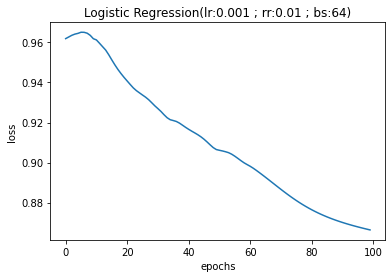

0.5098039215686274
0.25
0.6363636363636364
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


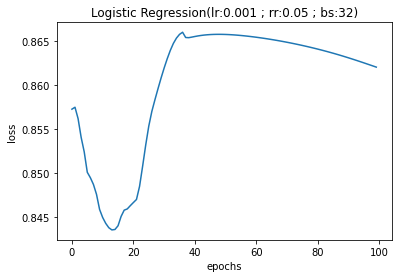

0.6274509803921569
0.36666666666666664
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


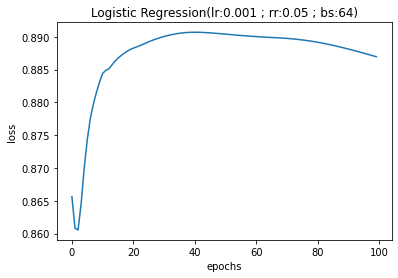

0.39215686274509803
0.16666666666666666
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


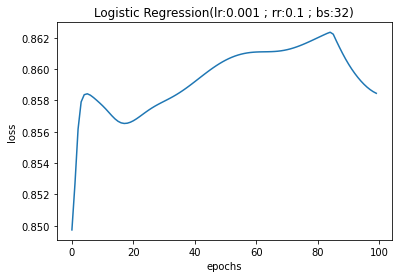

0.5294117647058824
0.21739130434782608
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


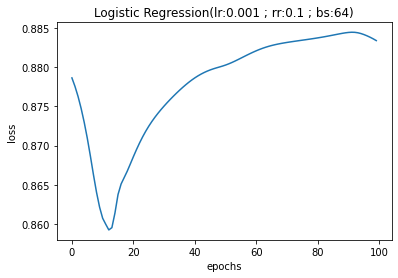

0.47058823529411764
0.25
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


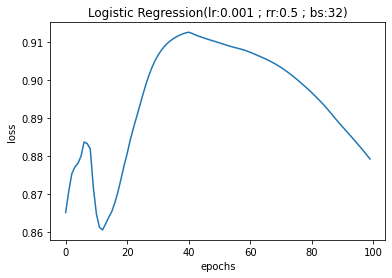

0.5098039215686274
0.28125
0.8181818181818182
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


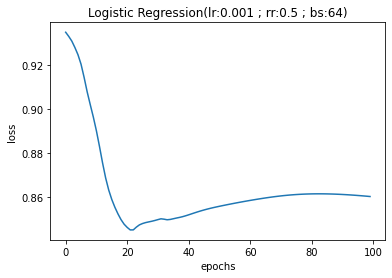

0.6274509803921569
0.3
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


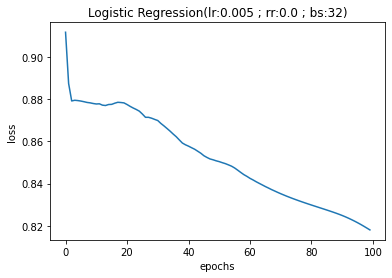

0.6078431372549019
0.2857142857142857
0.5454545454545454
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


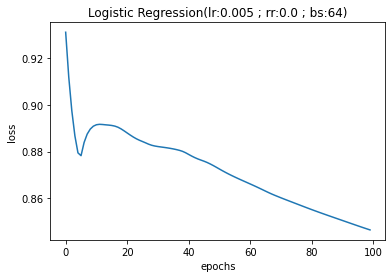

0.5098039215686274
0.26666666666666666
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


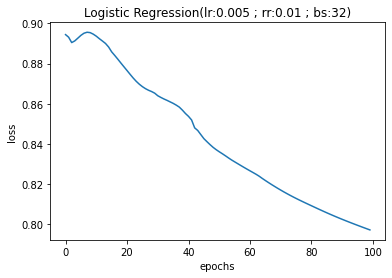

0.5686274509803921
0.21052631578947367
0.36363636363636365
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


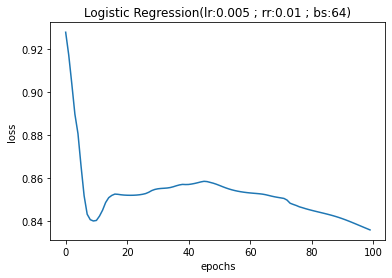

0.5294117647058824
0.21739130434782608
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


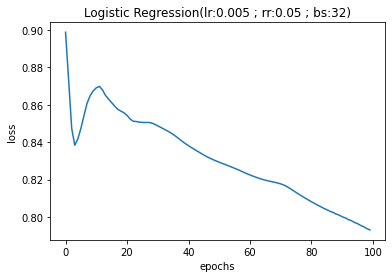

0.5490196078431373
0.22727272727272727
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


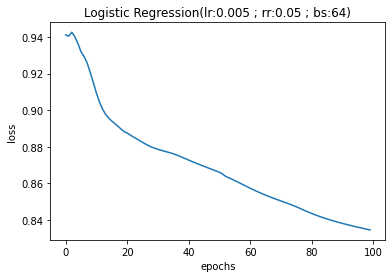

0.47058823529411764
0.19230769230769232
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


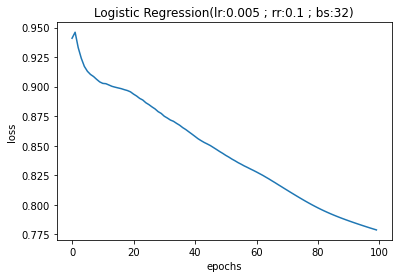

0.6666666666666666
0.3125
0.45454545454545453
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


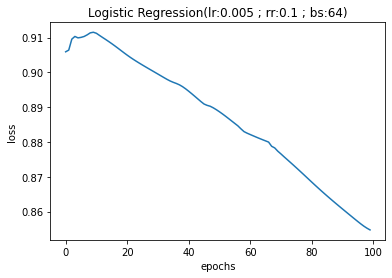

0.47058823529411764
0.25
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


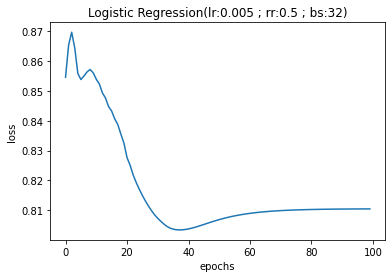

0.6078431372549019
0.32
0.7272727272727273
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


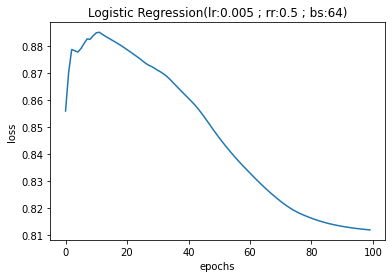

0.6666666666666666
0.375
0.8181818181818182
### FINISHED HYPERPARAMETER SEARCH ###
### STARTING HYPERPARAMETER SEARCH ###
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


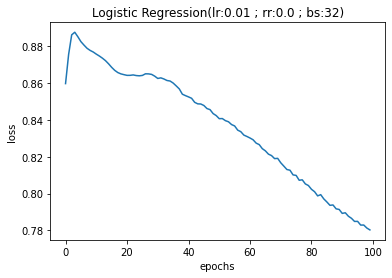

0.5882352941176471
0.4090909090909091
0.5294117647058824
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


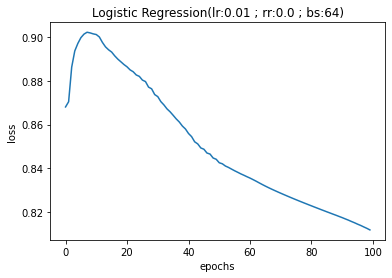

0.6470588235294118
0.48
0.7058823529411765
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


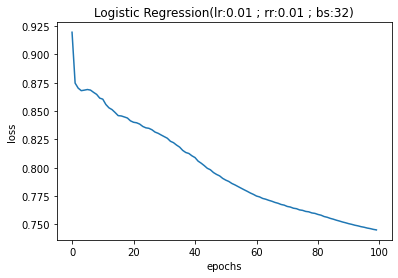

0.6666666666666666
0.5
0.5294117647058824
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


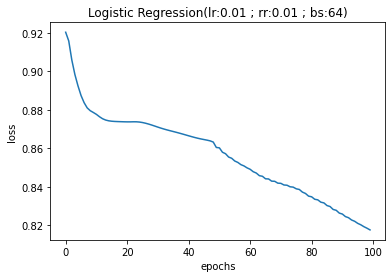

0.6666666666666666
0.5
0.5294117647058824
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


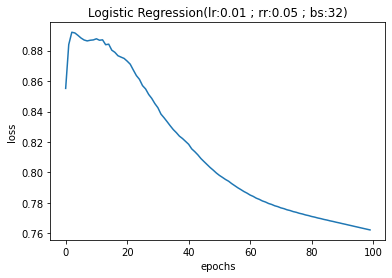

0.6666666666666666
0.5
0.5882352941176471
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


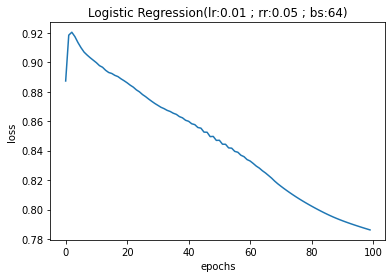

0.6470588235294118
0.4782608695652174
0.6470588235294118
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


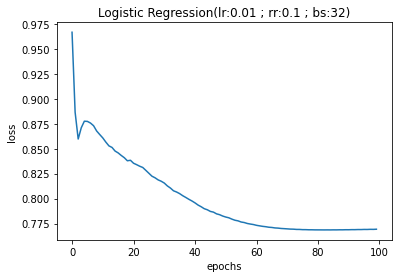

0.7843137254901961
0.6363636363636364
0.8235294117647058
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


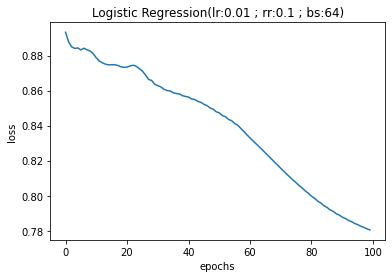

0.6470588235294118
0.47368421052631576
0.5294117647058824
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


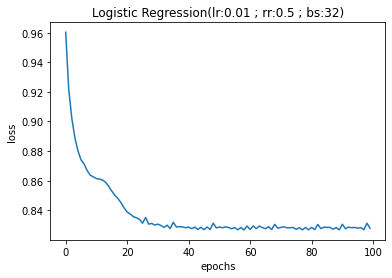

0.6078431372549019
0.4482758620689655
0.7647058823529411
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


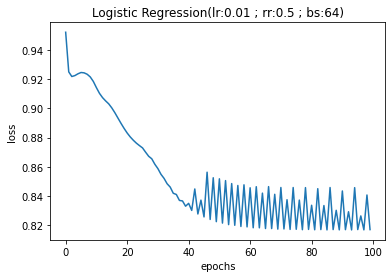

0.7058823529411765
0.5454545454545454
0.7058823529411765
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


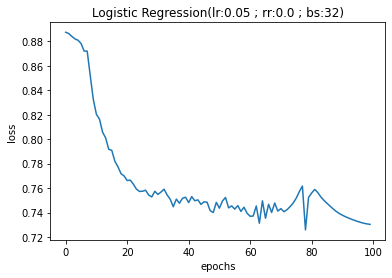

0.6666666666666666
0.5
0.7058823529411765
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


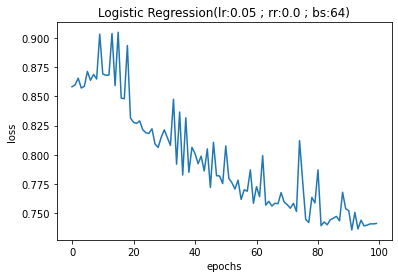

0.6862745098039216
0.5263157894736842
0.5882352941176471
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


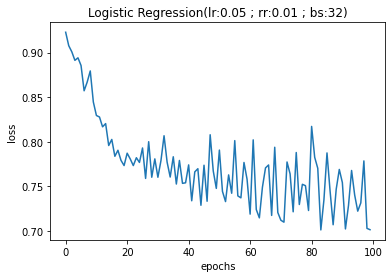

0.7058823529411765
0.5625
0.5294117647058824
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


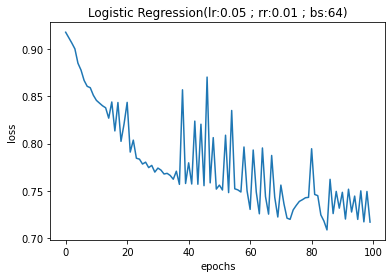

0.6470588235294118
0.47368421052631576
0.5294117647058824
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


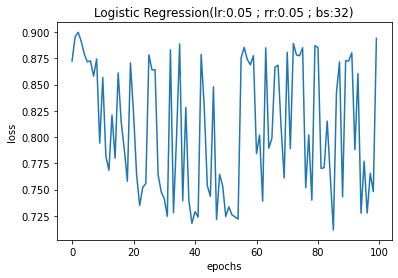

0.5294117647058824
0.4
0.8235294117647058
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


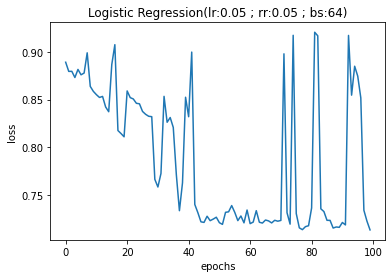

0.7058823529411765
0.6
0.35294117647058826
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


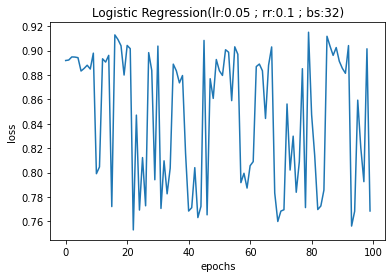

0.6274509803921569
0.4
0.23529411764705882
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


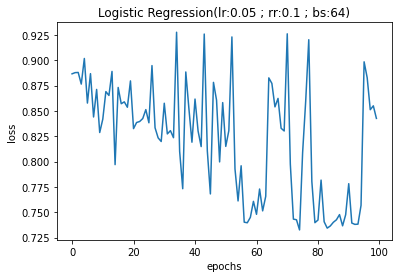

0.5686274509803921
0.41935483870967744
0.7647058823529411
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


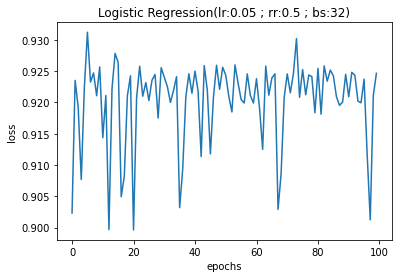

0.49019607843137253
0.3783783783783784
0.8235294117647058
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


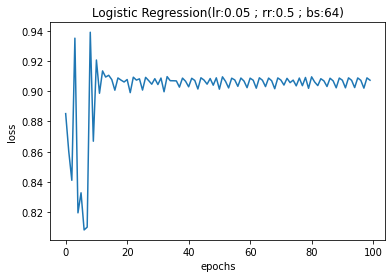

0.47058823529411764
0.3611111111111111
0.7647058823529411
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


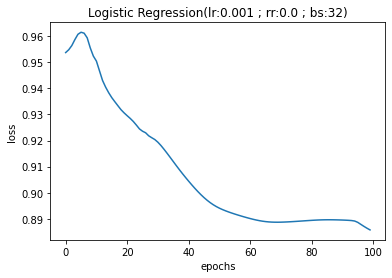

0.49019607843137253
0.37142857142857144
0.7647058823529411
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


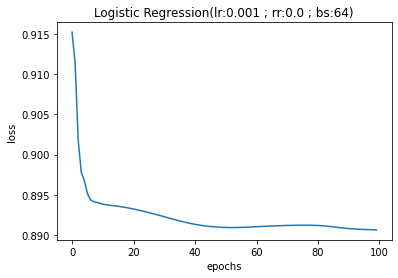

0.49019607843137253
0.3548387096774194
0.6470588235294118
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


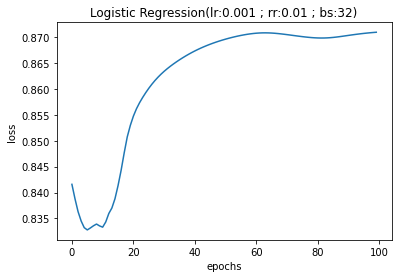

0.5882352941176471
0.4230769230769231
0.6470588235294118
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


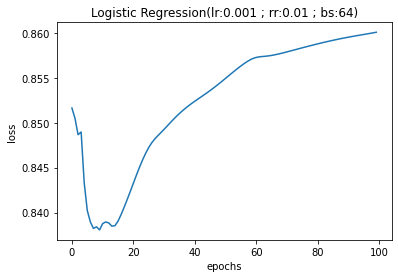

0.5882352941176471
0.4
0.47058823529411764
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


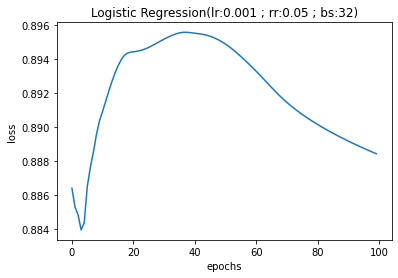

0.4117647058823529
0.24
0.35294117647058826
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


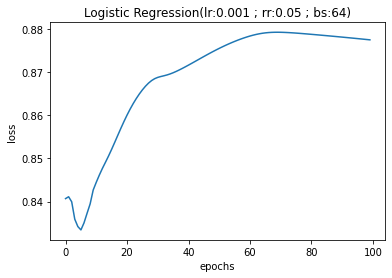

0.49019607843137253
0.3548387096774194
0.6470588235294118
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


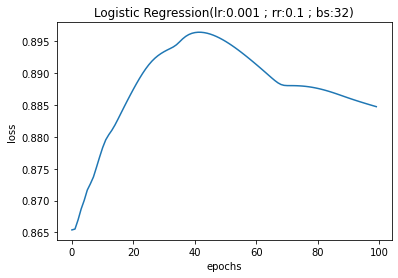

0.5686274509803921
0.4074074074074074
0.6470588235294118
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


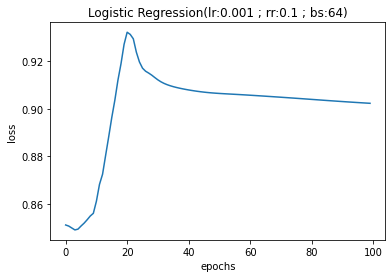

0.5098039215686274
0.34615384615384615
0.5294117647058824
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


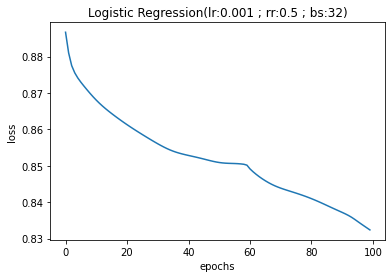

0.5098039215686274
0.34615384615384615
0.5294117647058824
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


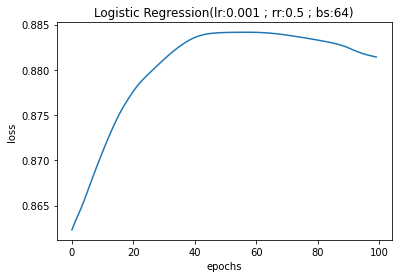

0.4117647058823529
0.24
0.35294117647058826
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


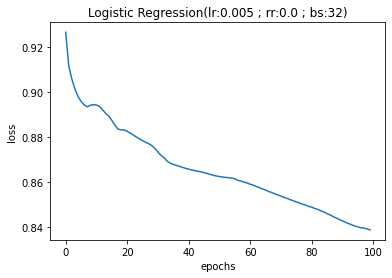

0.5294117647058824
0.36
0.5294117647058824
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


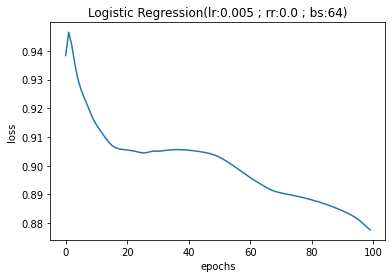

0.5882352941176471
0.4230769230769231
0.6470588235294118
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


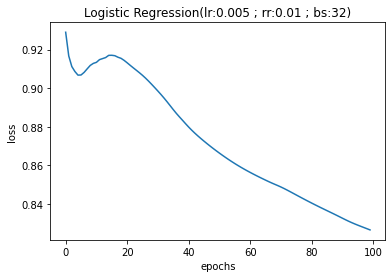

0.5490196078431373
0.375
0.5294117647058824
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


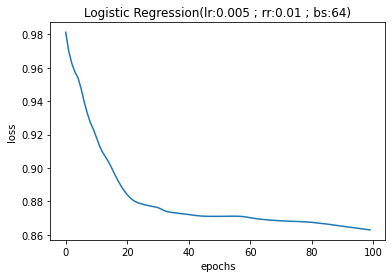

0.5098039215686274
0.34615384615384615
0.5294117647058824
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


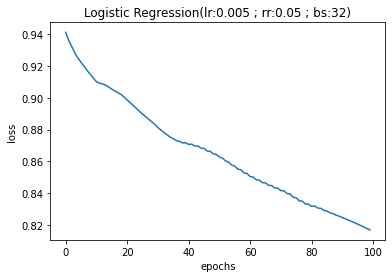

0.5294117647058824
0.34782608695652173
0.47058823529411764
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


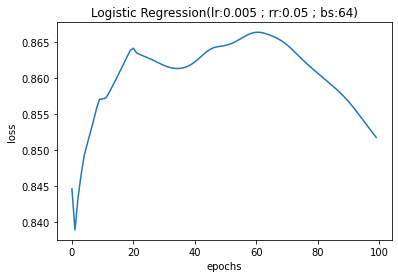

0.5098039215686274
0.36666666666666664
0.6470588235294118
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


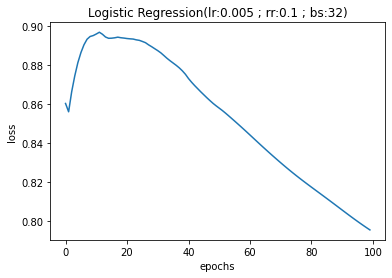

0.6862745098039216
0.5217391304347826
0.7058823529411765
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


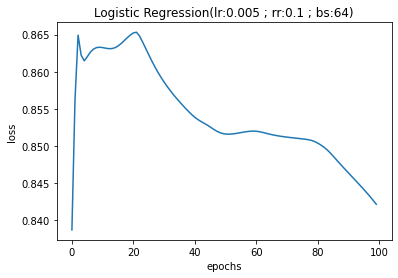

0.6470588235294118
0.4782608695652174
0.6470588235294118
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


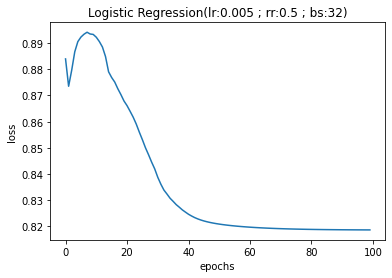

0.6862745098039216
0.5217391304347826
0.7058823529411765
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


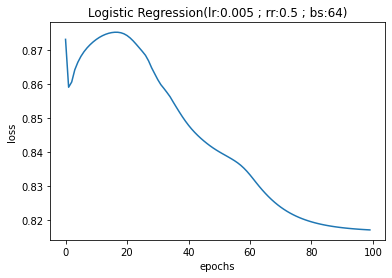

0.6078431372549019
0.43478260869565216
0.5882352941176471
### FINISHED HYPERPARAMETER SEARCH ###
### STARTING HYPERPARAMETER SEARCH ###
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


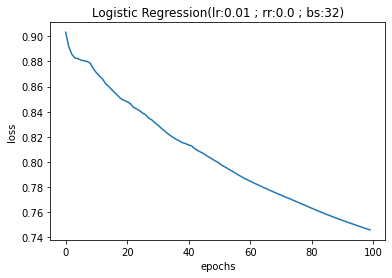

0.5686274509803921
0.25
0.4166666666666667
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


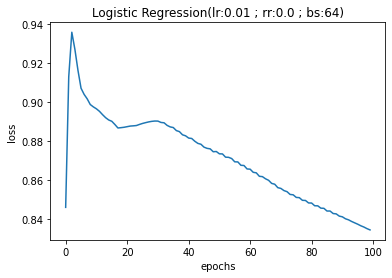

0.49019607843137253
0.25
0.5833333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


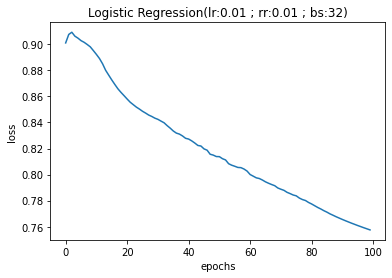

0.6470588235294118
0.36363636363636365
0.6666666666666666
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


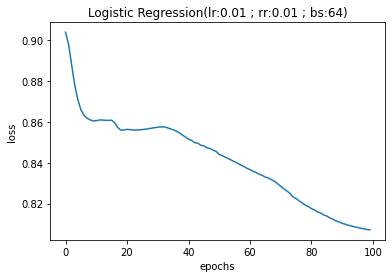

0.5882352941176471
0.3448275862068966
0.8333333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


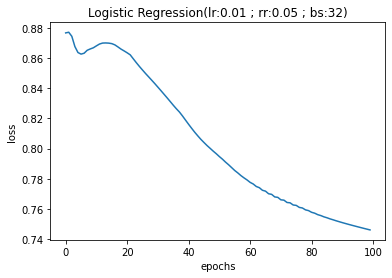

0.5686274509803921
0.2916666666666667
0.5833333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


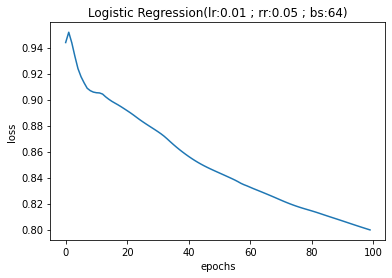

0.5686274509803921
0.3333333333333333
0.8333333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


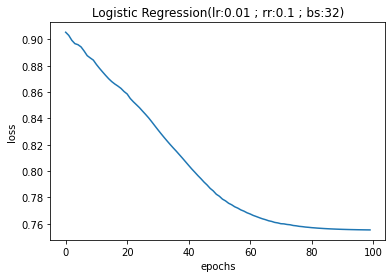

0.6666666666666666
0.4
0.8333333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


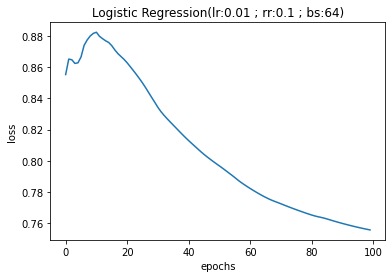

0.6862745098039216
0.4090909090909091
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


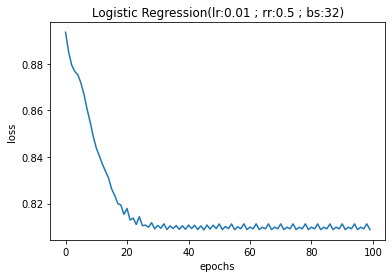

0.5882352941176471
0.3448275862068966
0.8333333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


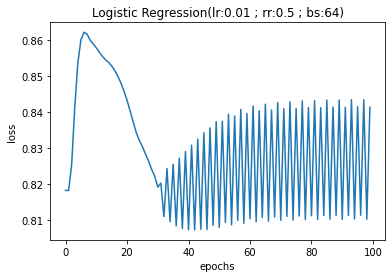

0.49019607843137253
0.3157894736842105
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


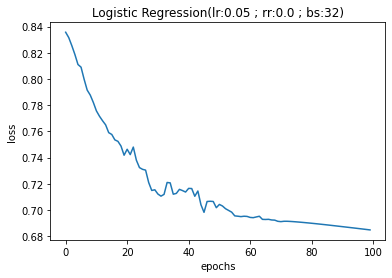

0.6666666666666666
0.3684210526315789
0.5833333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


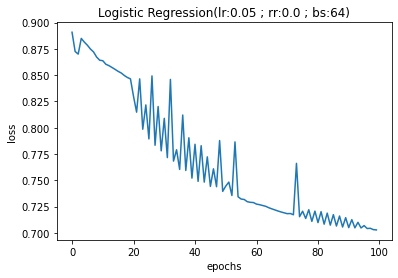

0.6666666666666666
0.38095238095238093
0.6666666666666666
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


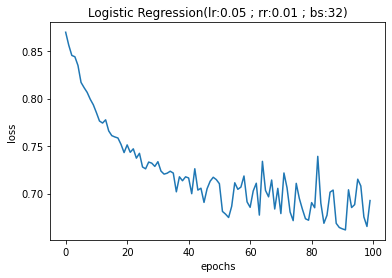

0.6470588235294118
0.375
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


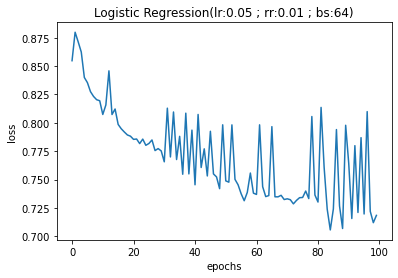

0.5294117647058824
0.2857142857142857
0.6666666666666666
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


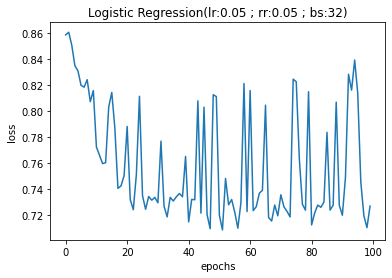

0.5490196078431373
0.13333333333333333
0.16666666666666666
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


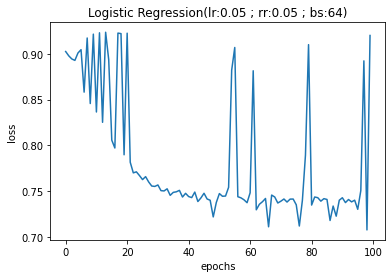

0.47058823529411764
0.3076923076923077
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


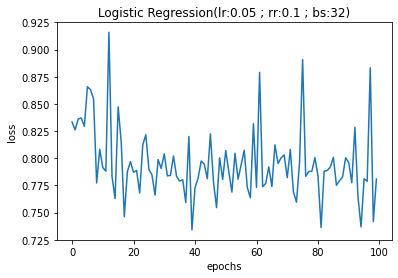

0.47058823529411764
0.0
0.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


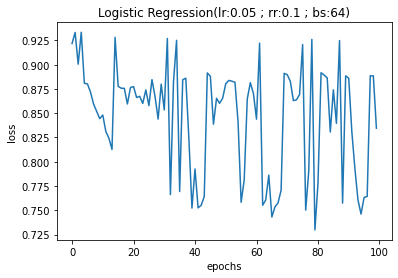

0.47058823529411764
0.3076923076923077
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


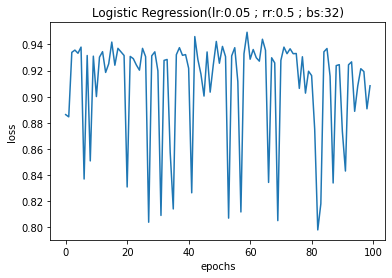

0.49019607843137253
0.3157894736842105
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


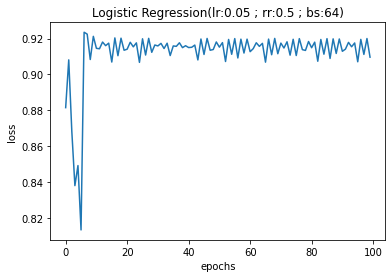

0.5686274509803921
0.35294117647058826
1.0
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


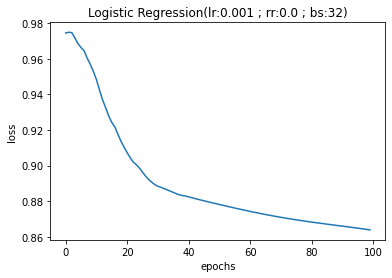

0.5294117647058824
0.2
0.3333333333333333
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


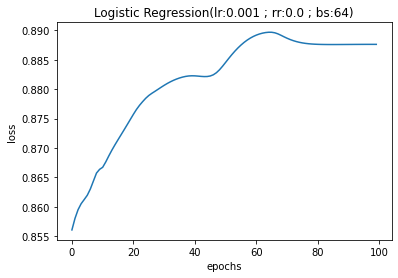

0.43137254901960786
0.18518518518518517
0.4166666666666667
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


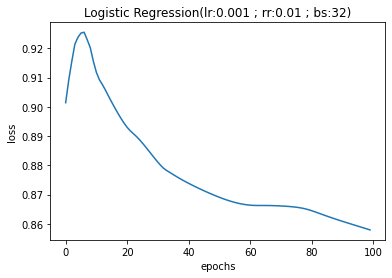

0.43137254901960786
0.18518518518518517
0.4166666666666667
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


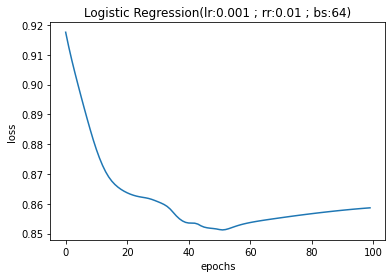

0.49019607843137253
0.25
0.5833333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


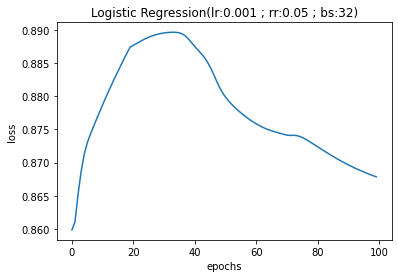

0.39215686274509803
0.1935483870967742
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


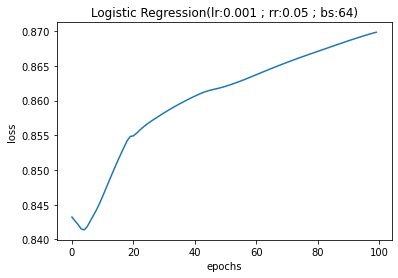

0.47058823529411764
0.2222222222222222
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


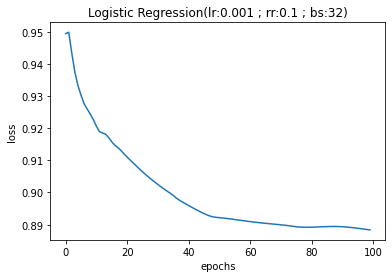

0.5098039215686274
0.3142857142857143
0.9166666666666666
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


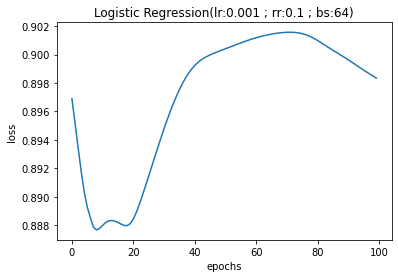

0.5098039215686274
0.2903225806451613
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


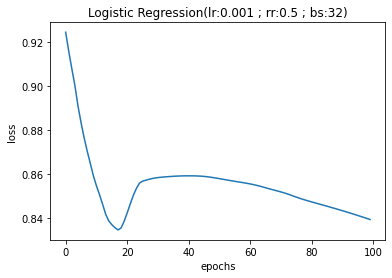

0.5686274509803921
0.32142857142857145
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


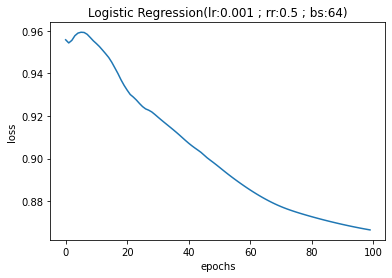

0.5294117647058824
0.2692307692307692
0.5833333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


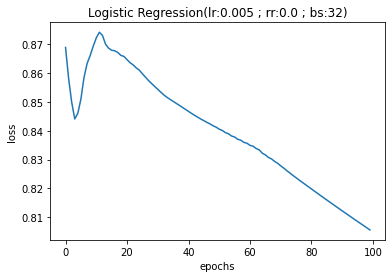

0.6078431372549019
0.3333333333333333
0.6666666666666666
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


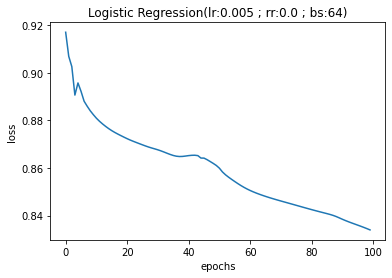

0.5294117647058824
0.2
0.3333333333333333
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


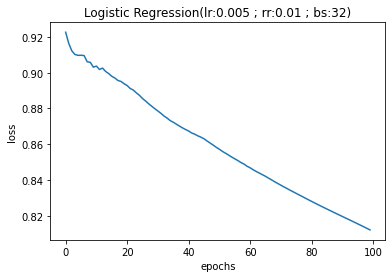

0.6078431372549019
0.34615384615384615
0.75
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


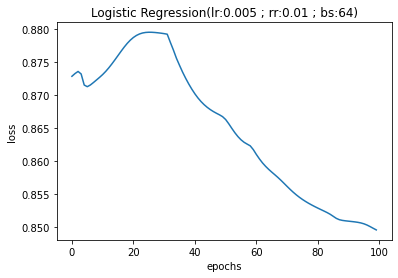

0.4117647058823529
0.21875
0.5833333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


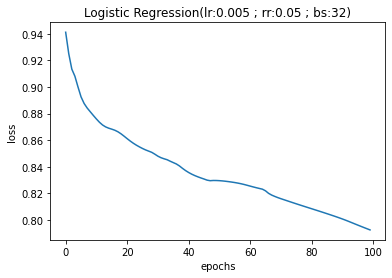

0.39215686274509803
0.1935483870967742
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


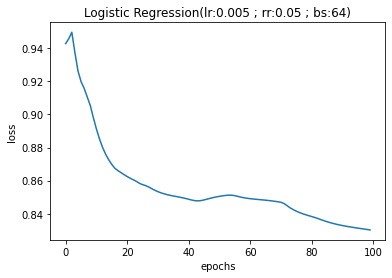

0.5686274509803921
0.2916666666666667
0.5833333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


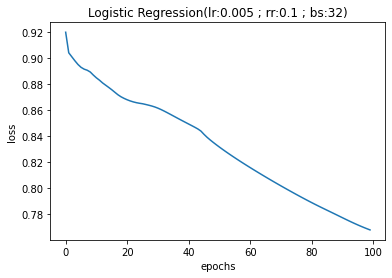

0.5490196078431373
0.2608695652173913
0.5
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


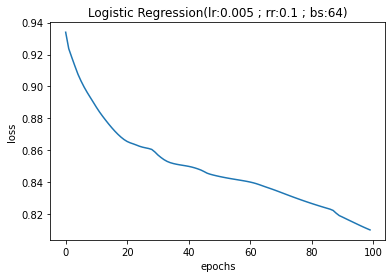

0.6078431372549019
0.3333333333333333
0.6666666666666666
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


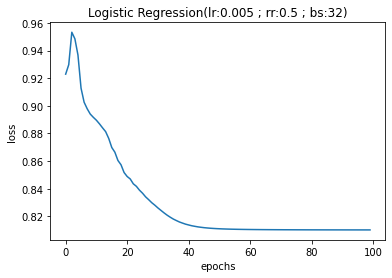

0.5882352941176471
0.3448275862068966
0.8333333333333334
Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


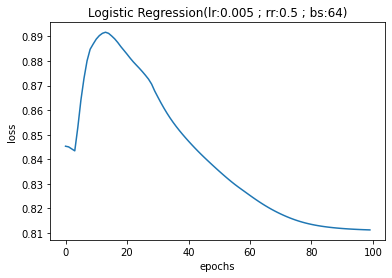

0.5098039215686274
0.2903225806451613
0.75
### FINISHED HYPERPARAMETER SEARCH ###
0.6764705882352942
{'learning_rate': 0.01, 'regularization_rate': 0.1, 'batch_size': 32, 'epoch': 100}


In [ ]:
best_hyperparameters_2, real_accuracy = cross_validation_implementation_for_poverty_dataset_with_features_extracted_from_convolutional_neural_network_learned_from_image_net_provided_by_artificial_intelligence_for_all(data_train, labels_train, data_validation, labels_validation)

In [ ]:
# data_all.shape, data_train.shape, data_validation.shape, new_data_validation.shape, new_data_train.shape, test_p.shape

2. So far we have only evaluated our models in the validation set, now we should deploy it to the test set. Train your best model with the entire training set (i.e. union of the train split and the validation split in the training set) and test it on the test set.

In [ ]:
def save_trained_model(data_train, labels_train,
                  learning_rate, regularization_rate, batch_size, epoch):
  hyperparameters = {
            "learning_rate": learning_rate,
            "regularization_rate": regularization_rate,
            "batch_size": batch_size,
            "epoch": epoch
            }
  
  num_features = data_train.shape[1]
  ## YOUR CODE HERE

  model = LogisticRegression(num_features, learning_rate, regularization_rate, batch_size, epoch)
  model.train(data_train, labels_train) # returns weights of model

  ## END YOUR CODE
  return model

Epoch: 10/100
Epoch: 21/100
Epoch: 32/100
Epoch: 43/100
Epoch: 54/100
Epoch: 65/100
Epoch: 76/100
Epoch: 87/100
Epoch: 98/100


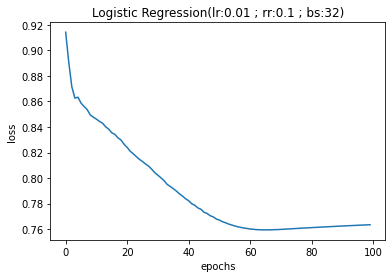

In [ ]:
# not saving model, retraining, so different weights and stuffs

# data_all = all of our training data, labels_all = all of our label training data. Data_all is our new training data
# Now we need test data, so we gonna extract uganda test features and labels. Data_test is our new testing data

data_all = np.concatenate((data_train, data_validation))
labels_all = np.concatenate((labels_train, labels_validation))

data_test = extract_uganda_features(test = True)
labels_test = load_satellite_labels(test = True)

num_features = data_all.shape[1]

batch_size = best_hyperparameters_2["batch_size"]
epoch = best_hyperparameters_2["epoch"]
learning_rate = best_hyperparameters_2["learning_rate"]
regularization_rate = best_hyperparameters_2["regularization_rate"]

model = save_trained_model(data_all, labels_all,\
                  learning_rate = learning_rate, regularization_rate = regularization_rate,\
                  batch_size = batch_size, epoch = epoch)
print(model)

In [ ]:
accuracy3 = model.compute_accuracy(data_test, labels_test)
print(accuracy3)

0.6511627906976745


In [ ]:
data_test

array([[ 6.50037599,  0.58364706,  6.21353276, ...,  4.49353829,
         8.15714282,  1.        ],
       [-1.        , -1.        , -1.        , ..., -1.        ,
        -1.        ,  1.        ],
       [-0.69031585,  1.86564706, -1.        , ..., -0.12800979,
        -1.        ,  1.        ],
       ...,
       [-1.        , -1.        , -1.        , ..., -1.        ,
        -1.        ,  1.        ],
       [-0.98383175, -0.84917647, -1.        , ..., -0.38960686,
        -1.        ,  1.        ],
       [ 7.92487334, -1.        , 10.04857549, ...,  4.49353829,
        17.31428564,  1.        ]])

Now let's see how a confusion matrix does!

In [ ]:
poverty_predictions = model.predict(data_test)

In [ ]:
ones = 0; zeroes = 0

for i in labels_test:
    if i == 1:
        ones+=1
    if i == 0:
        zeroes +=1

print (ones, zeroes)

24 105


In [ ]:
print (poverty_predictions)

In [ ]:
poverty_predictions = np.round(poverty_predictions)
poverty_predictions = poverty_predictions.astype(int)

In [ ]:
### Label 1 = high poverty, Label 0 = low poverty
tn, fp, fn, tp = confusion_matrix(labels_test, poverty_predictions).ravel()

In [ ]:
(tn, fp, fn, tp)

(67, 38, 7, 17)

In [ ]:
precision = tp / (tp + fp)
recall = tp / (tp + fn)

print (precision, recall)

0.3090909090909091 0.7083333333333334


Accuracy doesn't tell the whole picture, especially when data is skewed.

Next Steps

1. Prune hyperparameters - what is reasonable
    - ex. super high learning rates and batch size = 1


2. No random loss-function: not very useful
3. Check in with feature team - are nightlight features actually the best

##Task 4: Improve Your Results

Is your model overfitting? Why or why not? Is there any way to improve it?

Is there any other way to improve your results? E.g. which hyperparameters are the best for the logistic regression model? Can we use other models to classify poverty? Which hyperparameters are the best for those models?

In [ ]:
data_train_vis = extract_uganda_features(test = False)
data_test_vis = extract_uganda_features(test = True)

data_vis = np.concatenate((data_train_vis, data_test_vis))
print (data_vis.shape)

(641, 4097)


## Task 5: Mapping Poverty

The final step is to run your model for each location we've surveyed in Uganda and predict its probability of poverty. Locations with higher probability of being impoverished are shown in red. How does your map predict to the labeled data and the baseline models?

In [ ]:
def get_locs():
    with open(
        os.path.join(ROOT_DIR, "./data/survey_data/uga_2011_locs.txt"),
        "r") as f:
      lines = f.readlines()
    lines = [list(map(float,(line.strip()).split(' '))) for line in lines]
    return np.array(lines)

def rotate(x, t):
    theta = np.radians(t)
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(np.matrix('{} {}; {} {}'.format(c, -s, s, c)))
    return np.dot(x, R)

def change_range(x, newMin, newMax):
    #oldMax = x.max(); oldMin = x.min()
    oldMin = np.array([x[:,0].min(),x[:,1].min()])
    oldMax = np.array([x[:,0].max(),x[:,1].max()])

    oldRange = (oldMax - oldMin)
    newRange = (newMax - newMin)
    y = (((x - oldMin) * newRange) / oldRange) + newMin

    #y = newMax - y
    return y

In [ ]:
def uganda_map(trained_models):
    k = 25
    f, axs = plt.subplots(1,len(trained_models)+1, figsize=(k, k/4))
    img = Image.open(os.path.join(ROOT_DIR, "./data/sample_images/ugout.gif"))
    r, c = np.array(img).shape
    locs = get_locs()
    locs = rotate(locs, 95)
    locs = change_range(locs, np.array([60.,60.]), np.array([500.,500.]))

    X = extract_uganda_features()
    y = np.concatenate((load_satellite_labels(), load_satellite_labels(test=True)))

    for ax in axs:
        ax.imshow(img)

    # scattering our prediction labels

    for i, model in enumerate(trained_models):
        ## YOUR CODE HERE
        poverty_predictions = model.predict(data_vis)
        poverty_predictions = np.round(poverty_predictions.flatten())

        print(poverty_predictions.shape)

        color = np.column_stack([poverty_predictions, np.zeros_like(poverty_predictions), np.zeros_like(poverty_predictions)])

        print(color.shape, locs.shape)

        ## END YOUR CODE
        
        ind = i + 1
        axs[ind].scatter(locs[:,0], locs[:,1], c=color)

        axs[ind].set_title(model.name)
        axs[ind].set_xticklabels([])
        axs[ind].set_yticklabels([])


    # scattering actual labels and their positions

    C = np.column_stack([y, np.zeros_like(y), np.zeros_like(y)])

    print (C.shape)
    
    axs[0].scatter(locs[:,0],locs[:,1], c= C)
    axs[0].set_title("Labels")
    axs[0].set_xticklabels([])
    axs[0].set_yticklabels([])
    plt.show()

In [ ]:
trained_models = [model]
print(trained_models)


(641,)
(641, 3) (641, 2)
(641, 3)


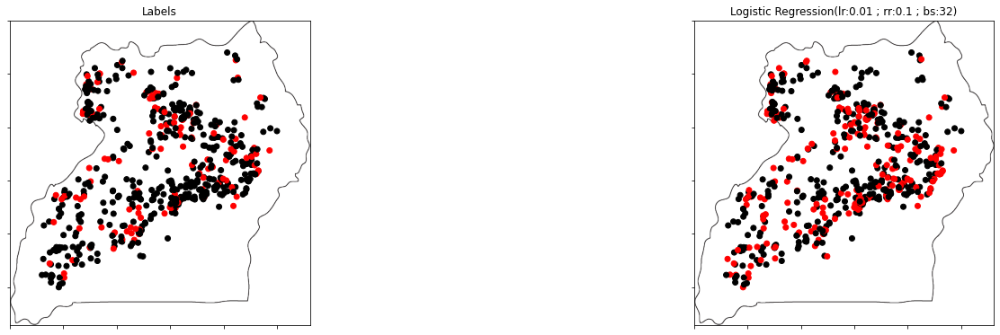

In [ ]:
uganda_map(trained_models)

*  Can you visualize the corresponding satellite images, locations, labels and predicted values of a given index of the data?

*  Can you put your code in two for loops to iterate and visualize all the data of correct and wrong predictions? 

*  Can you visualize the wrong predictions on the map?